## O problemu

**Dataset**: https://www.kaggle.com/datasets/ankitverma2010/ecommerce-customer-churn-analysis-and-prediction

**Atributi dataset-a**: <br>
    CustomerID - Jedinstveni ID korisnika <br>
    Churn - Prekid korišćenja usluge kompanije <br>
    Tenure - Staž korisnika u kompaniji <br>
    PreferredLoginDevice - Odabrani uređaj za prijavu korisnika <br>
    CityTier - Nivo grada <br>
    WarehouseToHome - Udaljenost između skladišta i kuće korisnika <br>
    PreferredPaymentMode - Odabrani način plaćanja korisnika <br>
    Gender - Pol korisnika <br>
    HourSpendOnApp - Broj sati provedenih na mobilnoj aplikaciji ili veb stranici kompanije <br>
    NumberOfDeviceRegistered - Ukupan broj uređaja registrovan na određenog korisnika <br>
    PreferedOrderCat - Odabrana kategorija narudžbine korisnika u poslednjem mesecu <br>
    SatisfactionScore - Ocena zadovoljstva korisnika uslugom <br>
    MaritalStatus - Bračni status korisnika <br>
    NumberOfAddress - Ukupan broj dodatih adresa određenog korisnika <br>
    Complain - Da li je podneta žalba u poslednjem mesecu <br>
    OrderAmountHikeFromlastYear - Postotno povećanje porudžbine u odnosu na prošlu godinu <br>
    CouponUsed - Ukupan broj korišćenih kupona u poslednjem mesecu <br>
    OrderCount - Ukupan broj porudžbina koje su postavljene u poslednjem mesecu <br>
    DaySinceLastOrder - Dani od poslednje porudžbine korisnika <br>
    CashbackAmount - Prosečan povraćaj novca u poslednjem mesecu <br>

## Priprema i preobrada podataka

### Importovanje biblioteka

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore')

### Ucitavanje podataka

In [2]:
df = pd.read_excel('E Commerce Dataset.xlsx', sheet_name='E Comm')
print("Data Shape:",df.shape) 
df.head(10) 

Data Shape: (5630, 20)


,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,129.60
5,50006,1,0.0,Computer,1,22.0,Debit Card,Female,3.0,5,Mobile Phone,5,Single,2,1,22.0,4.0,6.0,7.0,139.19
6,50007,1,NaN,Phone,3,11.0,Cash on Delivery,Male,2.0,3,Laptop & Accessory,2,Divorced,4,0,14.0,0.0,1.0,0.0,120.86
7,50008,1,NaN,Phone,1,6.0,CC,Male,3.0,3,Mobile,2,Divorced,3,1,16.0,2.0,2.0,0.0,122.93
8,50009,1,13.0,Phone,3,9.0,E wallet,Male,NaN,4,Mobile,3,Divorced,2,1,14.0,0.0,1.0,2.0,126.83
9,50010,1,NaN,Phone,1,31.0,Debit Card,Male,2.0,5,Mobile,3,Single,2,0,12.0,1.0,1.0,1.0,122.93


### Informacije o podacima

In [3]:
df.describe()

,CustomerID,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
count,5630.000000,5630.000000,5366.000000,5630.000000,5379.000000,5375.000000,5630.000000,5630.000000,5630.000000,5630.000000,5365.000000,5374.000000,5372.000000,5323.000000,5630.000000
mean,52815.500000,0.168384,10.189899,1.654707,15.639896,2.931535,3.688988,3.066785,4.214032,0.284902,15.707922,1.751023,3.008004,4.543491,177.223030
std,1625.385339,0.374240,8.557241,0.915389,8.531475,0.721926,1.023999,1.380194,2.583586,0.451408,3.675485,1.894621,2.939680,3.654433,49.207036
min,50001.000000,0.000000,0.000000,1.000000,5.000000,0.000000,1.000000,1.000000,1.000000,0.000000,11.000000,0.000000,1.000000,0.000000,0.000000
25%,51408.250000,0.000000,2.000000,1.000000,9.000000,2.000000,3.000000,2.000000,2.000000,0.000000,13.000000,1.000000,1.000000,2.000000,145.770000
50%,52815.500000,0.000000,9.000000,1.000000,14.000000,3.000000,4.000000,3.000000,3.000000,0.000000,15.000000,1.000000,2.000000,3.000000,163.280000
75%,54222.750000,0.000000,16.000000,3.000000,20.000000,3.000000,4.000000,4.000000,6.000000,1.000000,18.000000,2.000000,3.000000,7.000000,196.392500
max,55630.000000,1.000000,61.000000,3.000000,127.000000,5.000000,6.000000,5.000000,22.000000,1.000000,26.000000,16.000000,16.000000,46.000000,324.990000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

Može se primetiti da dataset sadrži i numeričke (CustomerID, Tenure, CityTier, WarehouseToHome, HourSpendOnApp, NumberOfDeviceRegistered, SatisfactionScore, NumberOfAddress, Complain, OrderAmountHikeFromlastYear, CouponUsed, OrderCount, DaySinceLastOrder, CashbackAmount) i kategoričke atribute (Churn, PreferredLoginDevice, PreferredPaymentMode, Gender, PreferedOrderCat, MaritalStatus).

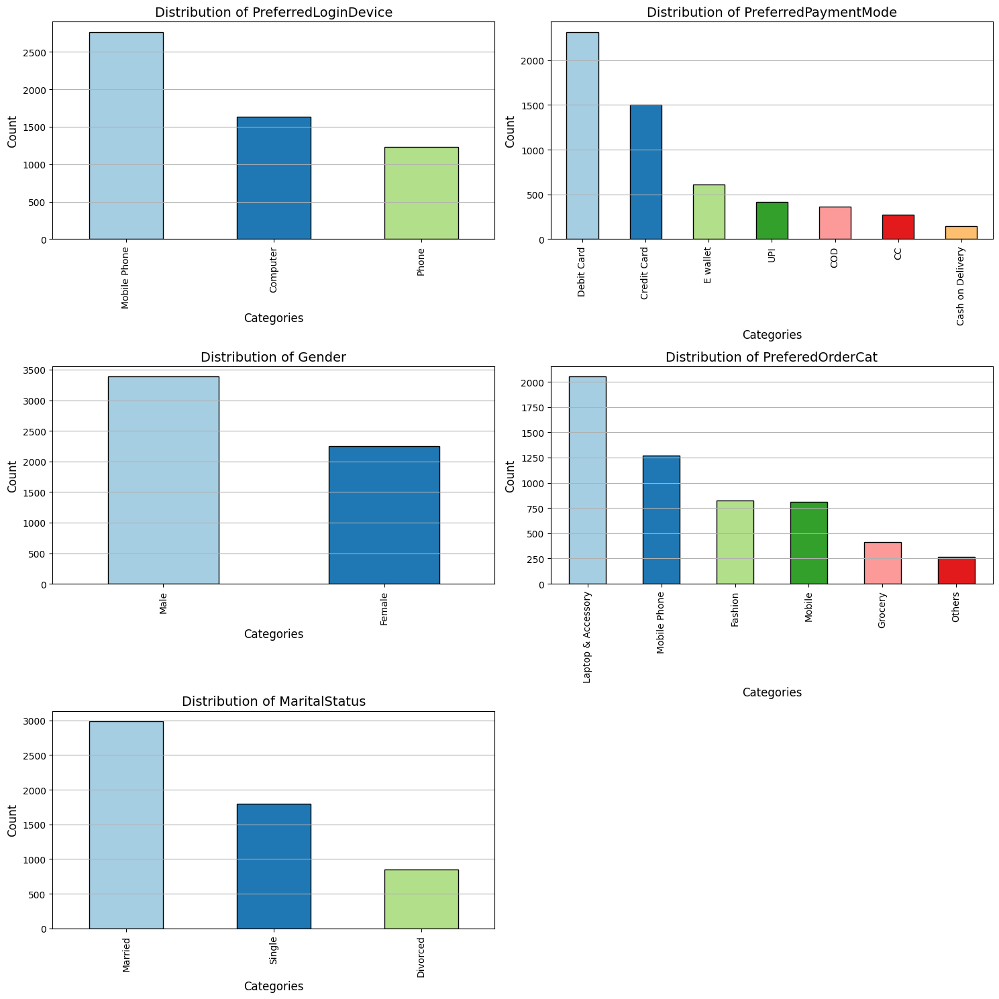

In [5]:
categorical_features = df.select_dtypes(include=['object']).columns
num_plots = len(categorical_features)
num_rows = 3
num_cols = 2

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

for i, feature in enumerate(categorical_features):
    row, col = divmod(i, num_cols)
    ax = axes[row, col]

    colors = plt.cm.Paired(range(len(df[feature].value_counts())))
    df[feature].value_counts().plot(kind='bar', ax=ax, color=colors, edgecolor='black')

    ax.set_title(f'Distribution of {feature}', fontsize=14)
    ax.set_xlabel('Categories', fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    ax.grid(axis='y')

if num_plots % 2 != 0:
    fig.delaxes(axes.flatten()[-1])

plt.tight_layout()
plt.show()

Primećuje se da fičer PrefferedPaymentMode ima duplirane vrednosti (par vrednosti CC i CreditCard, kao i par COD i Cash On Delivery). Stoga je potrebno svaki par objediniti u jedinstvenu vrednost.

In [6]:
df.loc[df['PreferredPaymentMode'] == 'COD', 'PreferredPaymentMode' ] = 'Cash on Delivery'   
df.loc[df['PreferredPaymentMode'] == 'CC', 'PreferredPaymentMode' ] = 'Credit Card'

In [7]:
df['PreferredPaymentMode'].value_counts()

Debit Card          2314
Credit Card         1774
E wallet             614
Cash on Delivery     514
UPI                  414
Name: PreferredPaymentMode, dtype: int64

Slično, vrednosti Mobile Phone i Phone fičera PreferredLoginDevice mogu se objediniti u jedinstvenu vrednost (s obzirom da se telefon koristi u svrhu logovanja, smatramo da je to mobilni telefon).

In [8]:
df.loc[df['PreferredLoginDevice'] == 'Phone', 'PreferredLoginDevice' ] = 'Mobile Phone'
df.loc[df['PreferedOrderCat'] == 'Mobile', 'PreferedOrderCat' ] = 'Mobile Phone'

In [9]:
df['PreferredLoginDevice'].value_counts()

Mobile Phone    3996
Computer        1634
Name: PreferredLoginDevice, dtype: int64

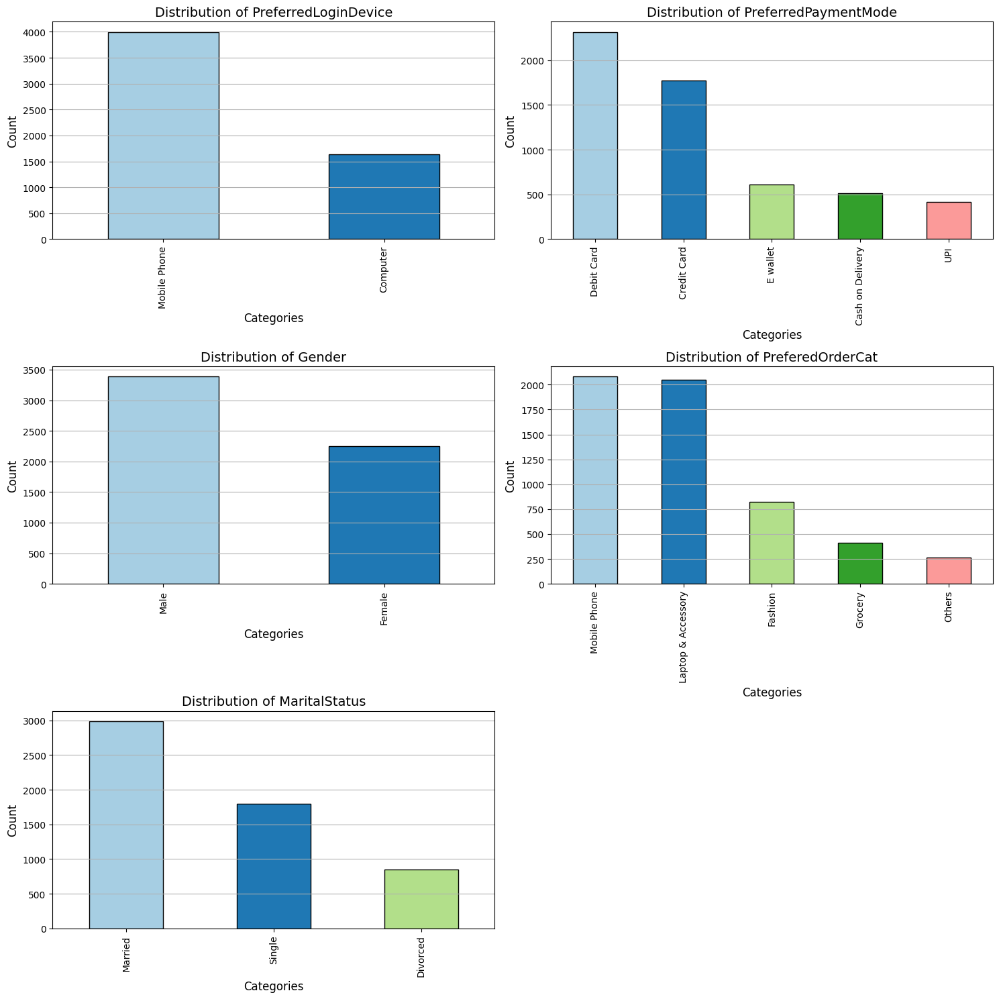

In [10]:
categorical_features = df.select_dtypes(include=['object']).columns
num_plots = len(categorical_features)
num_rows = 3
num_cols = 2

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

for i, feature in enumerate(categorical_features):
    row, col = divmod(i, num_cols)
    ax = axes[row, col]

    colors = plt.cm.Paired(range(len(df[feature].value_counts())))
    df[feature].value_counts().plot(kind='bar', ax=ax, color=colors, edgecolor='black')

    ax.set_title(f'Distribution of {feature}', fontsize=14)
    ax.set_xlabel('Categories', fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    ax.grid(axis='y')

if num_plots % 2 != 0:
    fig.delaxes(axes.flatten()[-1])

plt.tight_layout()
plt.show()

In [11]:
df.nunique()

CustomerID                     5630
Churn                             2
Tenure                           36
PreferredLoginDevice              2
CityTier                          3
WarehouseToHome                  34
PreferredPaymentMode              5
Gender                            2
HourSpendOnApp                    6
NumberOfDeviceRegistered          6
PreferedOrderCat                  5
SatisfactionScore                 5
MaritalStatus                     3
NumberOfAddress                  15
Complain                          2
OrderAmountHikeFromlastYear      16
CouponUsed                       17
OrderCount                       16
DaySinceLastOrder                22
CashbackAmount                 2586
dtype: int64

### Detekcija duplikata

In [12]:
dupl = df.duplicated()
print('Broj duplikata: %d' % dupl.sum())


Broj duplikata: 0


Primećuje se da dataset nema duplikate, stoga nema potrebe za izbacivanjem.

### Tretman nedostajućih vrednosti

In [13]:
# Procenat nedostajućih vrednosti u svakoj koloni
round((df.isnull().sum()*100 / df.shape[0]),2)

CustomerID                     0.00
Churn                          0.00
Tenure                         4.69
PreferredLoginDevice           0.00
CityTier                       0.00
WarehouseToHome                4.46
PreferredPaymentMode           0.00
Gender                         0.00
HourSpendOnApp                 4.53
NumberOfDeviceRegistered       0.00
PreferedOrderCat               0.00
SatisfactionScore              0.00
MaritalStatus                  0.00
NumberOfAddress                0.00
Complain                       0.00
OrderAmountHikeFromlastYear    4.71
CouponUsed                     4.55
OrderCount                     4.58
DaySinceLastOrder              5.45
CashbackAmount                 0.00
dtype: float64

Primećuje se da dataset ima nedostajuće vrednosti za fičere Tenure, WarehouseToHome, HourSpendOnApp, OrderAmountHikeFromlastYear, CouponUsed, OrderCount i DaySinceLastOrder.

Vizuelizacija udela nedostajućih vrednosti po fičerima data je u nastavku.

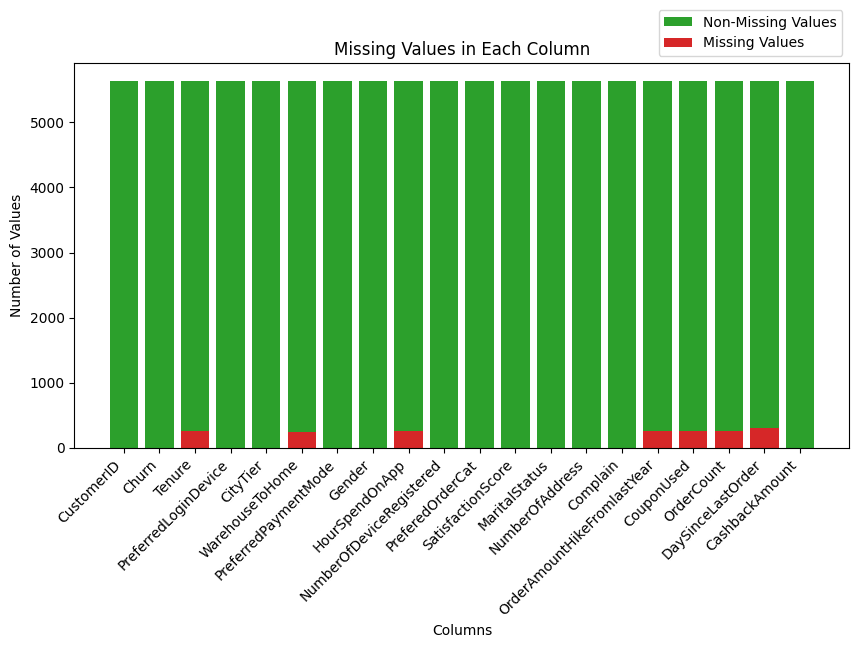

In [14]:
import matplotlib.pyplot as plt
import pandas as pd

total_instances = len(df)
non_null_counts = df.count()

plt.figure(figsize=(10, 5))

plt.bar(non_null_counts.index, total_instances, color="tab:green", label="Non-Missing Values")
plt.bar(non_null_counts.index, total_instances - non_null_counts, color="tab:red", label="Missing Values")

plt.title('Missing Values in Each Column')
plt.xlabel('Columns')
plt.ylabel('Number of Values')
plt.xticks(rotation=45, ha="right")

plt.legend(loc="lower right", bbox_to_anchor=(1, 1))
plt.show()

Sve nedostajuće vrednosti zauzimaju mali udeo u kolonama (manje od 5,5%), stoga ih možemo popuniti.

S obzirom da ne postoje zavisnosti medju instancama vezane za fičere u kojima postoje nedostajuće vrednosti, sve nedostajuće vrednosti mogu se popuniti nekom metodom za random dodelu. U nastavnku je isprobano više tehnika.

In [15]:
df['Tenure'] = df['Tenure'].fillna(method = 'bfill')
df['Tenure'].isnull().sum()

0

<AxesSubplot: xlabel='Tenure', ylabel='Density'>

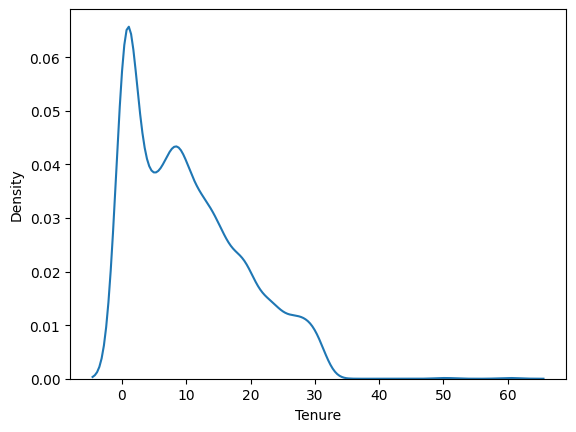

In [16]:
import seaborn as sns 

sns.kdeplot(df , x='Tenure')

In [17]:
df['DaySinceLastOrder'] = df['DaySinceLastOrder'].fillna(method = 'bfill')
df['DaySinceLastOrder'].isnull().sum()

0

<AxesSubplot: xlabel='DaySinceLastOrder', ylabel='Density'>

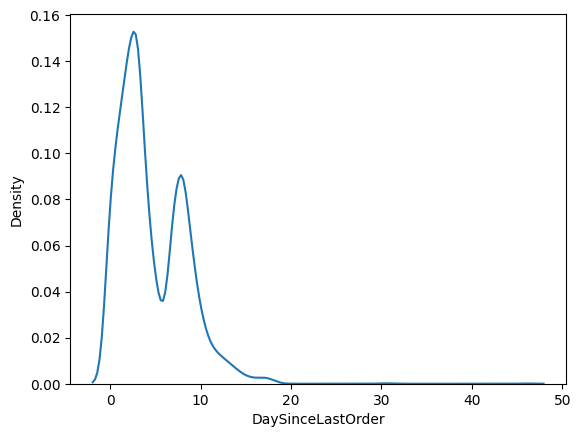

In [18]:
import seaborn as sns 

sns.kdeplot(df , x='DaySinceLastOrder')

In [19]:
from sklearn.impute import SimpleImputer
s_imp = SimpleImputer(missing_values=np.nan , strategy = 'most_frequent')
df['WarehouseToHome'] = s_imp.fit_transform(pd.DataFrame(df['WarehouseToHome']))
df['WarehouseToHome'].isnull().sum()

0

<AxesSubplot: xlabel='WarehouseToHome', ylabel='Density'>

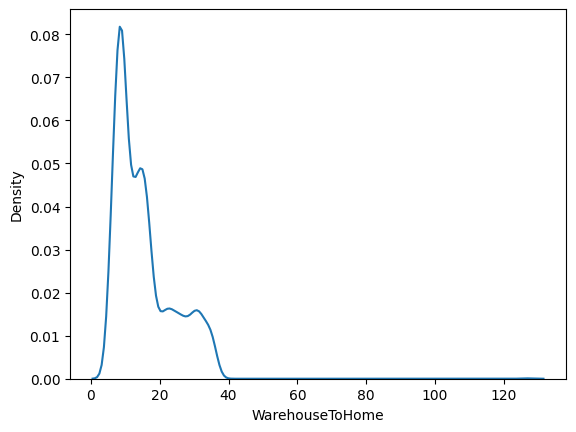

In [20]:
import seaborn as sns 

sns.kdeplot(df , x='WarehouseToHome')

Zamene nedostajućih vrednosti nasumično odabranim vrednostima iz iste kolone.

In [21]:
fill_list = df['HourSpendOnApp'].dropna()
df['HourSpendOnApp'] = df['HourSpendOnApp'].fillna(pd.Series(np.random.choice(fill_list , size = len(df['HourSpendOnApp'].index))))
df['HourSpendOnApp'].isnull().sum()

0

<AxesSubplot: xlabel='HourSpendOnApp', ylabel='Density'>

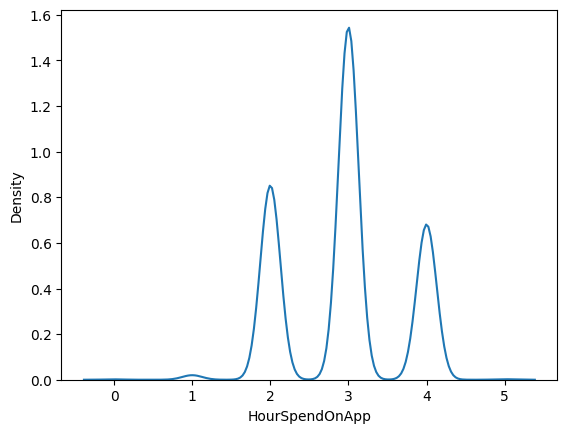

In [22]:
import seaborn as sns 

sns.kdeplot(df , x='HourSpendOnApp')

Forward fill - popunjava nedostajuće vrednosti vrednostima prethodne dostupne celije u istoj koloni.

In [23]:
df['OrderAmountHikeFromlastYear'] = df['OrderAmountHikeFromlastYear'].fillna(method = 'ffill')
df['OrderAmountHikeFromlastYear'].isnull().sum()

0

<AxesSubplot: xlabel='OrderAmountHikeFromlastYear', ylabel='Density'>

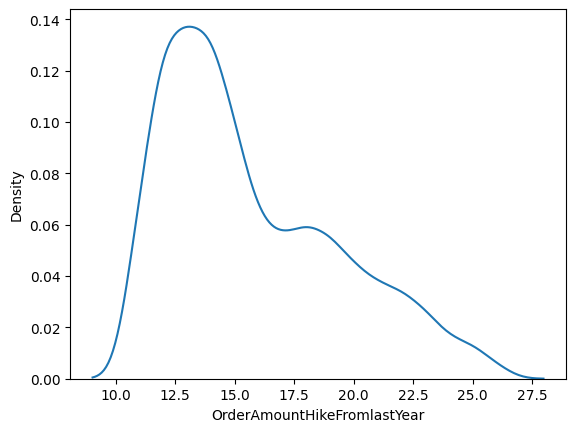

In [24]:
import seaborn as sns 

sns.kdeplot(df , x='OrderAmountHikeFromlastYear')

KKNImputer - za zamenu nedostajućih vrednosti koristiti informacije od dva najbliža suseda. 

Korisna je kada nema jasnog obrasca u nedostajućim podacima i kada je veza između karakteristika nelinearna.

In [25]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=2)
df['CouponUsed']=imputer.fit_transform(df[['CouponUsed']])
df['CouponUsed'].isnull().sum()

0

<AxesSubplot: xlabel='CouponUsed', ylabel='Density'>

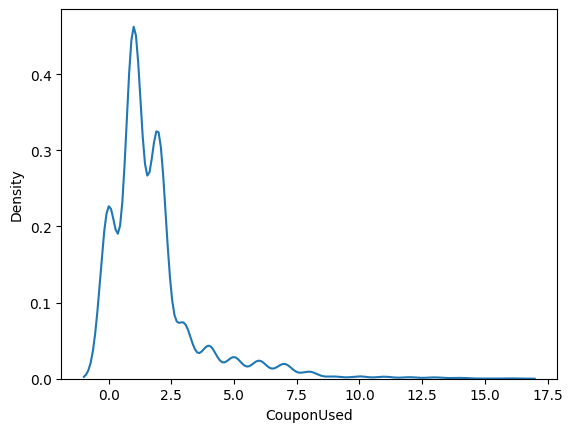

In [26]:
import seaborn as sns 

sns.kdeplot(df , x='CouponUsed')

In [27]:
imputer_2 = KNNImputer(n_neighbors=2)
df['OrderCount']=imputer_2.fit_transform(df[['OrderCount']])
df['OrderCount'].isnull().sum()

0

<AxesSubplot: xlabel='OrderCount', ylabel='Density'>

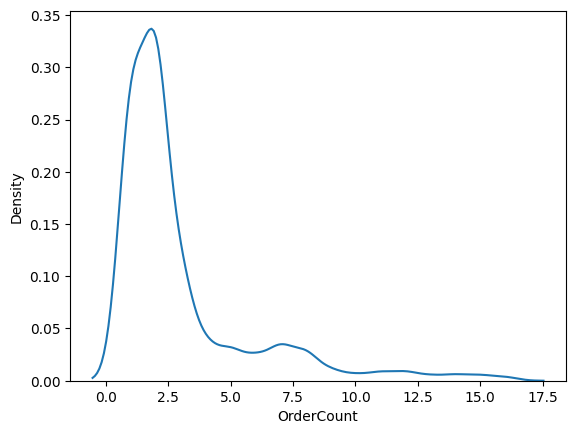

In [28]:
import seaborn as sns 

sns.kdeplot(df , x='OrderCount')

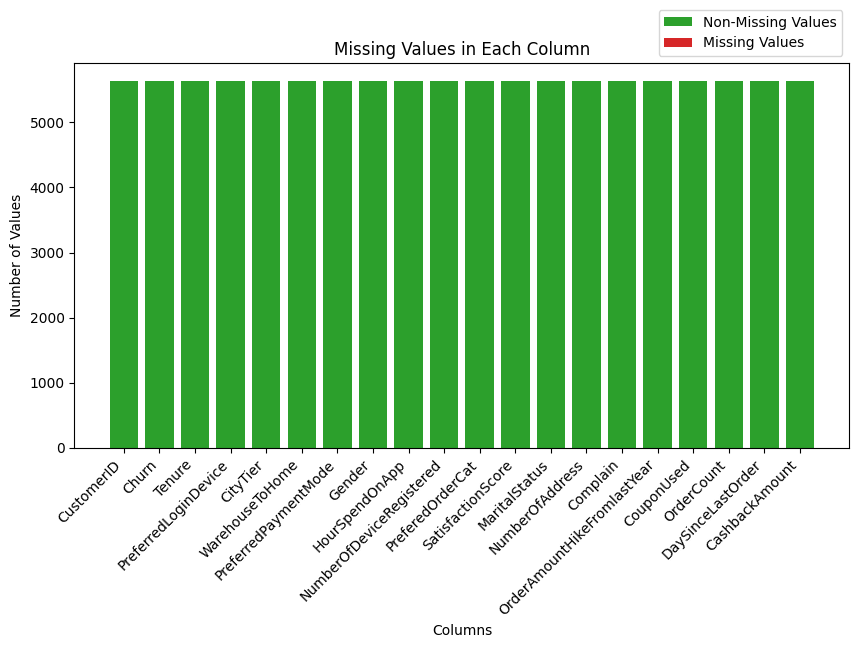

In [29]:
import matplotlib.pyplot as plt
import pandas as pd

total_instances = len(df)
non_null_counts = df.count()

plt.figure(figsize=(10, 5))

plt.bar(non_null_counts.index, total_instances, color="tab:green", label="Non-Missing Values")
plt.bar(non_null_counts.index, total_instances - non_null_counts, color="tab:red", label="Missing Values")

plt.title('Missing Values in Each Column')
plt.xlabel('Columns')
plt.ylabel('Number of Values')
plt.xticks(rotation=45, ha="right")

plt.legend(loc="lower right", bbox_to_anchor=(1, 1))
plt.show()

### Izbacivanje CustomerID kolone

CustomerID kolona sadrži isključivo jedinstvene vrednosti, s toga nema značaja za klasterizaciju i mora biti izbačena.

In [30]:
df.drop('CustomerID' , axis = 1 , inplace = True)
df.shape

(5630, 19)

### Provera opsega fičera

U nastavku je izvršena vizuelizacija distribucije (opsega) vrednosti svakog fičera, kako bi se proverilo da li ima potrebe za diskretizacijom nekih atributa.

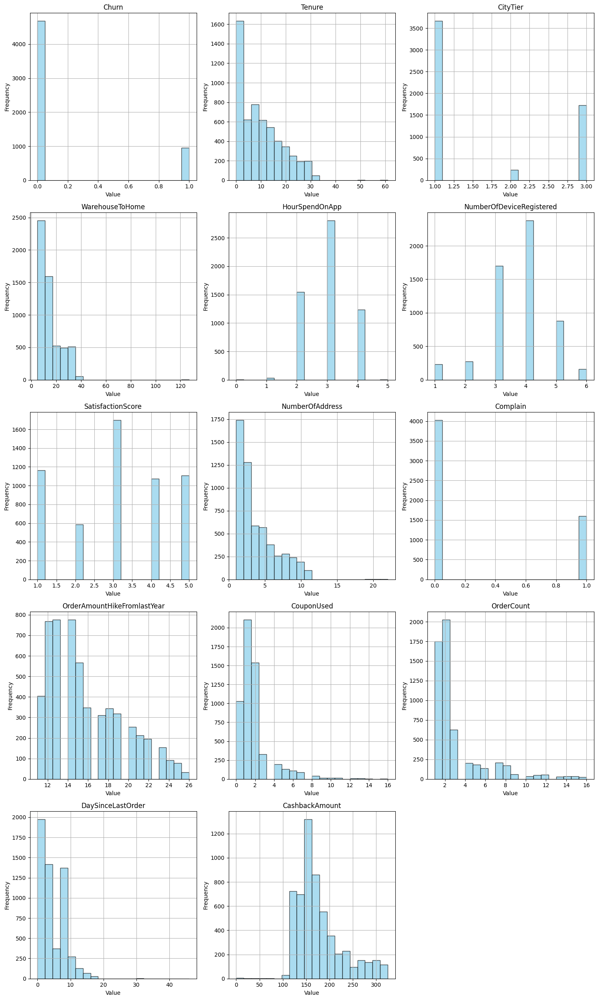

In [31]:
import matplotlib.pyplot as plt

def plot_numerical_feature_distribution(data):
    numerical_features = data.select_dtypes(include=['float64', 'int64'])
    num_features = len(numerical_features.columns)
    num_cols = 3
    num_rows = (num_features + num_cols - 1) // num_cols
    plt.figure(figsize=(15, 5 * num_rows))
    
    for i, col in enumerate(numerical_features.columns, 1):
        plt.subplot(num_rows, num_cols, i)
        data[col].hist(bins=20, color='skyblue', edgecolor='black', alpha=0.7)
        plt.title(col)
        plt.xlabel('Value')
        plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

plot_numerical_feature_distribution(df)


Na osnovu grafikona raspodele vrednosti po fičerima, zaključuje se da nema potrebe vršiti diskretizaciju (nijedan fičer nema isključivo dominantne vrednosti oko nule, svuda postoji manje-više normalna raspodela vrednosti).

### Tretman Outliera

Vrši se grafička vizuelizacija numeričkih fičera kako bi se detektovali (i kasnije) izbacili outlieri.

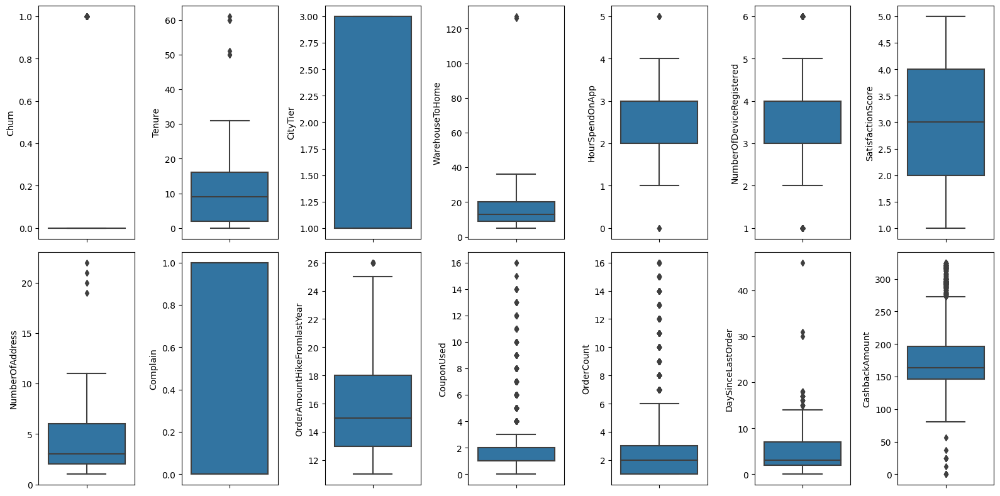

In [32]:
fig, axes = plt.subplots(2, 7, figsize=(16, 8))
numerical_columns = df.select_dtypes(include=['number']).columns

for i, column in enumerate(numerical_columns):
    row = i // 7
    col = i % 7
    sns.boxplot(y=df[column], ax=axes[row, col])

plt.tight_layout()
plt.show()

Outlieri se na osnovu vizuelizacije box plotovima uočavaju kod sledećih fičera: 'Tenure' , 'WarehouseToHome' , 'NumberOfAddress' , 'DaySinceLastOrder' , 'HourSpendOnApp' , 'NumberOfDeviceRegistered'.

Z-Score

In [33]:
def remove_outliers_z_score(df, threshold=3):
    features = [col for col in df.columns if col != 'Class']
    z_scores = np.abs((df[features] - df[features].mean()) / df[features].std())
    outliers_mask = z_scores > threshold
    df_cleaned = df[~outliers_mask.any(axis=1)].copy()
    num_outliers_removed = len(df) - len(df_cleaned)
    print(f"Number of outliers removed: {num_outliers_removed}")
    return df_cleaned

Isolation Forest

In [34]:
from sklearn.ensemble import IsolationForest
 
def remove_outliers_isolation_forest(df, contamination=0.1):
    features = [col for col in df.columns if col != 'Class']
    model = IsolationForest(contamination=contamination, n_estimators=100, max_samples=256, max_features=10, random_state=42)
    model.fit(df[features])
    outliers = model.predict(df[features])
    df['Outlier'] = outliers
    df_cleaned = df[df['Outlier'] == 1].drop(columns=['Outlier'])
    num_outliers_removed = len(df) - len(df_cleaned)
    print(num_outliers_removed)
    return df_cleaned

Local Outlier Factor

In [35]:
from sklearn.neighbors import LocalOutlierFactor
 
def remove_outliers_lof(df, contamination=0.1):
    features = [col for col in df.columns if col != 'Class']
    model = LocalOutlierFactor(n_neighbors=20, contamination=contamination)
    outliers = model.fit_predict(df[features])
    df['Outlier'] = outliers
    df_cleaned = df[df['Outlier'] == 1].drop(columns=['Outlier'])
    num_outliers_removed = len(df) - len(df_cleaned)
    print(num_outliers_removed)
    return df_cleaned

IRQ metod

In [36]:
def handle_outliers(df , column_name):
  Q1 = df[column_name].quantile(0.25)
  Q3 = df[column_name].quantile(0.75)
  IQR = Q3 - Q1

  Upper = Q3 + IQR * 1.5
  lower = Q1 - IQR * 1.5

  new_df = df[ (df[column_name] > lower) & (df[column_name] < Upper) ]

  return new_df

df.columns

Index(['Churn', 'Tenure', 'PreferredLoginDevice', 'CityTier',
       'WarehouseToHome', 'PreferredPaymentMode', 'Gender', 'HourSpendOnApp',
       'NumberOfDeviceRegistered', 'PreferedOrderCat', 'SatisfactionScore',
       'MaritalStatus', 'NumberOfAddress', 'Complain',
       'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder', 'CashbackAmount'],
      dtype='object')

Isprobavanjem različitih tehnika za izbacivanje outliera, najbolje rezultate davala je IRQ metoda, stoga će ona konačno biti korišćena.

In [37]:
cols_outliers = ['Tenure' , 'WarehouseToHome' , 'NumberOfAddress' , 'DaySinceLastOrder' , 'HourSpendOnApp' , 'NumberOfDeviceRegistered']

for col in cols_outliers:
    df = handle_outliers(df , col)

df.head(10)

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,1,0.0,Mobile Phone,1,8.0,UPI,Male,3.0,4,Mobile Phone,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,1,0.0,Mobile Phone,1,30.0,Debit Card,Male,2.0,4,Mobile Phone,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,1,0.0,Mobile Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,1,0.0,Mobile Phone,1,12.0,Credit Card,Male,4.0,3,Mobile Phone,5,Single,3,0,11.0,1.0,1.0,3.0,129.60
5,1,0.0,Computer,1,22.0,Debit Card,Female,3.0,5,Mobile Phone,5,Single,2,1,22.0,4.0,6.0,7.0,139.19
6,1,13.0,Mobile Phone,3,11.0,Cash on Delivery,Male,2.0,3,Laptop & Accessory,2,Divorced,4,0,14.0,0.0,1.0,0.0,120.86
7,1,13.0,Mobile Phone,1,6.0,Credit Card,Male,3.0,3,Mobile Phone,2,Divorced,3,1,16.0,2.0,2.0,0.0,122.93
8,1,13.0,Mobile Phone,3,9.0,E wallet,Male,2.0,4,Mobile Phone,3,Divorced,2,1,14.0,0.0,1.0,2.0,126.83
9,1,4.0,Mobile Phone,1,31.0,Debit Card,Male,2.0,5,Mobile Phone,3,Single,2,0,12.0,1.0,1.0,1.0,122.93


Vizuelizacija numeričkih fičera nakon izbacivanja outliera data je u nastavku.

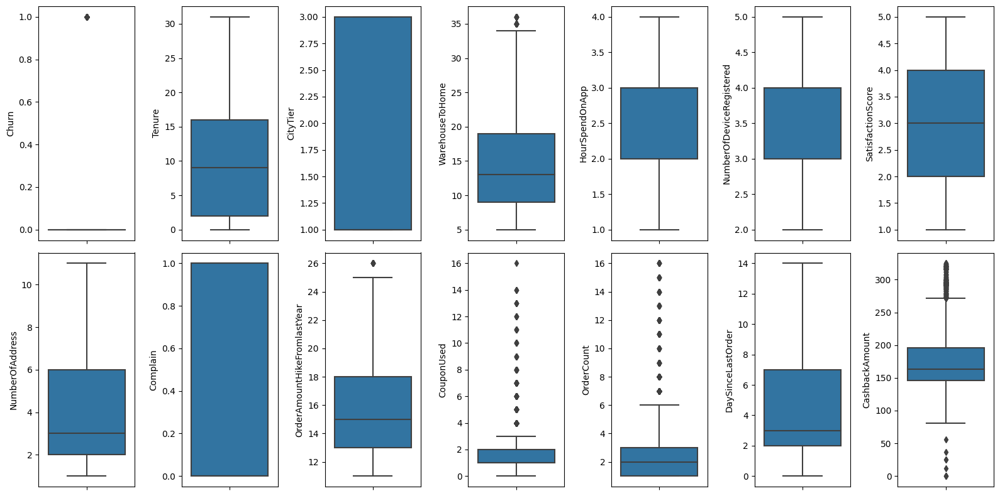

In [38]:
fig, axes = plt.subplots(2, 7, figsize=(16, 8))

for i, column in enumerate(numerical_columns):
    row = i // 7
    col = i % 7
    sns.boxplot(y=df[column], ax=axes[row, col])

plt.tight_layout()
plt.show()

### Korelacija fičera

In [39]:
corr_matrix = df.corr()
corr_matrix

,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
Churn,1.000000,-0.336101,0.069537,0.054686,0.003543,0.079044,0.108745,0.033766,0.252305,-0.002585,-0.017950,-0.036632,-0.164491,-0.165110
Tenure,-0.336101,1.000000,-0.065989,-0.011923,-0.006746,-0.019661,-0.013232,0.241003,-0.023950,0.017144,0.127288,0.181098,0.164419,0.453959
CityTier,0.069537,-0.065989,1.000000,0.014497,-0.011322,0.007153,-0.009541,-0.033269,0.006224,-0.022201,0.017083,0.035561,0.023336,0.044817
WarehouseToHome,0.054686,-0.011923,0.014497,1.000000,0.084244,0.028872,0.014065,0.001310,0.021930,0.028839,0.013096,0.016098,0.044805,0.036134
HourSpendOnApp,0.003543,-0.006746,-0.011322,0.084244,1.000000,0.274920,0.031987,0.139772,-0.003557,0.102369,0.182716,0.105865,0.084261,0.118272
NumberOfDeviceRegistered,0.079044,-0.019661,0.007153,0.028872,0.274920,1.000000,-0.000789,0.071218,-0.002170,0.061211,0.135914,0.092372,0.025980,0.119878
SatisfactionScore,0.108745,-0.013232,-0.009541,0.014065,0.031987,-0.000789,1.000000,0.052228,-0.028413,-0.021398,0.012415,0.012128,-0.000567,0.003048
NumberOfAddress,0.033766,0.241003,-0.033269,0.001310,0.139772,0.071218,0.052228,1.000000,-0.026742,0.019600,0.042443,-0.002068,-0.065444,0.193751
Complain,0.252305,-0.023950,0.006224,0.021930,-0.003557,-0.002170,-0.028413,-0.026742,1.000000,-0.006975,0.001547,-0.007300,-0.029660,0.001687
OrderAmountHikeFromlastYear,-0.002585,0.017144,-0.022201,0.028839,0.102369,0.061211,-0.021398,0.019600,-0.006975,1.000000,0.030545,0.034114,0.006054,0.039552


<AxesSubplot: >

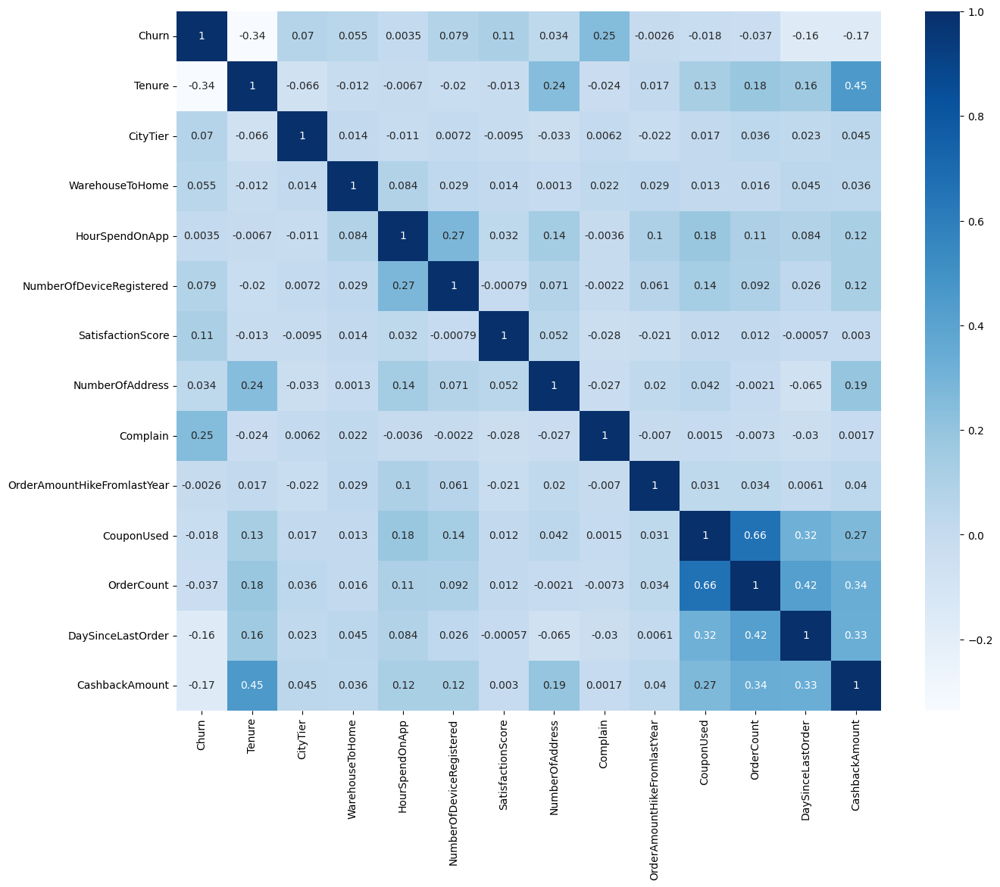

In [40]:
plt.figure(figsize = (15,12))
sns.heatmap(df.corr() , annot = True , cmap = 'Blues')

### Kodiranje kategoričkih fičera

Potrebno je izvršiti kodiranje svih kategoričkih fičera u dataset-u.

In [41]:
data = df[df.select_dtypes(exclude=np.number).columns]
data

,PreferredLoginDevice,PreferredPaymentMode,Gender,PreferedOrderCat,MaritalStatus
0,Mobile Phone,Debit Card,Female,Laptop & Accessory,Single
1,Mobile Phone,UPI,Male,Mobile Phone,Single
2,Mobile Phone,Debit Card,Male,Mobile Phone,Single
3,Mobile Phone,Debit Card,Male,Laptop & Accessory,Single
4,Mobile Phone,Credit Card,Male,Mobile Phone,Single
...,...,...,...,...,...
5625,Computer,Credit Card,Male,Laptop & Accessory,Married
5626,Mobile Phone,Credit Card,Male,Fashion,Married
5627,Mobile Phone,Debit Card,Male,Laptop & Accessory,Married
5628,Computer,Credit Card,Male,Laptop & Accessory,Married


Za fičere kod kojih se uočava jasan i prirodan redosled medju vrednostima, kao što je to slučaj kod Gender, PreferredLoginDevice i MaritalStatus, biće korišćen Label Encoder u svrhu kodiranja.  

In [42]:
from sklearn.calibration import LabelEncoder

le = LabelEncoder()
columns=['PreferredLoginDevice', 'Gender', 'MaritalStatus']

for i in columns:
  if df[i].dtype == 'object':
    df[i] = le.fit_transform(df[i])

df.head(10)

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,1,4.0,1,3,6.0,Debit Card,0,3.0,3,Laptop & Accessory,2,2,9,1,11.0,1.0,1.0,5.0,159.93
1,1,0.0,1,1,8.0,UPI,1,3.0,4,Mobile Phone,3,2,7,1,15.0,0.0,1.0,0.0,120.90
2,1,0.0,1,1,30.0,Debit Card,1,2.0,4,Mobile Phone,3,2,6,1,14.0,0.0,1.0,3.0,120.28
3,1,0.0,1,3,15.0,Debit Card,1,2.0,4,Laptop & Accessory,5,2,8,0,23.0,0.0,1.0,3.0,134.07
4,1,0.0,1,1,12.0,Credit Card,1,4.0,3,Mobile Phone,5,2,3,0,11.0,1.0,1.0,3.0,129.60
5,1,0.0,0,1,22.0,Debit Card,0,3.0,5,Mobile Phone,5,2,2,1,22.0,4.0,6.0,7.0,139.19
6,1,13.0,1,3,11.0,Cash on Delivery,1,2.0,3,Laptop & Accessory,2,0,4,0,14.0,0.0,1.0,0.0,120.86
7,1,13.0,1,1,6.0,Credit Card,1,3.0,3,Mobile Phone,2,0,3,1,16.0,2.0,2.0,0.0,122.93
8,1,13.0,1,3,9.0,E wallet,1,2.0,4,Mobile Phone,3,0,2,1,14.0,0.0,1.0,2.0,126.83
9,1,4.0,1,1,31.0,Debit Card,1,2.0,5,Mobile Phone,3,2,2,0,12.0,1.0,1.0,1.0,122.93


S druge strane, za preostale kategoričke fičere, PrefferedPaymentMode i PreferedOrderCat, biće korišćen One Hot Encoding, s obzirom da ne postoji prirodan redosled medju kategorijama vrednosti ovih fičera.

In [43]:
df = pd.get_dummies(df, columns=['PreferredPaymentMode', 'PreferedOrderCat'])

df.head(10)

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,Gender,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,MaritalStatus,...,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,PreferedOrderCat_Fashion,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others
0,1,4.0,1,3,6.0,0,3.0,3,2,2,...,0,0,1,0,0,0,0,1,0,0
1,1,0.0,1,1,8.0,1,3.0,4,3,2,...,0,0,0,0,1,0,0,0,1,0
2,1,0.0,1,1,30.0,1,2.0,4,3,2,...,0,0,1,0,0,0,0,0,1,0
3,1,0.0,1,3,15.0,1,2.0,4,5,2,...,0,0,1,0,0,0,0,1,0,0
4,1,0.0,1,1,12.0,1,4.0,3,5,2,...,0,1,0,0,0,0,0,0,1,0
5,1,0.0,0,1,22.0,0,3.0,5,5,2,...,0,0,1,0,0,0,0,0,1,0
6,1,13.0,1,3,11.0,1,2.0,3,2,0,...,1,0,0,0,0,0,0,1,0,0
7,1,13.0,1,1,6.0,1,3.0,3,2,0,...,0,1,0,0,0,0,0,0,1,0
8,1,13.0,1,3,9.0,1,2.0,4,3,0,...,0,0,0,1,0,0,0,0,1,0
9,1,4.0,1,1,31.0,1,2.0,5,3,2,...,0,0,1,0,0,0,0,0,1,0


U nastavku su prikazani tipovi svih fičera dataset-a, nakon izvršenog kodiranja svih kategoričkih vrednosti.

In [44]:
df.dtypes

Churn                                      int64
Tenure                                   float64
PreferredLoginDevice                       int32
CityTier                                   int64
WarehouseToHome                          float64
Gender                                     int32
HourSpendOnApp                           float64
NumberOfDeviceRegistered                   int64
SatisfactionScore                          int64
MaritalStatus                              int32
NumberOfAddress                            int64
Complain                                   int64
OrderAmountHikeFromlastYear              float64
CouponUsed                               float64
OrderCount                               float64
DaySinceLastOrder                        float64
CashbackAmount                           float64
PreferredPaymentMode_Cash on Delivery      uint8
PreferredPaymentMode_Credit Card           uint8
PreferredPaymentMode_Debit Card            uint8
PreferredPaymentMode

## Klasterizacija

### Skaliranje

Isprobavanjem različitih varijanti za skaliranje (MinMax, Standard, Robust Scaler), istanovljeno je da najbolje rezultate za kasniju klasterizaciju daje Standard Scaler, te će on biti korišćen.

In [45]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

scaler = StandardScaler()
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

df.describe()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,Gender,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,MaritalStatus,...,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,PreferedOrderCat_Fashion,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others
count,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,...,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03,5.154000e+03
mean,-7.444569e-17,-7.720294e-17,5.859151e-17,-4.204803e-17,6.065945e-17,5.273236e-17,-2.205798e-16,1.764639e-16,-2.481523e-17,-6.617395e-17,...,1.688814e-17,-4.825183e-17,-3.549956e-17,-1.792211e-17,1.757745e-17,6.203807e-18,-6.410601e-17,-4.256501e-17,4.773485e-17,6.893119e-19
std,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,...,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00,1.000097e+00
min,-4.484625e-01,-1.202161e+00,-1.562238e+00,-7.194627e-01,-1.262736e+00,-1.219119e+00,-2.686962e+00,-2.180619e+00,-1.500068e+00,-1.745068e+00,...,-3.182484e-01,-6.791896e-01,-8.292302e-01,-3.543632e-01,-2.813285e-01,-4.203717e-01,-2.732134e-01,-7.577738e-01,-7.663624e-01,-2.185725e-01
25%,-4.484625e-01,-9.648051e-01,-1.562238e+00,-7.194627e-01,-7.705710e-01,-1.219119e+00,-1.300160e+00,-9.273955e-01,-7.732326e-01,-2.497928e-01,...,-3.182484e-01,-6.791896e-01,-8.292302e-01,-3.543632e-01,-2.813285e-01,-4.203717e-01,-2.732134e-01,-7.577738e-01,-7.663624e-01,-2.185725e-01
50%,-4.484625e-01,-1.340596e-01,6.401073e-01,-7.194627e-01,-2.784063e-01,8.202643e-01,8.664146e-02,3.258285e-01,-4.639678e-02,-2.497928e-01,...,-3.182484e-01,-6.791896e-01,-8.292302e-01,-3.543632e-01,-2.813285e-01,-4.203717e-01,-2.732134e-01,-7.577738e-01,-7.663624e-01,-2.185725e-01
75%,-4.484625e-01,6.966860e-01,6.401073e-01,1.461779e+00,4.598407e-01,8.202643e-01,8.664146e-02,3.258285e-01,6.804391e-01,1.245482e+00,...,-3.182484e-01,1.472343e+00,1.205938e+00,-3.543632e-01,-2.813285e-01,-4.203717e-01,-2.732134e-01,1.319655e+00,1.304866e+00,-2.185725e-01
max,2.229841e+00,2.476855e+00,6.401073e-01,1.461779e+00,2.551541e+00,8.202643e-01,1.473443e+00,1.579052e+00,1.407275e+00,1.245482e+00,...,3.142200e+00,1.472343e+00,1.205938e+00,2.821964e+00,3.554563e+00,2.378847e+00,3.660143e+00,1.319655e+00,1.304866e+00,4.575141e+00


### K-Means

#### Procena i izbor optimalnog broja klastera "ručno"

U svrhu izbora optimalnog broja klastera, upotrebljene su dve metode: Elbow metoda i Silhouette koeficijent

##### Elbow metoda

In [46]:
from sklearn.cluster import KMeans

kmeans_kwargs = {
     "init": "random",
     "n_init": 10,
     "max_iter": 300,
     "random_state": 42,
 }

sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(df)
    sse.append(kmeans.inertia_)

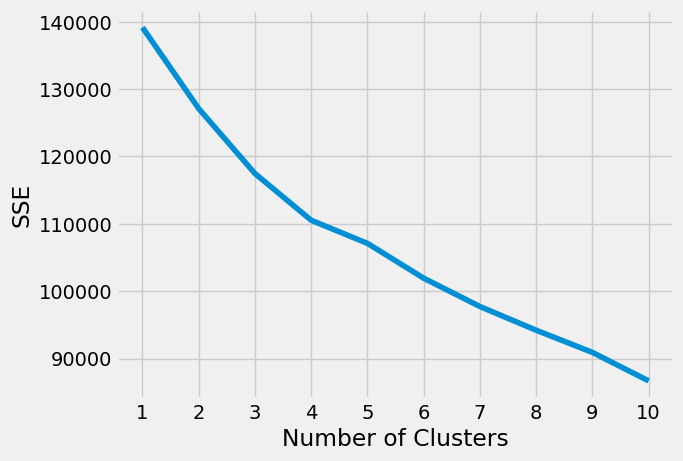

In [47]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [48]:
from kneed import KneeLocator

kl = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")
kl.elbow

4

Elbow metoda daje procenu da je 4 optimalan broj klastera.

##### Silhouette koeficijent

In [66]:
from sklearn.metrics import silhouette_score

silhouette_coefficients = []

for k in range(2, 10):
    kmeans = KMeans(n_clusters=k,  random_state=42)
    kmeans.fit(df)
    score = silhouette_score(df, kmeans.labels_)
    silhouette_coefficients.append(score)

In [67]:
print(silhouette_coefficients)

[0.07647583740448217, 0.08908587283679102, 0.11222748395319611, 0.11343129510657392, 0.13174133916096412, 0.1339840819214505, 0.1032758002495779, 0.11820968543272012]


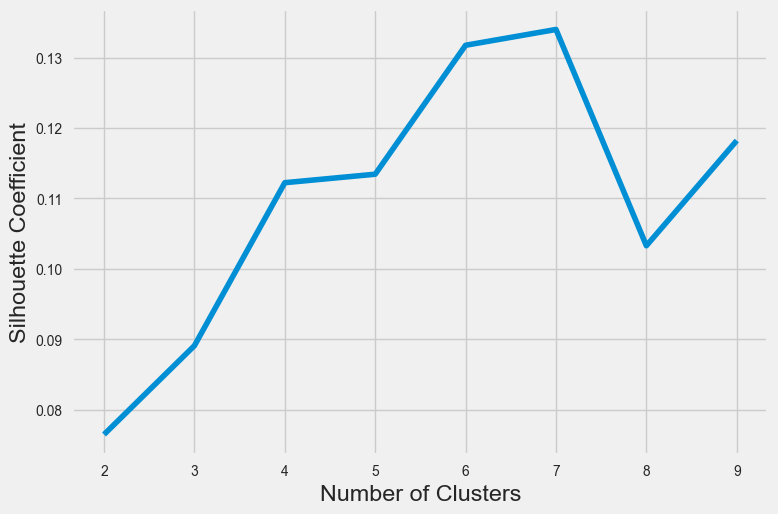

In [65]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 10), silhouette_coefficients)
plt.xticks(range(2, 10))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

Silhouette koeficijent ima najveću vrednost za 7 klastera, te zaključujemo da je po ovoj metodi to optimalan broj.

#### Procena i izbor optimalnog broja klastera - yellowbrick

In [52]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

def elbowDist(df: pd.DataFrame):
    elbow = KElbowVisualizer(KMeans(), k=(2,12))
    elbow.fit(df)
    elbow.show()

In [53]:
#elbowDist(df)

In [54]:
def elbowCH(df: pd.DataFrame):
    elbow = KElbowVisualizer(KMeans(), k=(2,12), metric='calinski_harabasz')
    elbow.fit(df)
    elbow.show()

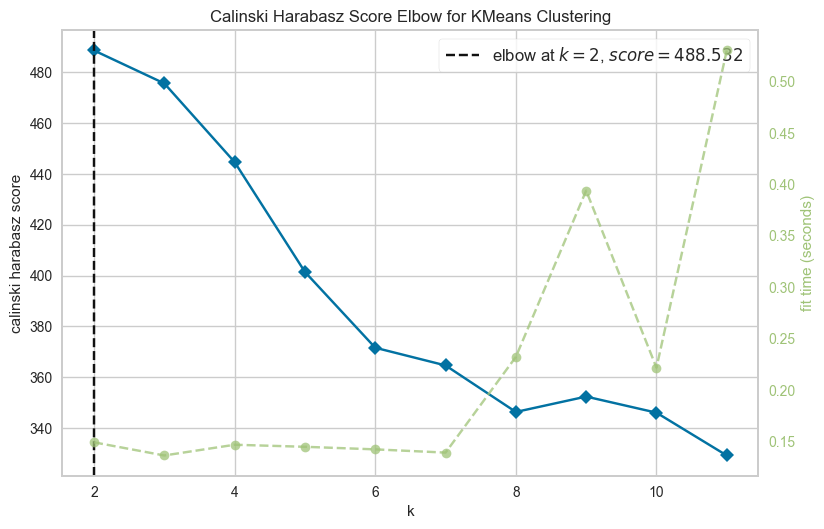

In [55]:
elbowCH(df)

Jasno se vidi da je po Calinski Harabasz metrici optimalan broj klastera 2.

In [56]:
def elbowSil(df: pd.DataFrame):
    elbow = KElbowVisualizer(KMeans(), k=(2,12), metric='silhouette')
    elbow.fit(df)
    elbow.show()

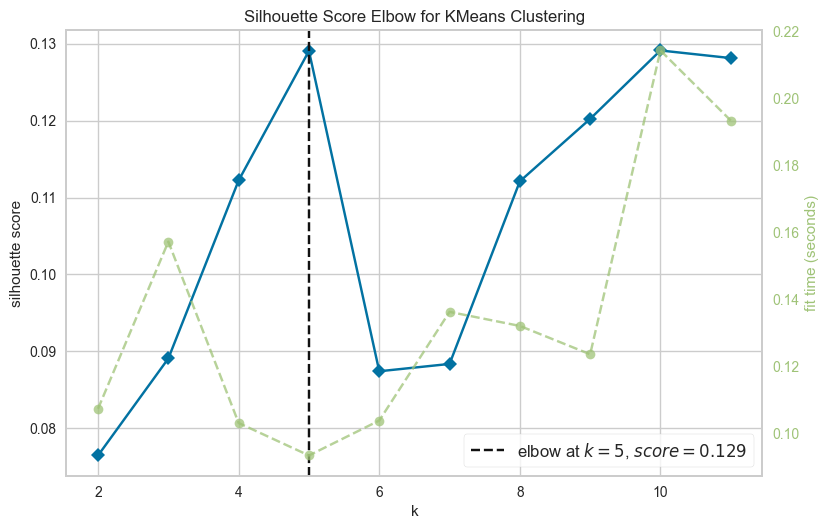

In [57]:
elbowSil(df)

Po Silhouette skoru, optimalan broj klastera je 5.

#### PCA predobrada

U slučajevima kada nema koncentracije podataka ili jasne separacije po grupama, preporučuje se pokušaj smanjenja dimenzija podataka pomoću PCA metode.

In [58]:
from sklearn.decomposition import PCA

pca = PCA(n_components=15)
pca.fit_transform(df)
pca.explained_variance_ratio_.cumsum()

array([0.12075263, 0.19537897, 0.25879268, 0.31702785, 0.36970332,
       0.41929917, 0.46373585, 0.50784222, 0.54994104, 0.59099439,
       0.63076471, 0.6699439 , 0.70726989, 0.74349119, 0.77859809])

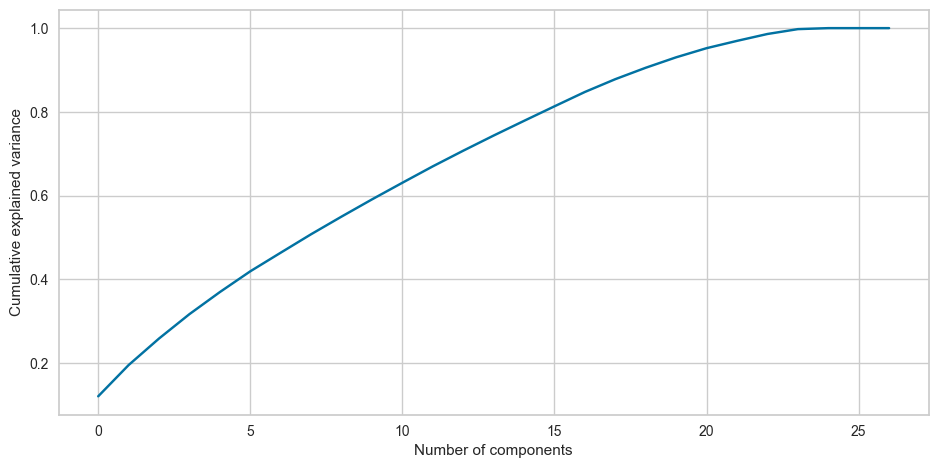

In [59]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(df)
data_pca = pca.transform(df)
plt.figure(figsize=(10, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.show()

S obzirom da prvih 7 PCA dimenzija objašnjava oko 50% podataka, opredeljujemo se za primenu PCA sa 7 komponenti.

In [68]:
pca = PCA(n_components=7)
X_pca = pca.fit_transform(df)

#### K-Means - 2 klastera

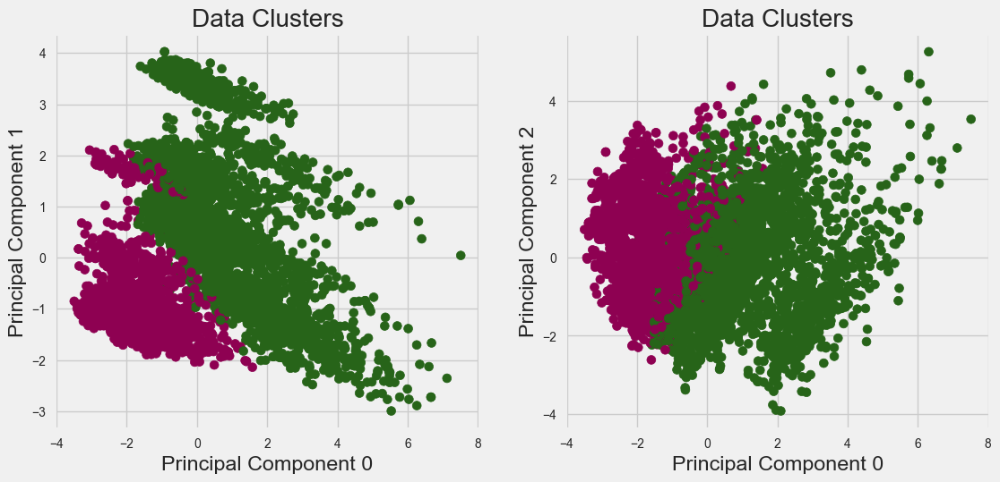

In [69]:
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='PiYG', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

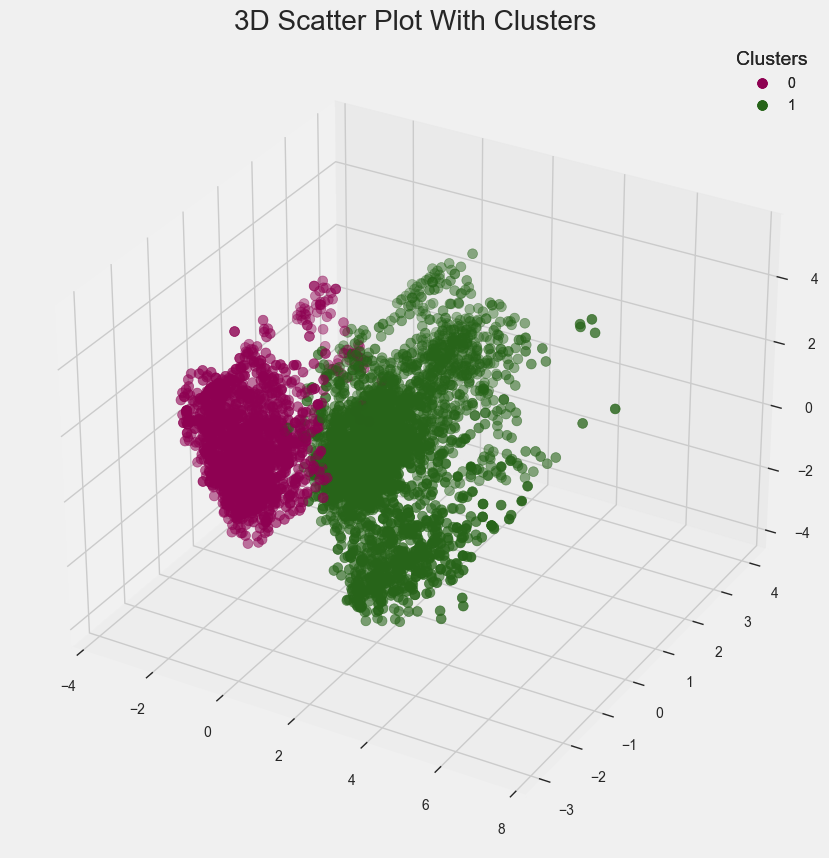

In [70]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='PiYG', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

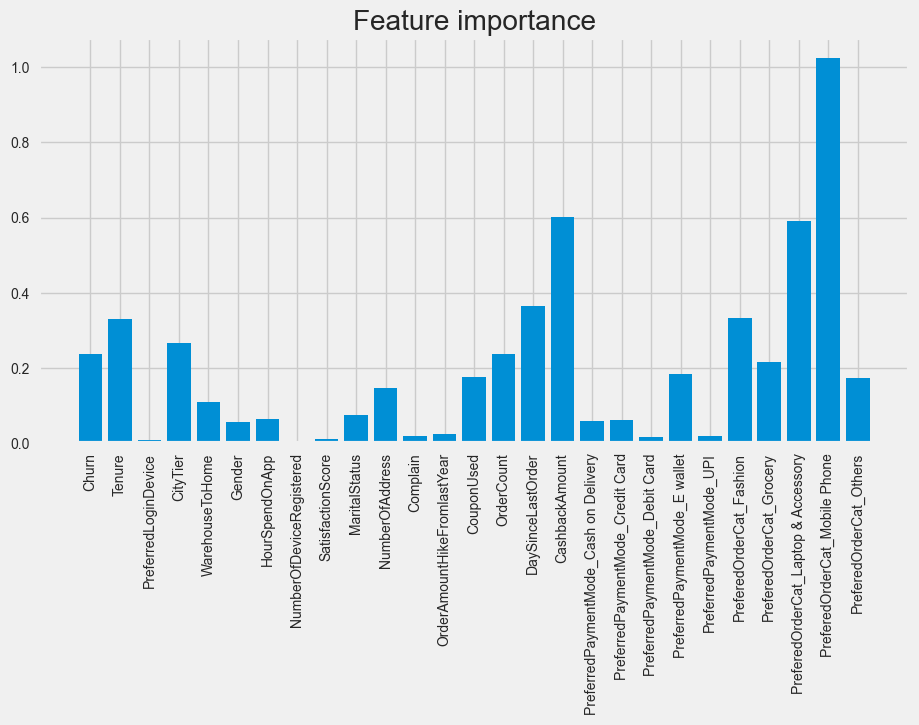

In [71]:
cent = kmeans.cluster_centers_
feature_importance = cent.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()

In [72]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone'],
      dtype='object')


In [73]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(2)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(2), index=important_columns)

In [74]:
cluster_data

,0,1
Tenure,-0.415749,0.245600
DaySinceLastOrder,-0.460262,0.271895
CashbackAmount,-0.758016,0.447791
PreferedOrderCat_Fashion,-0.417447,0.246603
PreferedOrderCat_Laptop & Accessory,-0.744749,0.439954
PreferedOrderCat_Mobile Phone,1.289716,-0.761888


Klaster 0 - kraće iskustvo sa kompanijom, češće porudžbine, manje povraćaja novca, kupci koji pripadaju ovom klasteru značajno više preferiraju kategoriju Mobilni telefoni <br>
Klaster 1 - duže iskustvo sa kompanijom, redje porudžbine, generalno veći povraćaj novca, osobe koje preferiraju kupovinu proizvoda iz kategorije Fashion and Accessories <br>

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

Generalno je dobro pokušati sa izbacivanjem fičera koji nemaju značajniji uticaj na klasterizaciju, iz razloga što to u nekom slučajevima može dati bolju vizuelizaciju klastera.

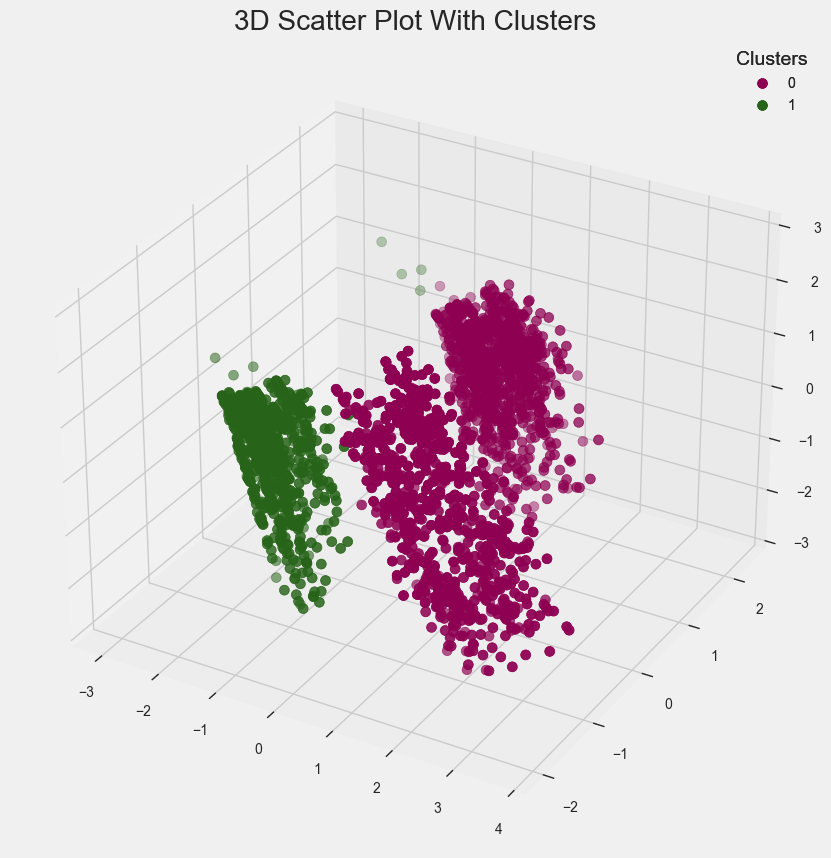

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


selected_columns = ['Tenure', 'DaySinceLastOrder', 'CashbackAmount', 'PreferedOrderCat_Fashion', 'PreferedOrderCat_Laptop & Accessory','PreferedOrderCat_Mobile Phone']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=5)
X_pca_selected = pca.fit_transform(df_selected)

kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='PiYG', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

#### K-Means - 4 klastera

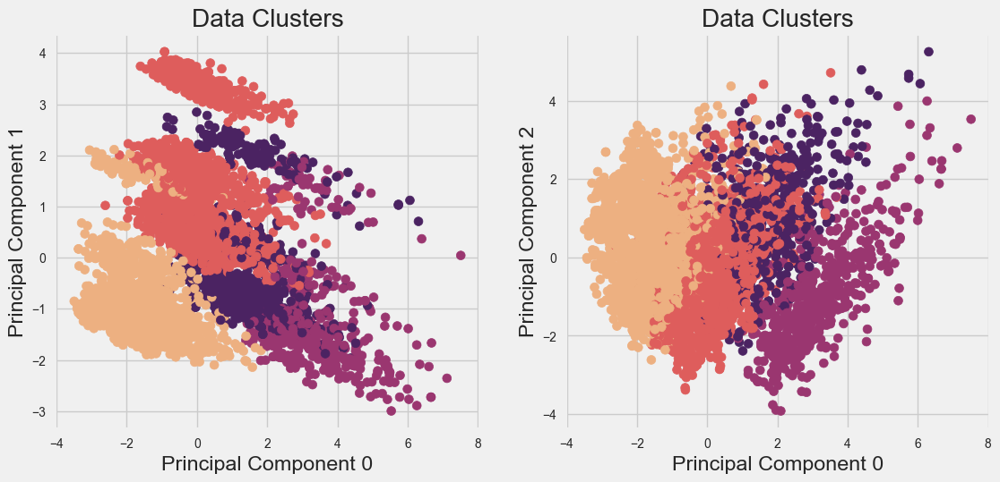

In [77]:
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

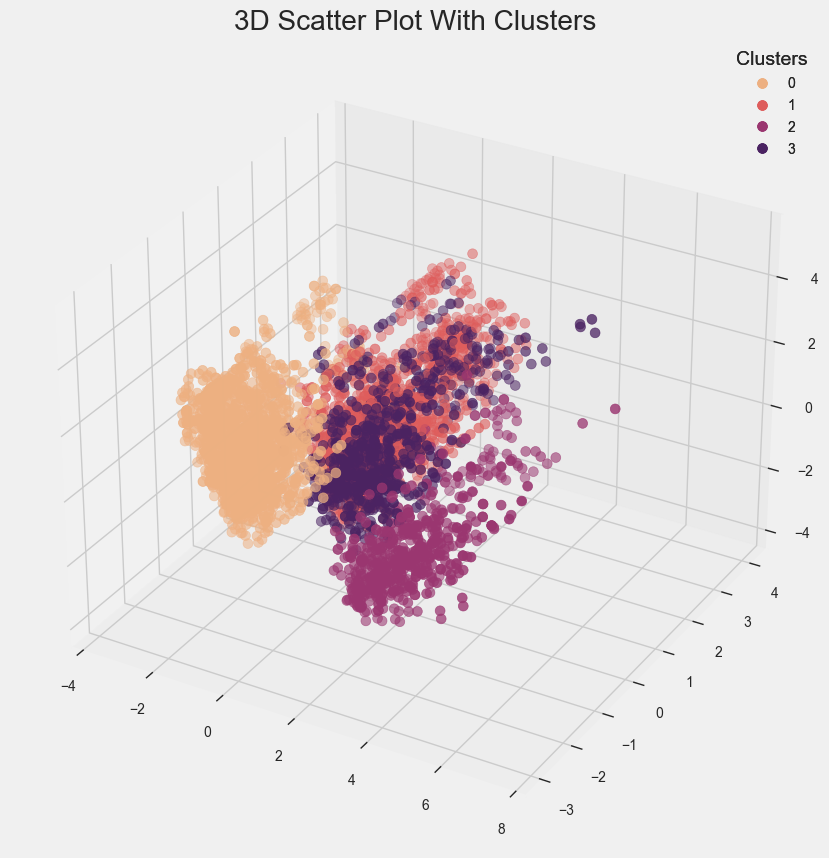

In [78]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

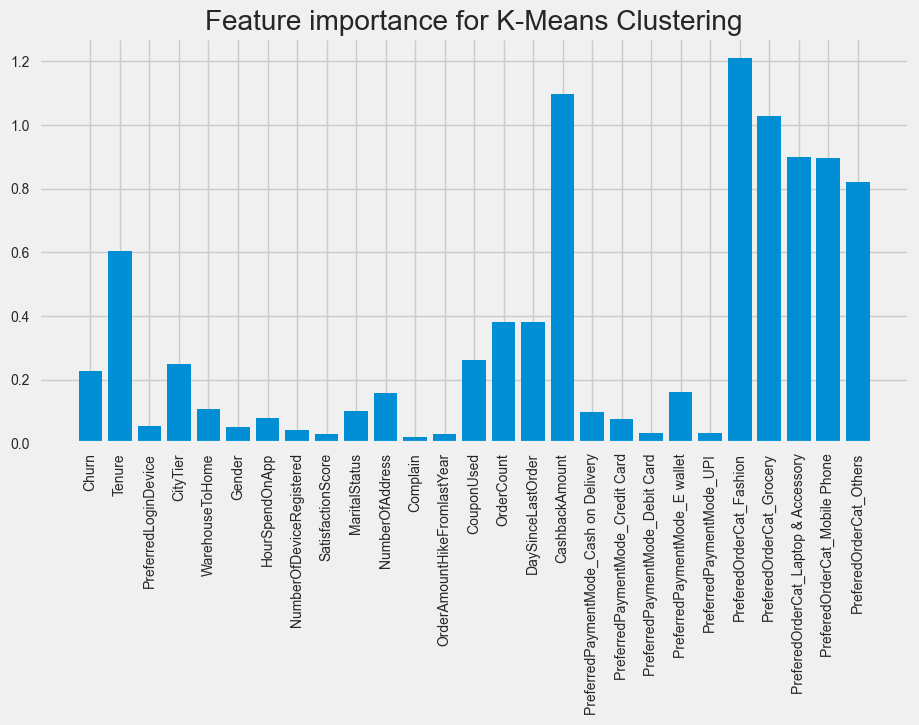

In [79]:
cent = kmeans.cluster_centers_
feature_importance = cent.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for K-Means Clustering')
plt.show()

In [80]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others'],
      dtype='object')


In [81]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(4)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(4), index=important_columns)

In [82]:
cluster_data

,0,1,2,3
Tenure,-0.407759,-0.066577,1.209223,0.239914
OrderCount,-0.292369,-0.075478,0.682503,0.380778
DaySinceLastOrder,-0.451630,0.122524,0.544731,0.397788
CashbackAmount,-0.753219,-0.197850,2.153770,0.686255
PreferedOrderCat_Fashion,-0.420372,-0.420372,-0.420372,2.378847
PreferedOrderCat_Grocery,-0.273213,-0.273213,2.101393,-0.273213
PreferedOrderCat_Laptop & Accessory,-0.757774,1.319655,-0.757774,-0.757774
PreferedOrderCat_Mobile Phone,1.304866,-0.766362,-0.766362,-0.766362
PreferedOrderCat_Others,-0.218573,-0.218573,1.681128,-0.218573


Klaster 0 - kraće iskustvo u kompaniji, manji povraćaj novca i broj porudžbina, kraće vreme od poslednje porudžbine, korisnici koji preferiraju kategoriju Mobile Phone <br>
Klaster 1 - (otprilike) srednje iskustvo u kompaniji, mali povraćaj novca, prosečan broj porudžbina, kraće vreme od poslednje porudžbine, korisnici koji preferiraju kategoriju Laptop & Accessory <br>
Klaster 2 - drastično duže iskustvo u kompaniji, značajno veći broj porudžbina i ogroman povraćaj novca, duže vreme od poslednje podrudžbine, korisnici koji značajno više preferiraju kategoriju Others <br>
Klaster 3 - duže iskustvo u kompaniji, veći broj porudžbina i povraćaj novca, duže vreme od poslednje podrudžbine, korisnici koji značajno više preferiraju kategoriju Fashion <br>

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

Generalno je dobro pokušati sa izbacivanjem fičera koji nemaju značajniji uticaj na klasterizaciju, iz razloga što to u nekom slučajevima može dati bolju vizuelizaciju klastera.

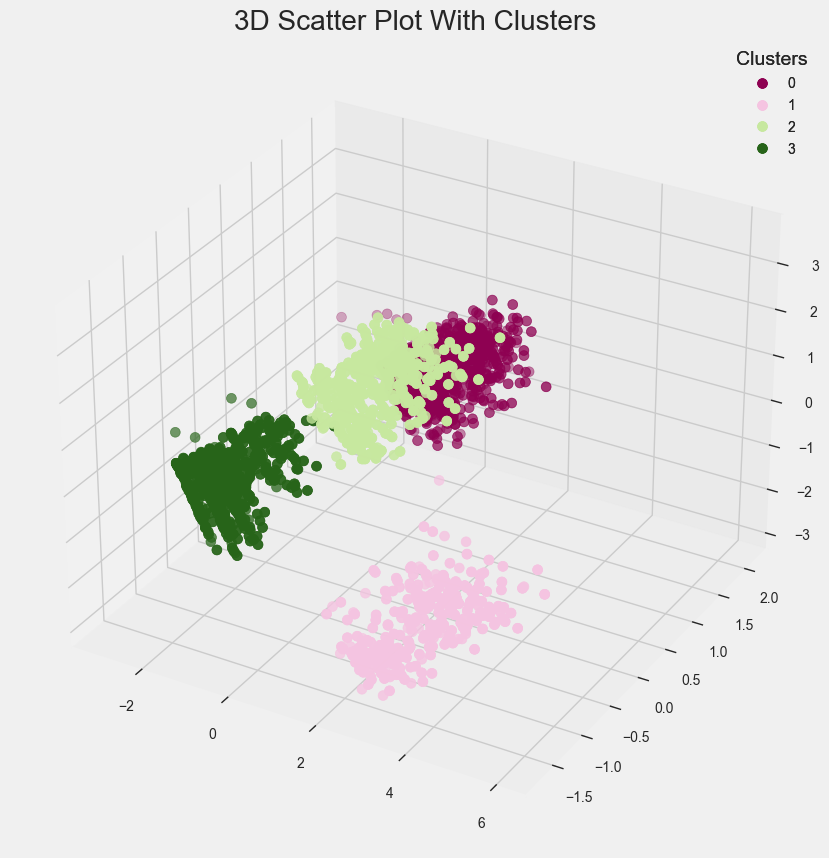

In [83]:
selected_columns = ['Tenure', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=5)
X_pca_selected = pca.fit_transform(df_selected)

kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='PiYG', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

#### K-Means - 5 klastera

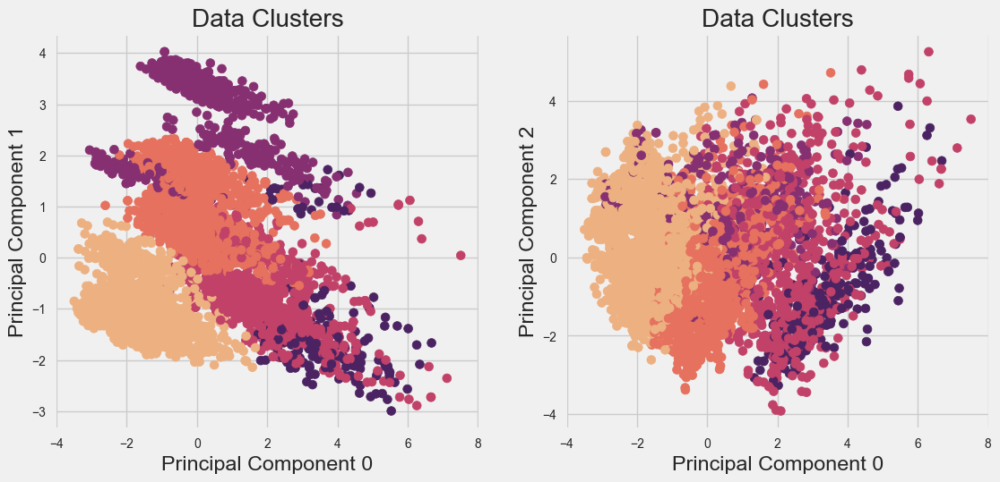

In [84]:
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

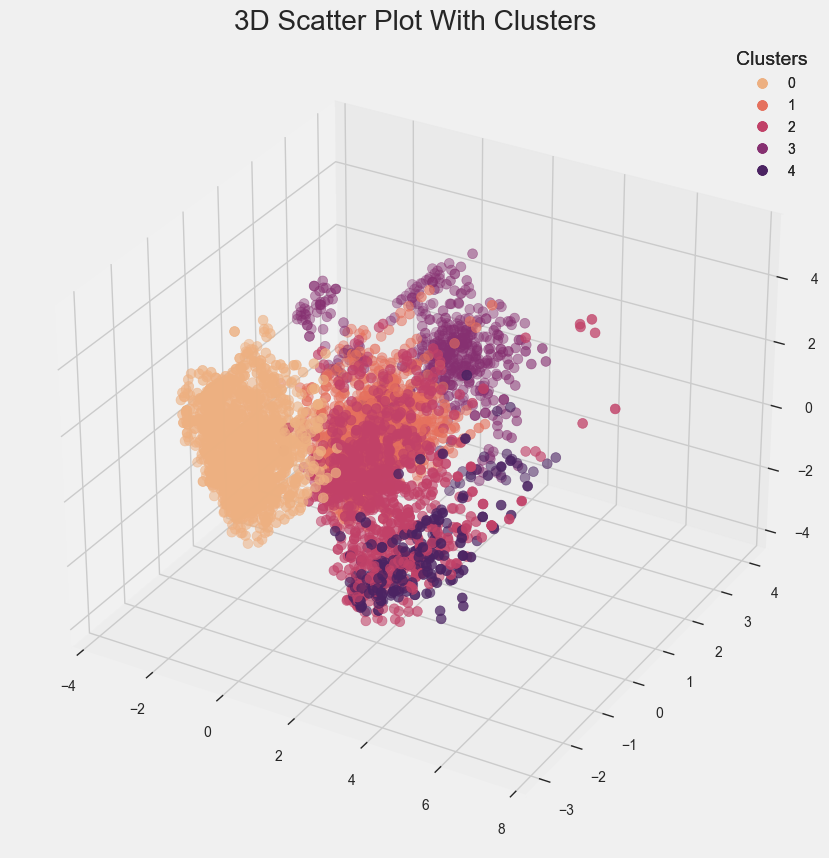

In [85]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

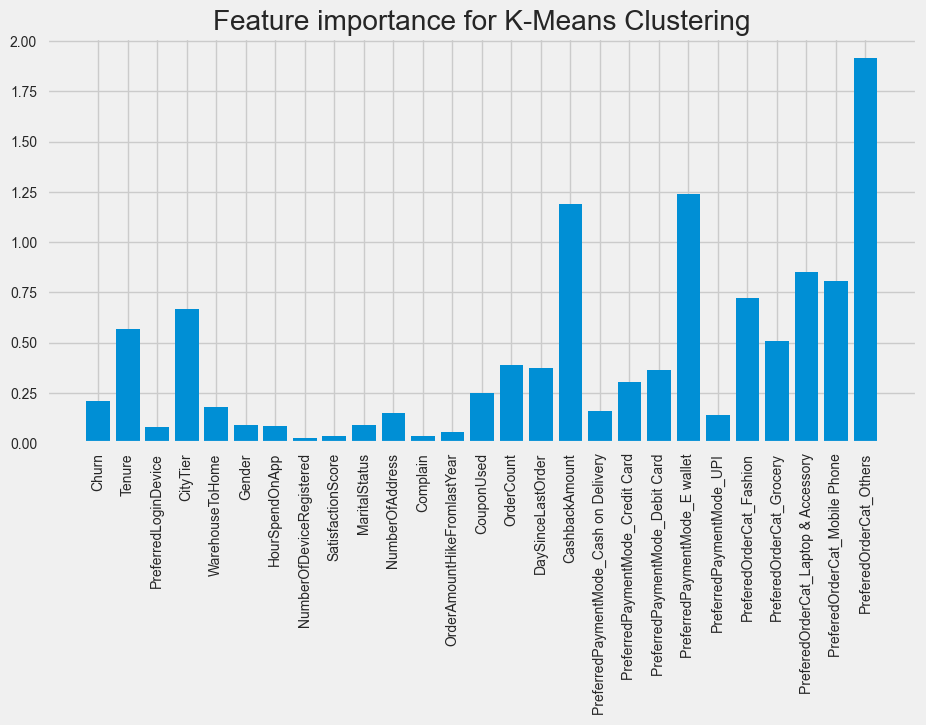

In [86]:
cent = kmeans.cluster_centers_
feature_importance = cent.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for K-Means Clustering')
plt.show()

In [87]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'CityTier', 'OrderCount', 'DaySinceLastOrder',
       'CashbackAmount', 'PreferredPaymentMode_Credit Card',
       'PreferredPaymentMode_Debit Card', 'PreferredPaymentMode_E wallet',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others'],
      dtype='object')


In [88]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(5)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(5), index=important_columns)

In [89]:
cluster_data

,0,1,2,3,4
Tenure,-0.404295,-0.049268,0.576447,-0.060959,1.192103
CityTier,-0.407176,0.077207,-0.122271,1.461779,-0.181114
OrderCount,-0.290306,-0.062020,0.482103,-0.047337,0.754605
DaySinceLastOrder,-0.442483,0.152972,0.412277,0.017435,0.655638
CashbackAmount,-0.748521,-0.211469,1.096310,0.006763,2.609827
PreferredPaymentMode_Credit Card,0.106179,0.042579,0.080815,-0.679190,0.108180
PreferredPaymentMode_Debit Card,0.052676,0.158386,0.116258,-0.829230,-0.049804
PreferredPaymentMode_E wallet,-0.354363,-0.354363,-0.322214,2.821964,-0.002940
PreferedOrderCat_Fashion,-0.420372,-0.420372,1.443886,0.182058,-0.420372
PreferedOrderCat_Grocery,-0.273213,-0.273213,1.036578,-0.061586,-0.273213


Klaster 0 - kraće iskustvo sa kompanijom, manji broj porudžbina i povraćaj novca, korisnici koji preferiraju kategoriju Mobile Phone, uglavnom plaćaju karticom <br>
Klaster 1 - (otprilike) srednje iskustvo sa kompanijom, manji broj porudžbina, srednji povraćaj novca, korisnici koji značajno više preferiraju kategoriju Laptop & Accessory, uglavnom plaćaju karticom <br>
Klaster 2 - duže iskustvo sa kompanijom, veći broj porudžbina i značajno veći povraćaj novca, korisnici koji značajno više preferiraju kategoriju Grocery, uglavnom plaćaju karticom <br>
Klaster 3 - (otprilike) srednje iskustvo sa kompanijom, izuzetno veći povraćaj novca, korisnici koji preferiraju kategoriju Laptop & Accessory, uglavnom plaćaju E-novčanikom <br>
Klaster 4 - duže iskustvo sa kompanijom, veći povraćaj novca i broj porudžbina, korisnici koji značajno više preferiraju kategoriju Fashion, uglavnom plaćaju karticom 

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

Generalno je dobro pokušati sa izbacivanjem fičera koji nemaju značajniji uticaj na klasterizaciju, iz razloga što to u nekom slučajevima može dati bolju vizuelizaciju klastera.

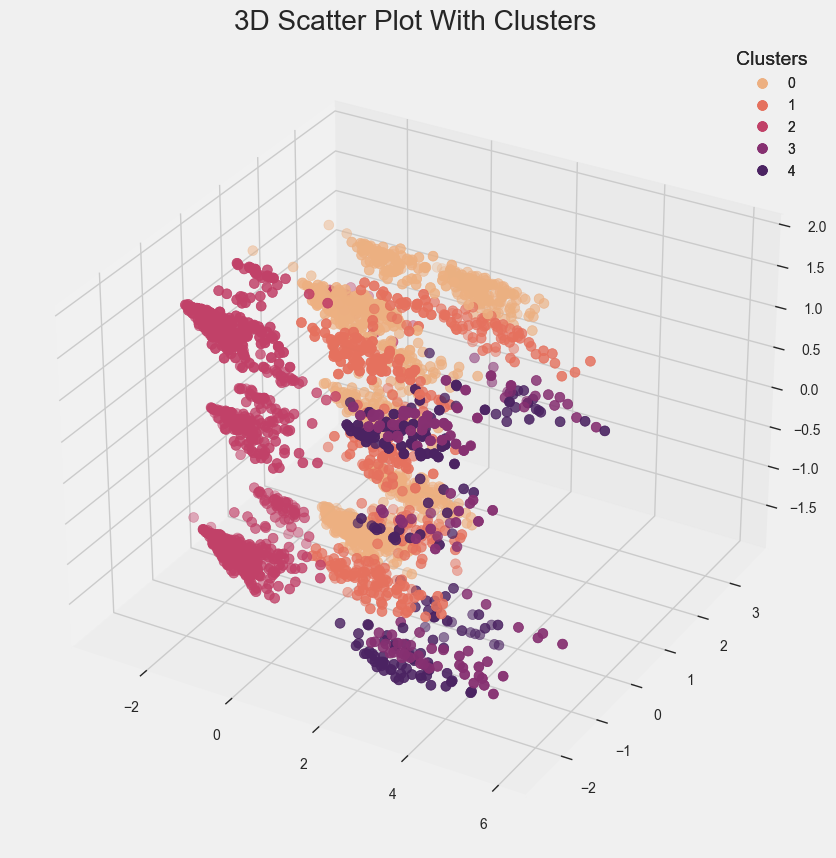

In [90]:
selected_columns = ['Tenure', 'CityTier', 'OrderCount', 'DaySinceLastOrder',
       'CashbackAmount', 'PreferredPaymentMode_Credit Card',
       'PreferredPaymentMode_Debit Card', 'PreferredPaymentMode_E wallet',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=5)
X_pca_selected = pca.fit_transform(df_selected)

kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='flare', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

#### Zaključci

Na osnovu analize klastera koja je sprovedena za KMeans metodu sa 2, 4 i 5 klastera može se zaključiti sledeće: za mali broj klastera (2 klastera), najveći uticaj imaju fičeri: 'Tenure', 'DaySinceLastOrder', 'CashbackAmount'. Dakle, generalno se vrši podela kroisnika po tome koliko "aktivno koriste usluge i kupuju proizvode neke kompanije" - koliko dugo kupuju proizvode, koliki povraćaj nova su dobili i koliko vremena je prošlo od poslednje kupovine. Povećanjem broja klastera (4 klastera), na značaju dobijaju fičeri koji se odnose na omiljene kategorije proizvoda korisnika ('PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others'). Daljim povećanjem (5 klastera), počinje da utiče i omiljeni način plaćanja korisnika (kartica, keš ili e-novčanik). Zbog uticaja dodatnih fičera koji su potencijalno interesantni za detaljniju analizu, upravo smo se opredelile za KMeans sa 5 klastera za detaljniju analizu i upostavljanje "biznis plana" na kraju ovog projekta.

### Agglomerative Clustering

#### Procena i izbor optimalnog broja klastera 

In [91]:
from sklearn.cluster import AgglomerativeClustering

# elbow = KElbowVisualizer(AgglomerativeClustering(), k=(2,12))
# elbow.fit(df)
# elbow.show()

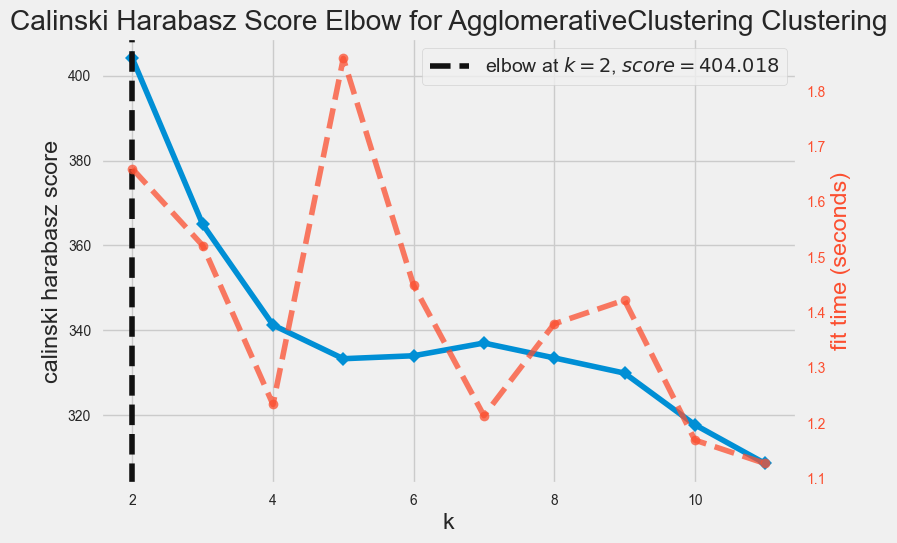

<AxesSubplot: title={'center': 'Calinski Harabasz Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [92]:
elbow = KElbowVisualizer(AgglomerativeClustering(), k=(2,12), metric='calinski_harabasz')
elbow.fit(df)
elbow.show()

Calinski Harabasz metrika procenjuje da je optimalan broj klastera za hijerarhijsku klasterizaciju 2.

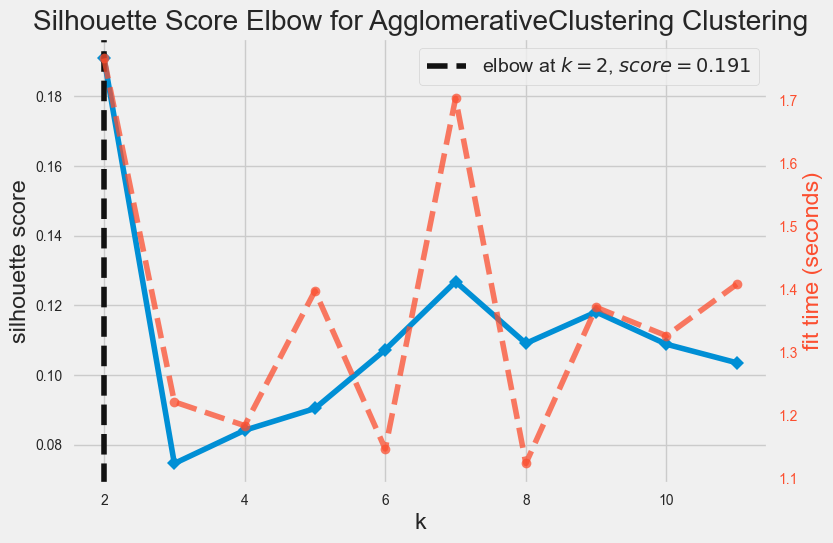

<AxesSubplot: title={'center': 'Silhouette Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='silhouette score'>

In [93]:
elbow = KElbowVisualizer(AgglomerativeClustering(), k=(2,12), metric='silhouette')
elbow.fit(df)
elbow.show()

Slično, silhouette metrika procenjuje da je optimalan broj klastera za hijerarhijsku klasterizaciju 2.

#### Agglomerative - 2 klastera

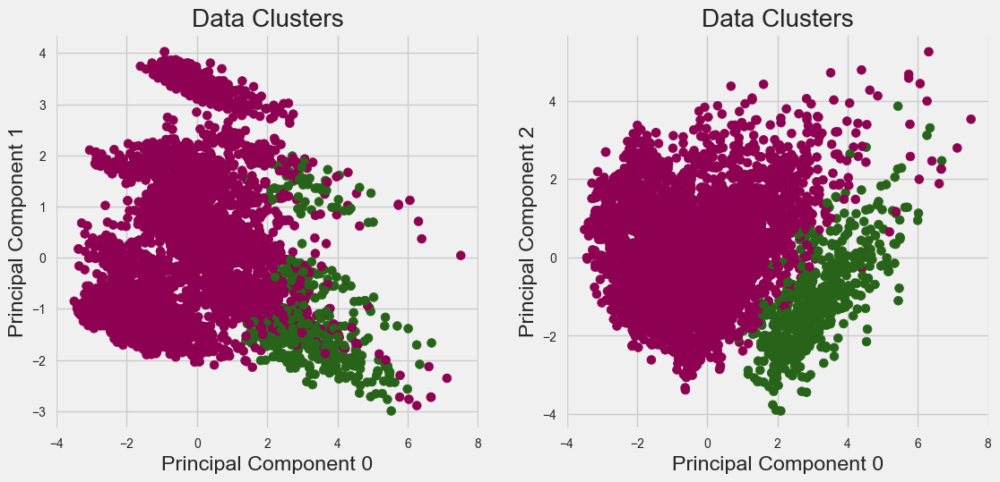

In [94]:
agglomerative = AgglomerativeClustering(n_clusters=2)
clusters = agglomerative.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='PiYG', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

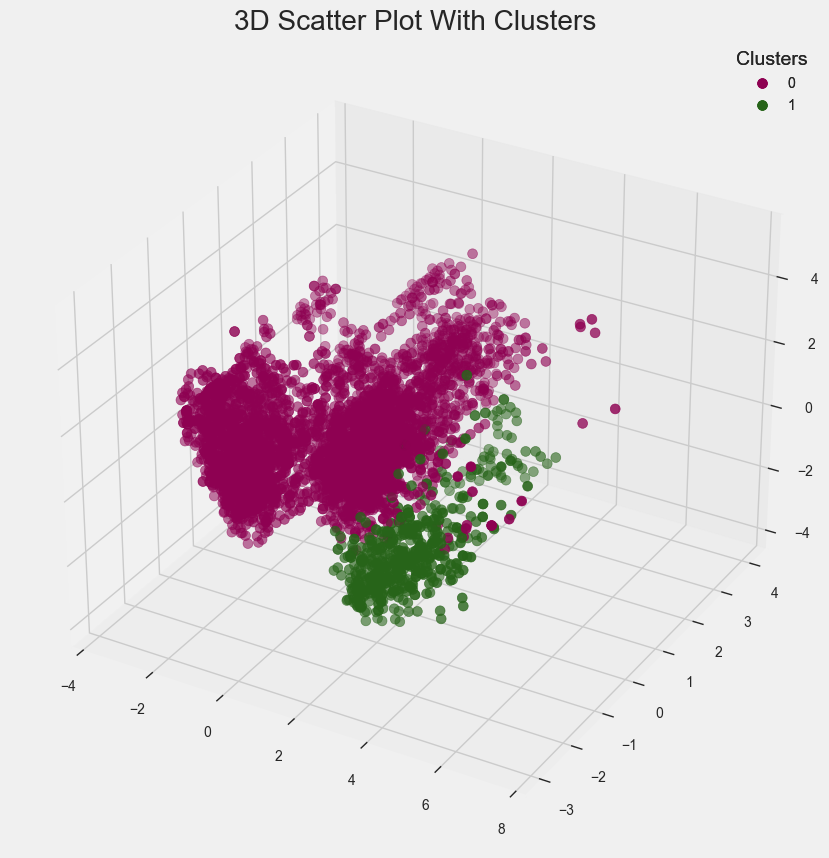

In [95]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='PiYG', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

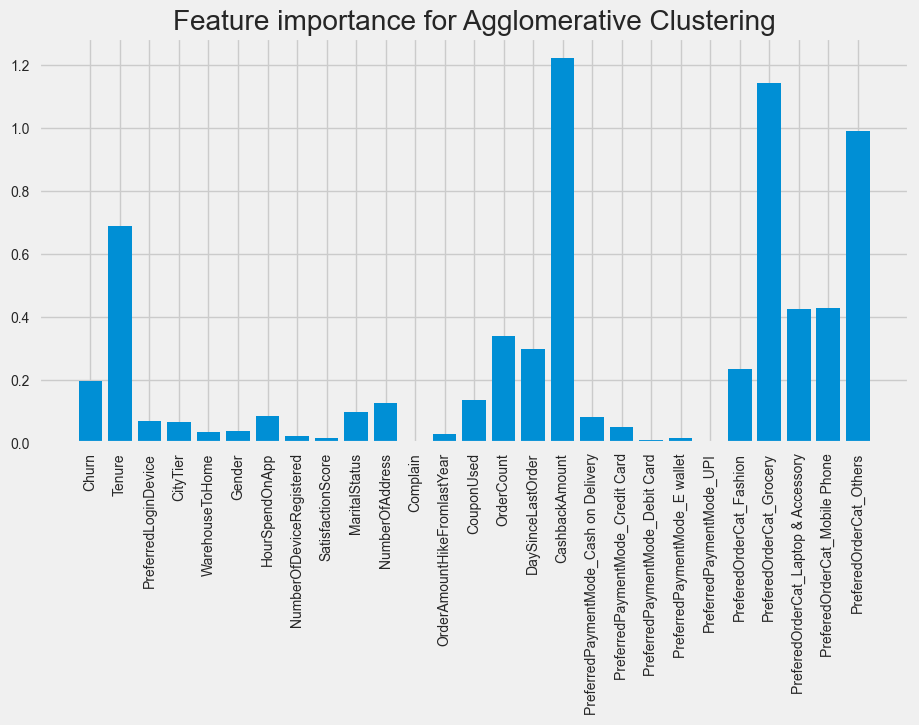

In [96]:
cent = np.array([df.loc[agglomerative.labels_ == label].mean(axis=0) for label in np.unique(agglomerative.labels_)])

feature_importance = cent.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Agglomerative Clustering')
plt.show()

In [97]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'OrderCount', 'CashbackAmount', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others'],
      dtype='object')


In [98]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(2)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(2), index=important_columns)

In [99]:
cluster_data

,0,1
Tenure,-0.151812,1.225722
OrderCount,-0.074935,0.605024
CashbackAmount,-0.269826,2.178558
PreferedOrderCat_Grocery,-0.251771,2.032786
PreferedOrderCat_Laptop & Accessory,0.093854,-0.757774
PreferedOrderCat_Mobile Phone,0.094918,-0.766362
PreferedOrderCat_Others,-0.218573,1.764742


Klaster 0 - kraće ukupno iskustvo sa kompanijom, manji/prosečan broj porudžbina, nešto kraći vremenski period od poslednje porudžbine, manji povraćaj novca,  korisnici koji pripadaju ovom klasteru preferiraju kategorije Mobile Phone i Laptop & Accessory <br> 
Klaster 1 - dugačko ukupno iskustvo sa kompanijom, značajno veći broj porudžbina, duži vremenski period od poslednje porudžbine, osobe koje generalno dobijaju više povrata novca, preferiraju kategorije Grocery i Others

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

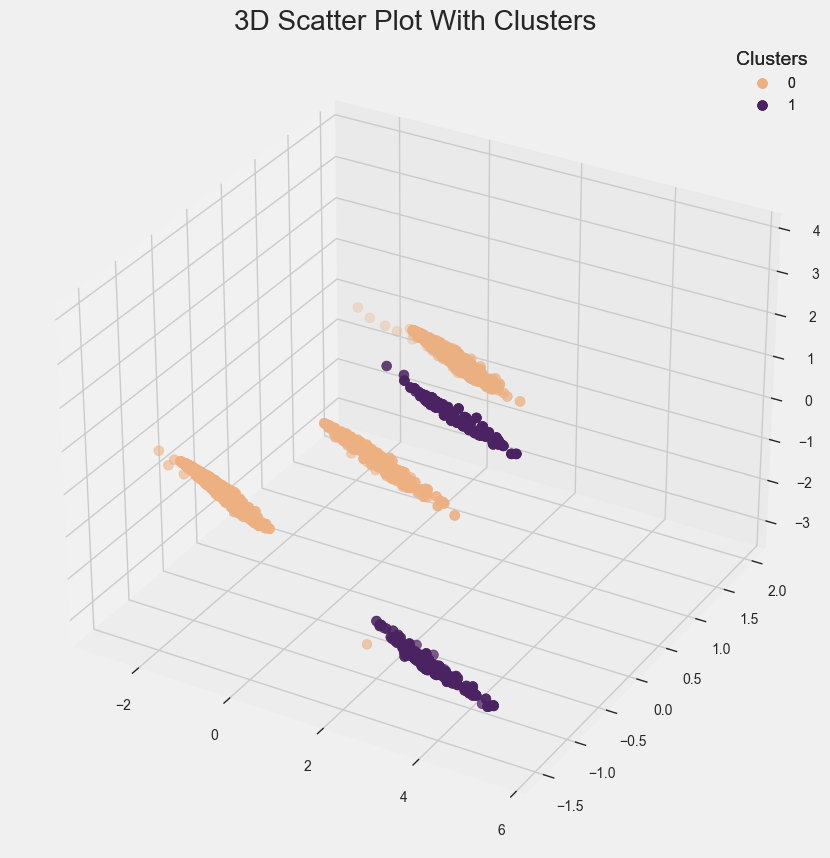

In [100]:
selected_columns = ['Tenure', 'OrderCount', 'CashbackAmount', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=5)
X_pca_selected = pca.fit_transform(df_selected)

agg = AgglomerativeClustering(n_clusters=2)
clusters = agg.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='flare', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

##### Dendogrami:

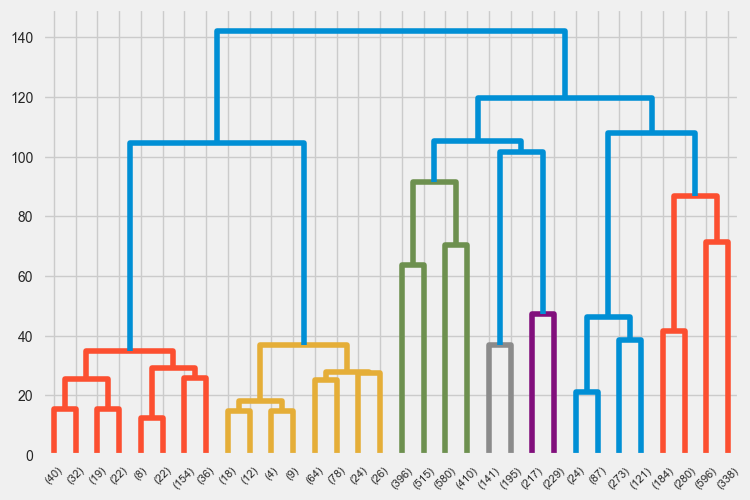

In [101]:
import scipy.cluster.hierarchy as sch

X = df.values
dendrogram = sch.dendrogram(sch.linkage(X, method='ward'), truncate_mode='level', p=4)

#### Agglomerative - 3 klastera

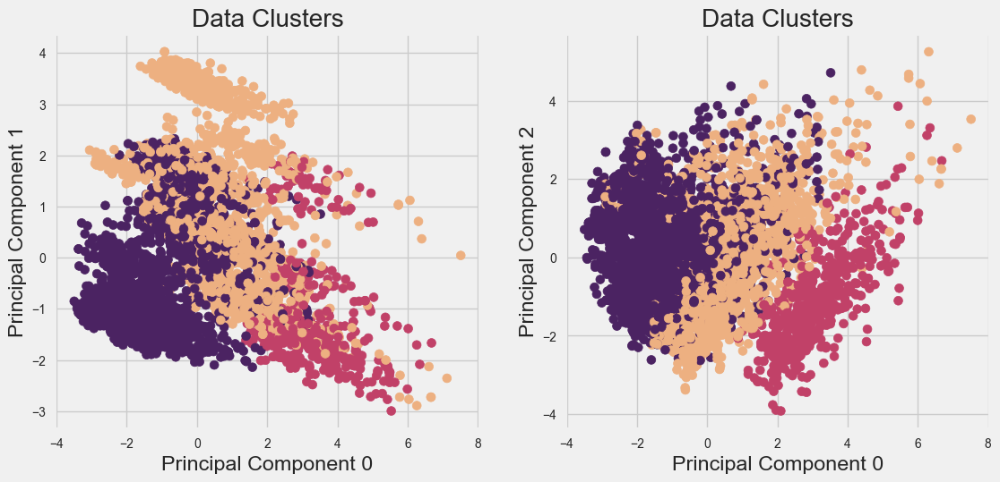

In [102]:
agglomerative = AgglomerativeClustering(n_clusters=3)
clusters = agglomerative.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

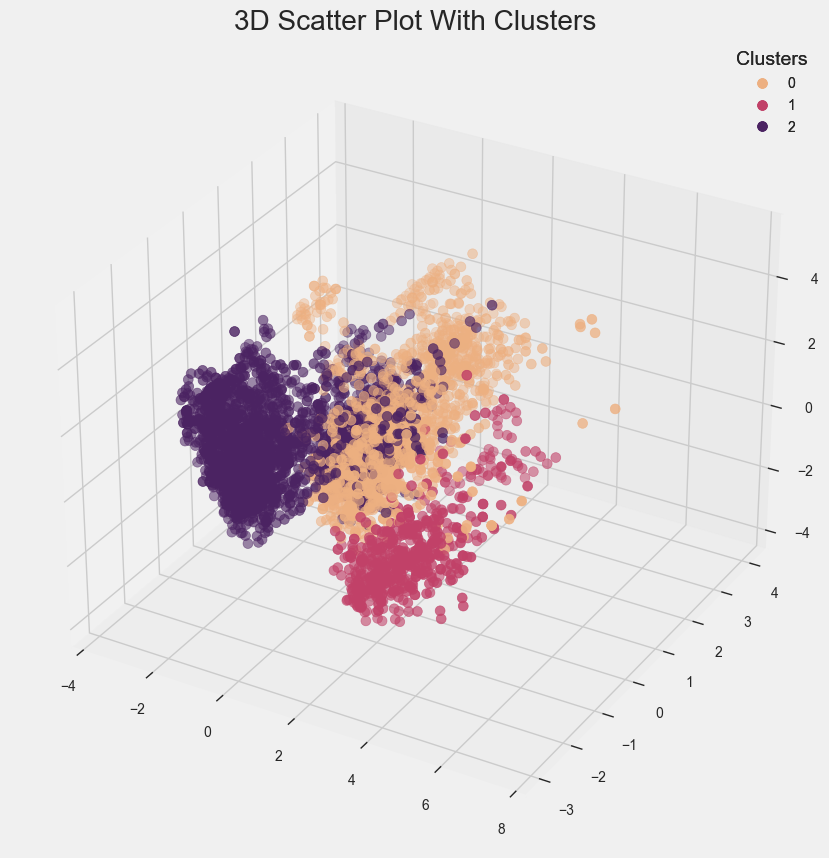

In [103]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

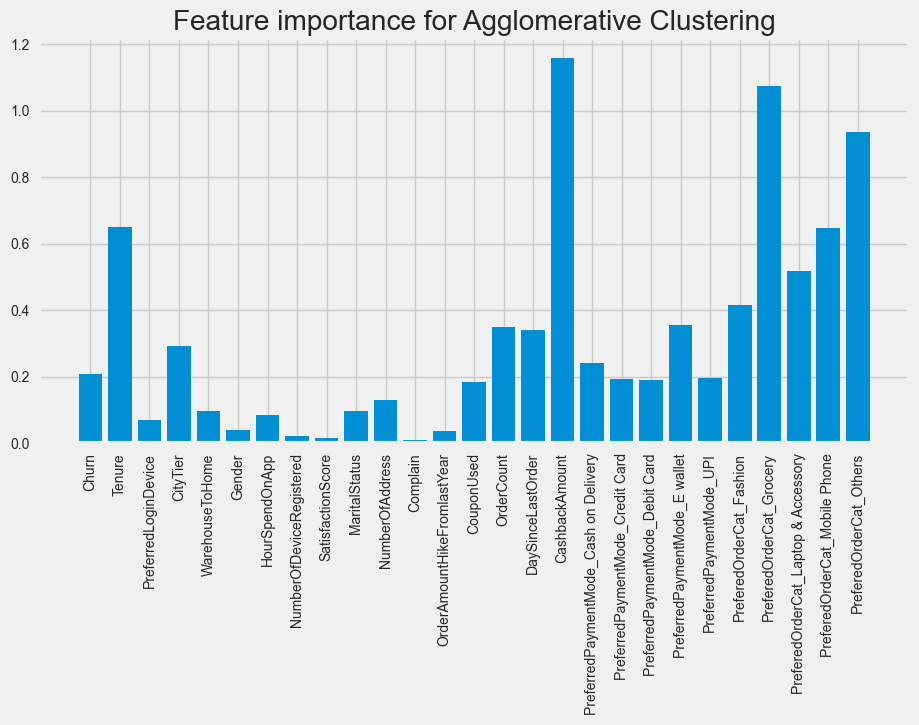

In [104]:
cent = np.array([df.loc[agglomerative.labels_ == label].mean(axis=0) for label in np.unique(agglomerative.labels_)])

feature_importance = cent.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Agglomerative Clustering')
plt.show()

In [105]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferredPaymentMode_E wallet', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others'],
      dtype='object')


In [106]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(3)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(3), index=important_columns)

In [107]:
cluster_data

,0,1,2
Tenure,0.049539,1.225722,-0.294626
OrderCount,0.174569,0.605024,-0.251904
DaySinceLastOrder,0.243538,0.533825,-0.285749
CashbackAmount,0.116692,2.178558,-0.543975
PreferredPaymentMode_E wallet,0.508570,-0.030020,-0.354363
PreferedOrderCat_Fashion,0.523979,-0.420372,-0.282654
PreferedOrderCat_Grocery,-0.225674,2.032786,-0.270281
PreferedOrderCat_Laptop & Accessory,0.510735,-0.757774,-0.201831
PreferedOrderCat_Mobile Phone,-0.683644,-0.766362,0.647137
PreferedOrderCat_Others,-0.218573,1.764742,-0.218573


Klaster 0 - kraće ukupno iskustvo sa kompanijom, manji broj porudžbina, srednji povraćaj novca, srednji period od poslednje porudžbine, plaćanje E-novčanikom, osobe koje preferiraju kategoriju Laptop & Accessory i Fashion <br>
Klaster 1 - dugačko ukupno iskustvo sa kompanijom, veći broj porudžbina, duži period od poslednje porudžbine, značajno veći povraćaj novca, korisnici koji pripadaju ovom klasteru preferiraju kategorije i Grocery i Others <br> 
Klaster 2 - kraće ukupno iskustvo sa kompanijom, manji broj porudžbina, kraći period od poslednje porudžbine, osobe koje generalno dobijaju manji povrata novca, plaćanje karticom, preferiraju kategorije Mobile Phone <br>

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

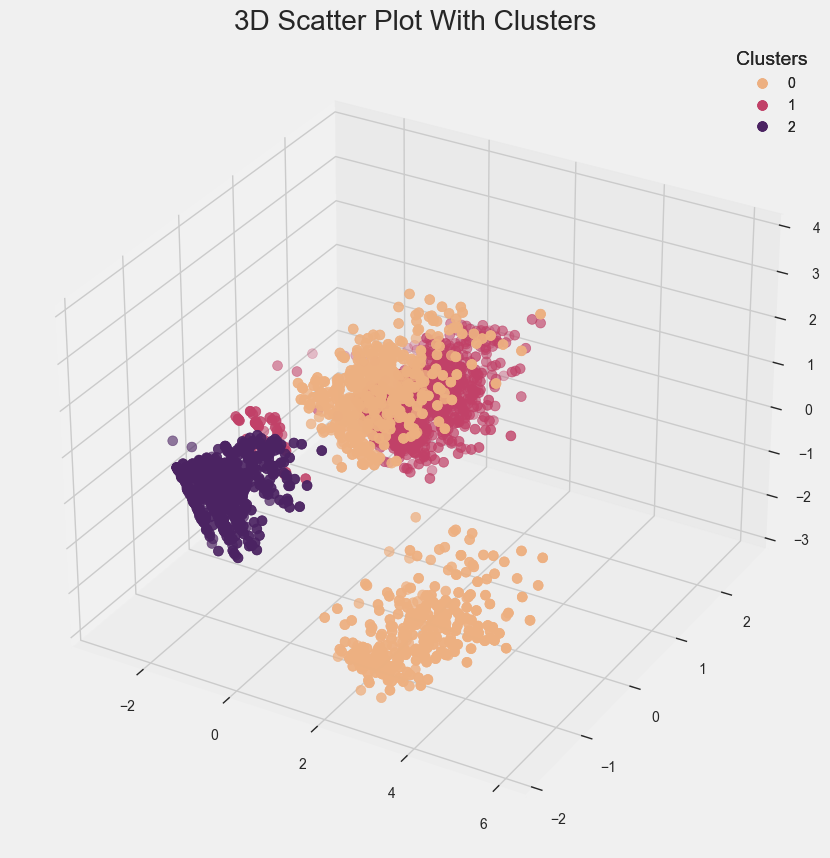

In [109]:
selected_columns = ['Tenure', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferredPaymentMode_E wallet', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=7)
X_pca_selected = pca.fit_transform(df_selected)

agg = AgglomerativeClustering(n_clusters=3)
clusters = agg.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='flare', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

##### Dendogrami

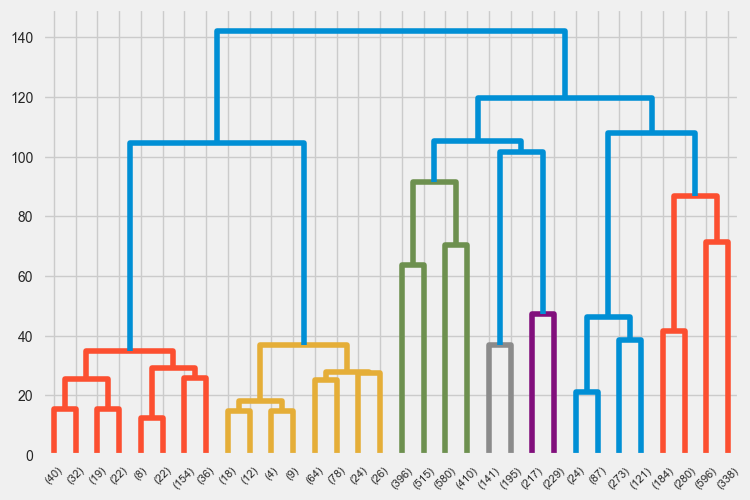

In [110]:
import scipy.cluster.hierarchy as sch

X = df.values
dendrogram = sch.dendrogram(sch.linkage(X, method='ward'), truncate_mode='level', p=4)

##### Visina sečenja 117:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


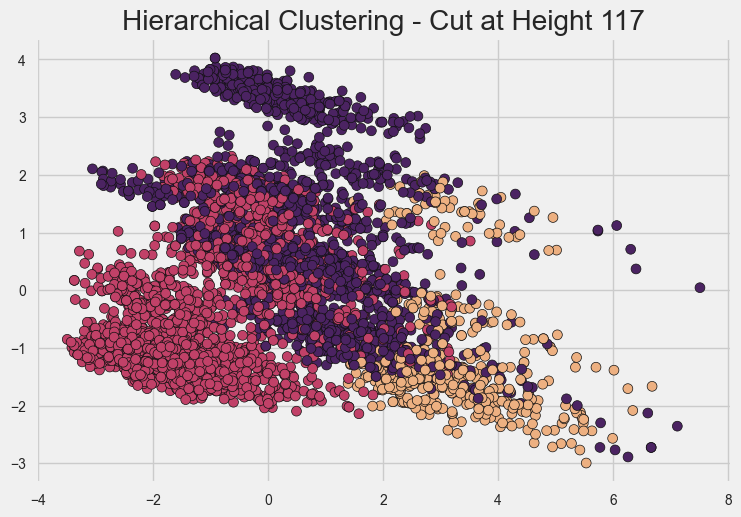

In [111]:
from scipy import cluster
from scipy.cluster.hierarchy import linkage

linkage_matrix = linkage(X, method='ward')
cut_height = 117
cluster_assignments = sch.fcluster(linkage_matrix, cut_height, criterion='distance')

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_assignments, cmap='flare', s=50, edgecolors='k', marker='o')
plt.title(f'Hierarchical Clustering - Cut at Height {cut_height}')
plt.legend()
plt.show()

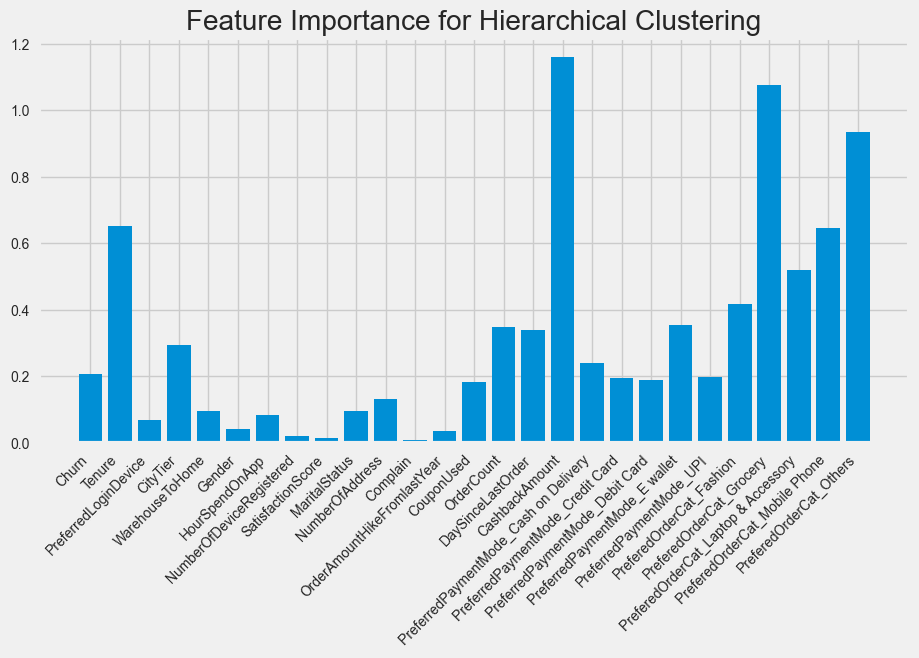

In [112]:
centroids = np.array([X[cluster_assignments == label].mean(axis=0) for label in np.unique(cluster_assignments)])
feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=45, ha='right')
plt.title('Feature Importance for Hierarchical Clustering')
plt.show()

In [113]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferredPaymentMode_E wallet', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others'],
      dtype='object')


In [114]:
cluster_data = np.array([df[cluster_assignments == i][important_columns].mean(axis=0) for i in range(1,4)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(1,4), index=important_columns)

In [116]:
cluster_data

,1,2,3
Tenure,1.225722,-0.294626,0.049539
OrderCount,0.605024,-0.251904,0.174569
DaySinceLastOrder,0.533825,-0.285749,0.243538
CashbackAmount,2.178558,-0.543975,0.116692
PreferredPaymentMode_E wallet,-0.030020,-0.354363,0.508570
PreferedOrderCat_Fashion,-0.420372,-0.282654,0.523979
PreferedOrderCat_Grocery,2.032786,-0.270281,-0.225674
PreferedOrderCat_Laptop & Accessory,-0.757774,-0.201831,0.510735
PreferedOrderCat_Mobile Phone,-0.766362,0.647137,-0.683644
PreferedOrderCat_Others,1.764742,-0.218573,-0.218573


Klaster 0 - karakterišu korisnici sa dugim ukupnim iskustvom sa kompanijom, većim brojem porudžbina i značajno većim povraćajem novca. Takođe, ovi korisnici imaju duži period od poslednje porudžbine i često preferiraju kategorije Grocery i Others. <br>
Klaster 1 - obuhvata korisnike sa kraćim ukupnim iskustvom sa kompanijom, manjim brojem porudžbina, kraćim periodom od poslednje porudžbine i srednjim povraćajem novca. Takođe, ovi korisnici imaju srednji period od poslednje porudžbine i često plaćaju putem E-novčika. Osim toga, preferiraju kategorije Mobile Phone. <br>
Klaster 2 - uključuje korisnike sa srednjim ukupnim iskustvom sa kompanijom, manjim brojem porudžbina i srednjim periodom od poslednje porudžbine. Ovi korisnici generalno dobijaju manji povraćaj novca i često plaćaju E-novčanikom. Takođe, preferiraju kategoriju Laptop.

##### Visina sečenja 105:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


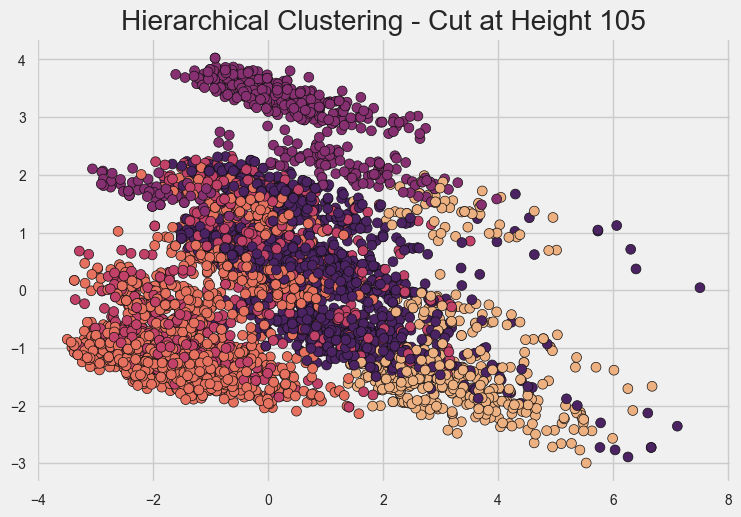

In [117]:
linkage_matrix = linkage(X, method='ward')
cut_height = 105
cluster_assignments = sch.fcluster(linkage_matrix, cut_height, criterion='distance')

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_assignments, cmap='flare', s=50, edgecolors='k', marker='o')
plt.title(f'Hierarchical Clustering - Cut at Height {cut_height}')
plt.legend()
plt.show()

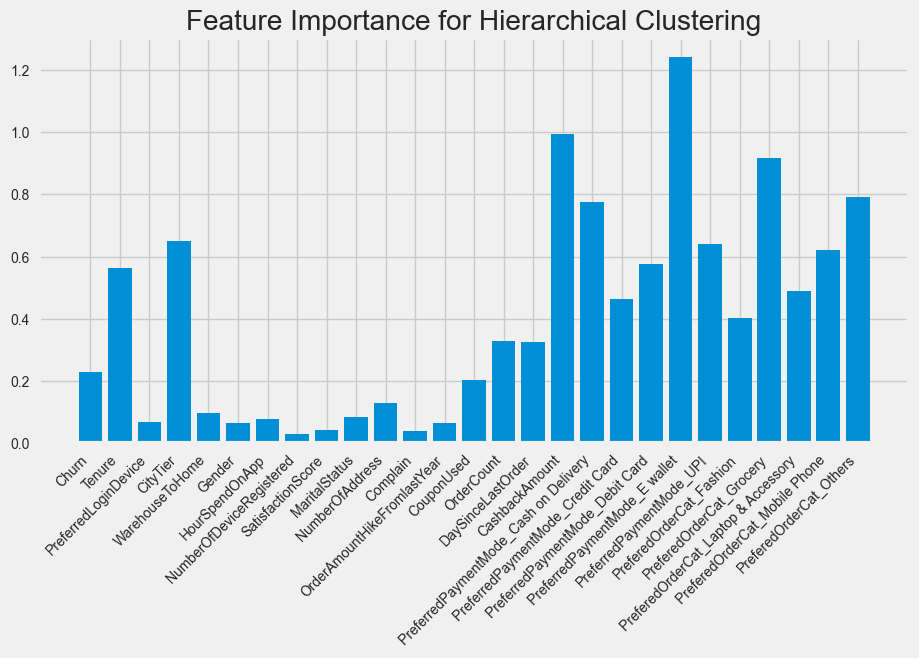

In [118]:
centroids = np.array([X[cluster_assignments == label].mean(axis=0) for label in np.unique(cluster_assignments)])
feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=45, ha='right')
plt.title('Feature Importance for Hierarchical Clustering')
plt.show()

In [119]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'CityTier', 'OrderCount', 'DaySinceLastOrder',
       'CashbackAmount', 'PreferredPaymentMode_Cash on Delivery',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferredPaymentMode_UPI',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others'],
      dtype='object')


Primećuje se da je sečenjem dendograma na visini 105 veći uticaj kategorije Others.

In [123]:
cluster_data = np.array([df[cluster_assignments == i][important_columns].mean(axis=0) for i in range(1,6)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(1,6), index=important_columns)

In [121]:
cluster_data

,1,2,3,4,5
Tenure,1.225722,-0.338016,-0.189149,-0.141815,0.118662
CityTier,-0.122309,-0.328193,-0.121155,1.461779,0.035702
OrderCount,0.605024,-0.314118,-0.100665,-0.101299,0.274221
DaySinceLastOrder,0.533825,-0.392855,-0.025382,-0.036686,0.344764
CashbackAmount,2.178558,-0.636904,-0.318071,-0.088862,0.190944
PreferredPaymentMode_Cash on Delivery,-0.147663,-0.318248,1.655357,-0.318248,-0.318248
PreferredPaymentMode_Credit Card,0.093544,0.525035,-0.679190,-0.679190,-0.126686
PreferredPaymentMode_Debit Card,0.016368,0.066843,-0.829230,-0.829230,0.665847
PreferredPaymentMode_E wallet,-0.030020,-0.354363,-0.354363,2.821964,-0.327099
PreferredPaymentMode_UPI,0.002311,-0.281329,1.366830,-0.281329,-0.281329


Klaster 1 - karakterišu korisnici sa dugim ukupnim iskustvom sa kompanijom, većim brojem porudžbina i značajno većim povraćajem novca. Uglavnom plaćaju karticom. Takođe, ovi korisnici imaju duži period od poslednje porudžbine i često preferiraju kategorije Grocery i Others. <br>
Klaster 2 - obuhvata korisnike sa kraćim ukupnim iskustvom sa kompanijom, manjim brojem porudžbina, kraćim periodom od poslednje porudžbine i srednjim povraćajem novca. Uglavnom plaćaju karticom. Takođe, ovi korisnici imaju srednji period od poslednje porudžbine. Osim toga, preferiraju kategorije Mobile Phone. <br>
Klaster 3 - uključuje korisnike sa srednjim ukupnim iskustvom sa kompanijom, manjim brojem porudžbina i srednjim periodom od poslednje porudžbine. Ovi korisnici generalno dobijaju manji povraćaj novca i često plaćaju kešom. Takođe, preferiraju kategoriju Fashion i Mobile Phone. <br>
Klaster 4 - uključuje korisnike sa srednjim ukupnim iskustvom sa kompanijom, manjim brojem porudžbina i srednjim periodom od poslednje porudžbine. Ovi korisnici generalno dobijaju manji povraćaj novca i često plaćaju E-novčanikom. Takođe, preferiraju kategoriju Laptop. <br>
Klaster 5 - karakterišu korisnici sa dužim ukupnim iskustvom sa kompanijom, većim brojem porudžbina i većim povraćajem novca. Uglavnom plaćaju karticom. Takođe, ovi korisnici imaju duži period od poslednje porudžbine i često preferiraju kategorije Fashion. <br>

##### Visina sečenja 80:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


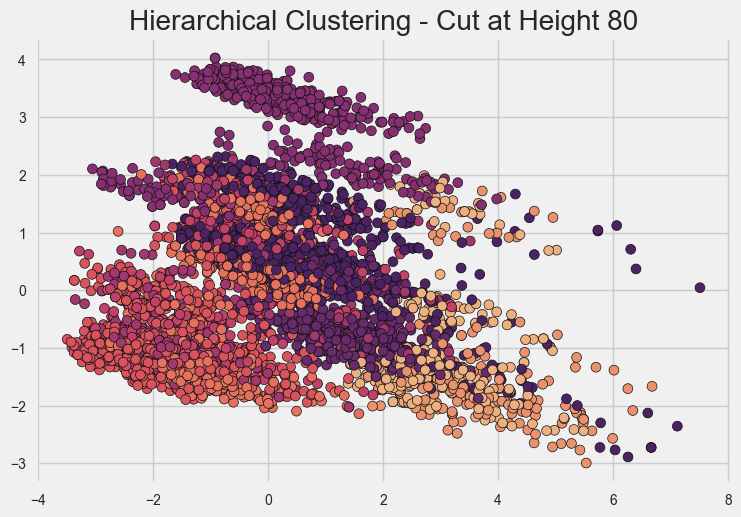

In [124]:
linkage_matrix = linkage(X, method='ward')
cut_height = 80
cluster_assignments = sch.fcluster(linkage_matrix, cut_height, criterion='distance')

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_assignments, cmap='flare', s=50, edgecolors='k', marker='o')
plt.title(f'Hierarchical Clustering - Cut at Height {cut_height}')
plt.legend()
plt.show()

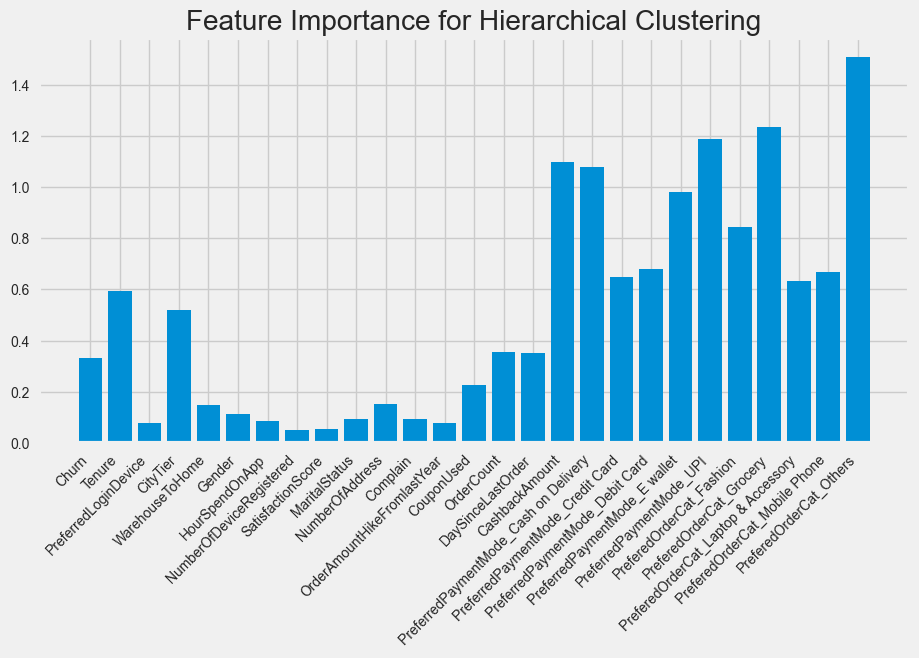

In [125]:
centroids = np.array([X[cluster_assignments == label].mean(axis=0) for label in np.unique(cluster_assignments)])
feature_importance = centroids.std(axis=0)

feature_names = [f'Feature {i+1}' for i in range(X.shape[1])]

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=45, ha='right')
plt.title('Feature Importance for Hierarchical Clustering')
plt.show()

Primećuje se da sečenjem dendograma na visini 80 značajno veći uticaj imaju fičeri koji se odnose na kategorije za poručivanje.

In [126]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Churn', 'Tenure', 'CityTier', 'OrderCount', 'DaySinceLastOrder',
       'CashbackAmount', 'PreferredPaymentMode_Cash on Delivery',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferredPaymentMode_UPI',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others'],
      dtype='object')


In [127]:
cluster_data = np.array([df[cluster_assignments == i][important_columns].mean(axis=0) for i in range(1,10)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(1,10), index=important_columns)

In [128]:
cluster_data

,1,2,3,4,5,6,7,8,9
Churn,-0.416291,-0.266110,-0.377903,0.639091,0.069662,0.236126,0.193270,-0.027092,-0.322290
Tenure,1.249447,1.192103,-0.194766,-0.469834,-0.307838,-0.099733,-0.141815,0.208930,0.073817
CityTier,-0.080811,-0.181114,-0.281299,-0.371345,-0.099497,-0.137472,1.461779,-0.070731,0.088578
OrderCount,0.499463,0.754605,-0.329495,-0.299967,-0.170670,-0.047927,-0.101299,0.105104,0.358236
DaySinceLastOrder,0.447861,0.655638,-0.241131,-0.532471,-0.070549,0.008645,-0.036686,0.333291,0.350463
CashbackAmount,1.874208,2.609827,-0.523130,-0.741598,-0.360589,-0.286040,-0.088862,0.726477,-0.075103
PreferredPaymentMode_Cash on Delivery,-0.110414,-0.200446,-0.318248,-0.318248,-0.318248,3.142200,-0.318248,-0.318248,-0.318248
PreferredPaymentMode_Credit Card,0.083215,0.108180,1.462896,-0.337987,-0.679190,-0.679190,-0.679190,0.294564,-0.335958
PreferredPaymentMode_Debit Card,0.063066,-0.049804,-0.820294,0.883189,-0.829230,-0.829230,-0.829230,0.284849,0.855122
PreferredPaymentMode_E wallet,-0.049131,-0.002940,-0.354363,-0.354363,-0.354363,-0.354363,2.821964,-0.354363,-0.313554


### DBSCAN

5155


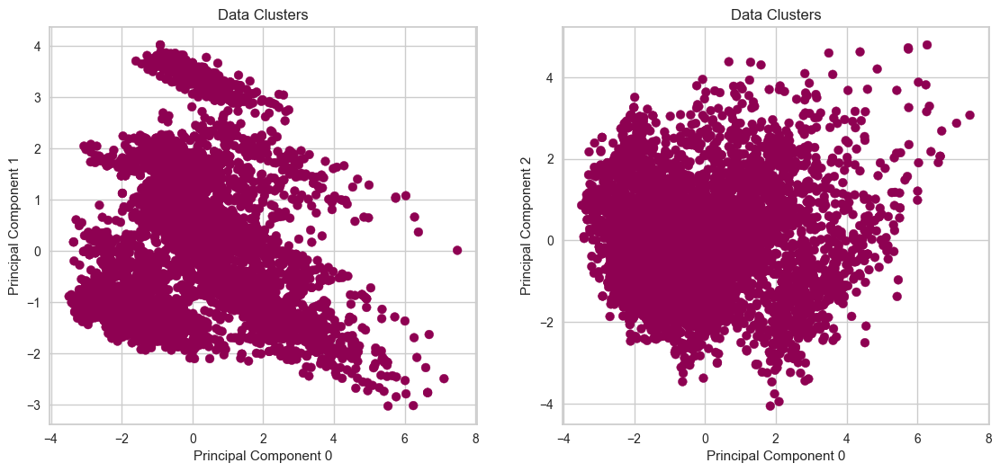

In [181]:
from sklearn.cluster import DBSCAN

def cosine_distance(x, y):
    return 1 - np.dot(x, y) / (np.linalg.norm(x) * np.linalg.norm(y))

dbscan = DBSCAN(metric=cosine_distance, eps=0.5, min_samples=10)
y_dbscan = dbscan.fit_predict(df)

print((y_dbscan != -1).sum())

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=y_dbscan, cmap='PiYG', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

In [182]:
num_clusters = len(set(y_dbscan)) - (1 if -1 in y_dbscan else 0)

#print(f"Number of clusters predicted by DBSCAN: {num_clusters}")

### HDBSCAN

Number of outliers: 349
Number of data points: 5155


<Figure size 2000x500 with 0 Axes>

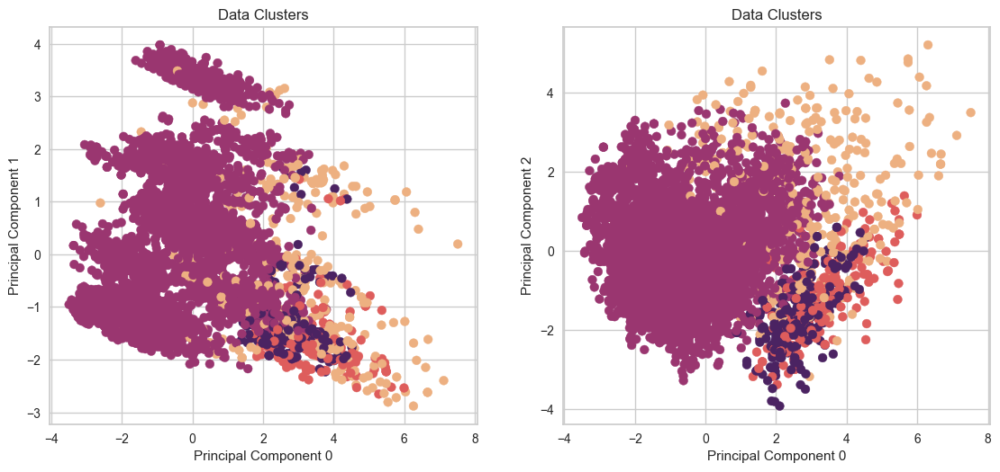

In [235]:
import hdbscan

hdbscan_clusterer = hdbscan.HDBSCAN(min_cluster_size=30)
y_hdbscan = hdbscan_clusterer.fit_predict(df)

num_outliers = (y_hdbscan == -1).sum()
num_data_points = len(df)

print(f"Number of outliers: {num_outliers}")
print(f"Number of data points: {num_data_points}")

# Visualize clusters
plt.figure(figsize=(20, 5))
plt.figure(figsize=(12, 12))
for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=y_hdbscan, cmap='flare', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')


Number of outliers: 227
Number of data points: 5155


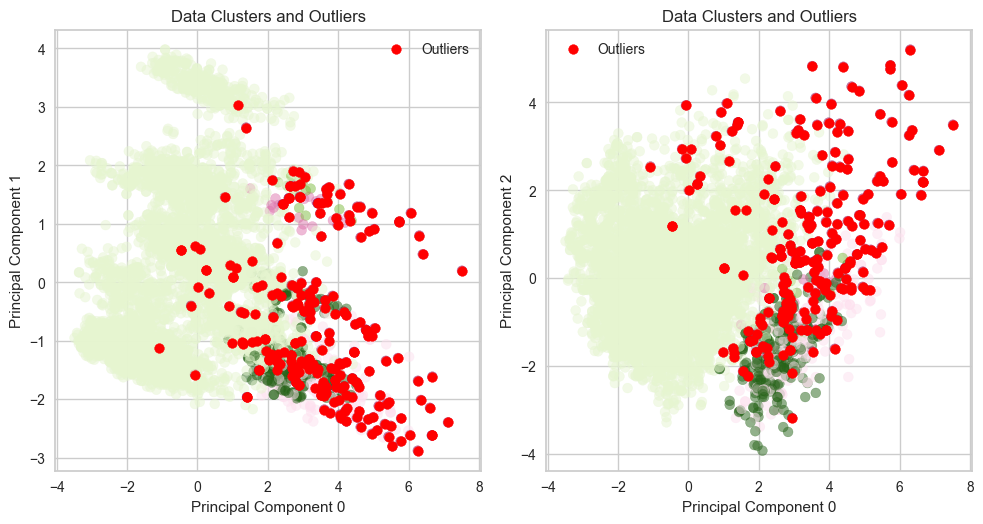

In [236]:
import hdbscan
import matplotlib.pyplot as plt

hdbscan_clusterer = hdbscan.HDBSCAN(min_cluster_size=10)
y_hdbscan = hdbscan_clusterer.fit_predict(df)

num_outliers = (y_hdbscan == -1).sum()
num_data_points = len(df)

print(f"Number of outliers: {num_outliers}")
print(f"Number of data points: {num_data_points}")

plt.figure(figsize=(10, 10))
for i, y in enumerate((1, 2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=y_hdbscan, cmap='PiYG', s=50, alpha=0.5)  # Clustered data
    plt.scatter(X_pca[y_hdbscan == -1, 0], X_pca[y_hdbscan == -1, y], c='red', marker='o', label='Outliers')  # Outliers
    plt.title(f'Data Clusters and Outliers')
    plt.xlabel(f'Principal Component 0')
    plt.ylabel(f'Principal Component {y}')
    plt.legend()

plt.tight_layout()
plt.show()


In [237]:
num_clusters = len(set(y_hdbscan)) #- (1 if -1 in y_hdbscan else 0)

print(f"Number of clusters predicted by HDBSCAN: {num_clusters}")

Number of clusters predicted by HDBSCAN: 6


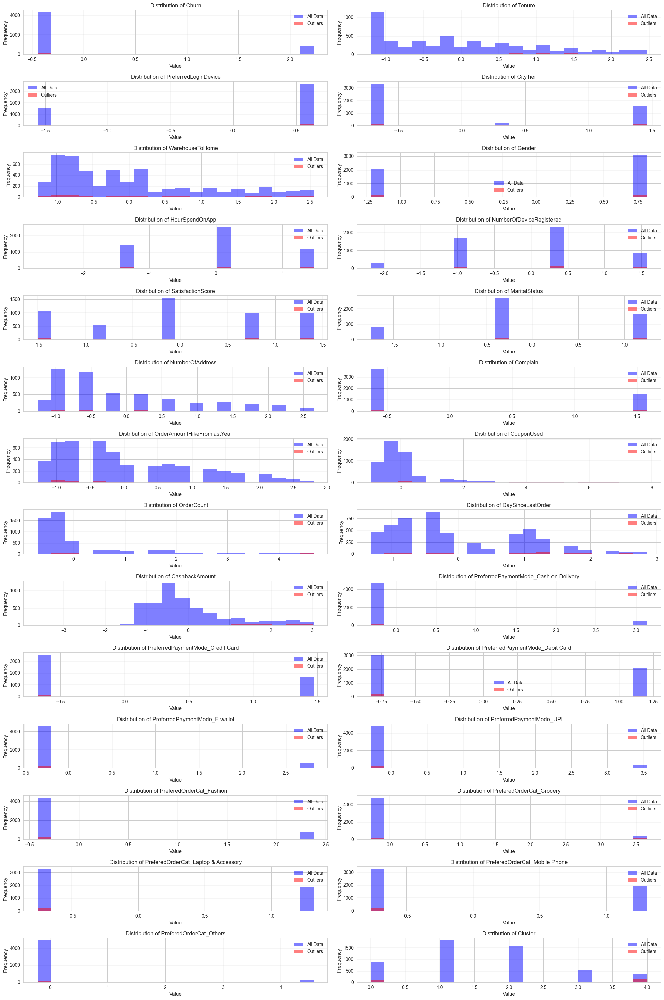

Summary statistics for outlier points:
            Churn      Tenure  PreferredLoginDevice    CityTier  \
count  227.000000  227.000000            227.000000  227.000000   
mean     0.165169    0.854718             -0.155129    0.246392   
std      1.128098    1.014261              1.060104    1.043874   
min     -0.448410   -1.202189             -1.561717   -0.719357   
25%     -0.448410    0.340753             -1.561717   -0.719357   
50%     -0.448410    0.934192              0.640321   -0.719357   
75%     -0.448410    1.527631              0.640321    1.461987   
max      2.230101    2.477134              0.640321    1.461987   

       WarehouseToHome      Gender  HourSpendOnApp  NumberOfDeviceRegistered  \
count       227.000000  227.000000      227.000000                227.000000   
mean          0.289297   -0.213069        0.032724                  0.143824   
std           1.205101    1.021888        1.030094                  1.055152   
min          -1.262534   -1.219317   

In [238]:
outliers = df[y_hdbscan == -1]

outliers_stats = outliers.describe()

num_features = len(outliers.columns)
num_rows = (num_features + 1) // 2  
num_cols = min(2, num_features)  

plt.figure(figsize=(20, 30))
for i, col in enumerate(outliers.columns):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.hist(df[col], bins=20, color='blue', alpha=0.5, label='All Data')
    plt.hist(outliers[col], bins=20, color='red', alpha=0.5, label='Outliers')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.legend()

plt.tight_layout()
plt.show()

print("Summary statistics for outlier points:")
print(outliers_stats)


HDBSCAN kao outliere mahom izdvaja podatke o korisnicima koji imaju veliki Order Count, kao i malu vrednost fičera CouponsUsed. Ostali fičeri imaju normalnu distribuciju.

### Gaussian Mixture 

#### Odredjivanje optimalnog broja klastera za Gaussian Mixture

BIC i AIC se koriste za odabir optimalnog broja klastera u Gaussian mixture modelima, jer kvantitativno procenjuju balans između adekvatnosti modela i njegove složenosti.

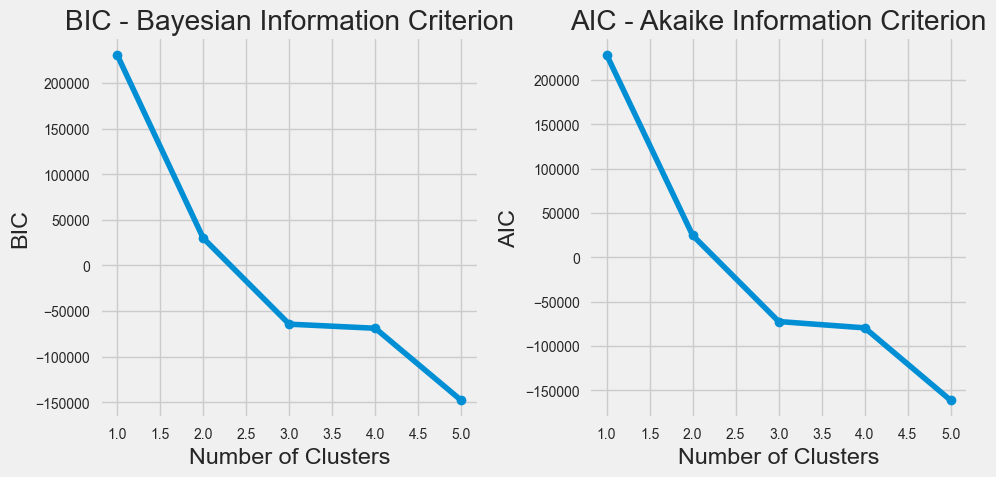

Optimal number of clusters based on BIC: 5
Optimal number of clusters based on AIC: 5


In [129]:
from sklearn.mixture import GaussianMixture

n_clusters_range = range(1, 6)
bics = []
aics = []

for n_clusters in n_clusters_range:
    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    gmm.fit(df)
    bics.append(gmm.bic(df))
    aics.append(gmm.aic(df))

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(n_clusters_range, bics, marker='o')
plt.title('BIC - Bayesian Information Criterion')
plt.xlabel('Number of Clusters')
plt.ylabel('BIC')

plt.subplot(1, 2, 2)
plt.plot(n_clusters_range, aics, marker='o')
plt.title('AIC - Akaike Information Criterion')
plt.xlabel('Number of Clusters')
plt.ylabel('AIC')

plt.tight_layout()
plt.show()

optimal_clusters_bic = n_clusters_range[np.argmin(bics)]
optimal_clusters_aic = n_clusters_range[np.argmin(aics)]

print(f'Optimal number of clusters based on BIC: {optimal_clusters_bic}')
print(f'Optimal number of clusters based on AIC: {optimal_clusters_aic}')

#### Gaussian Mixture - 5 klastera

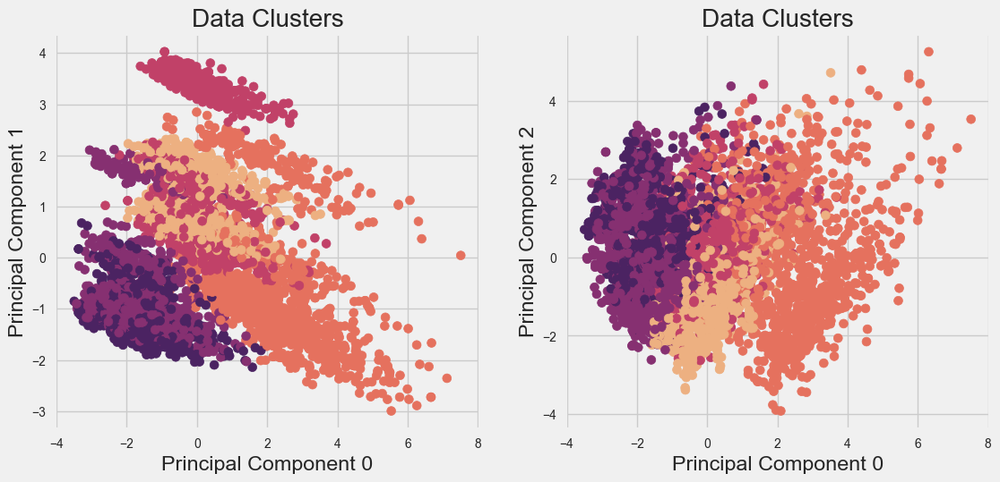

In [130]:
gmm = GaussianMixture(n_components=5, random_state=42)
clusters = gmm.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

plt.show()

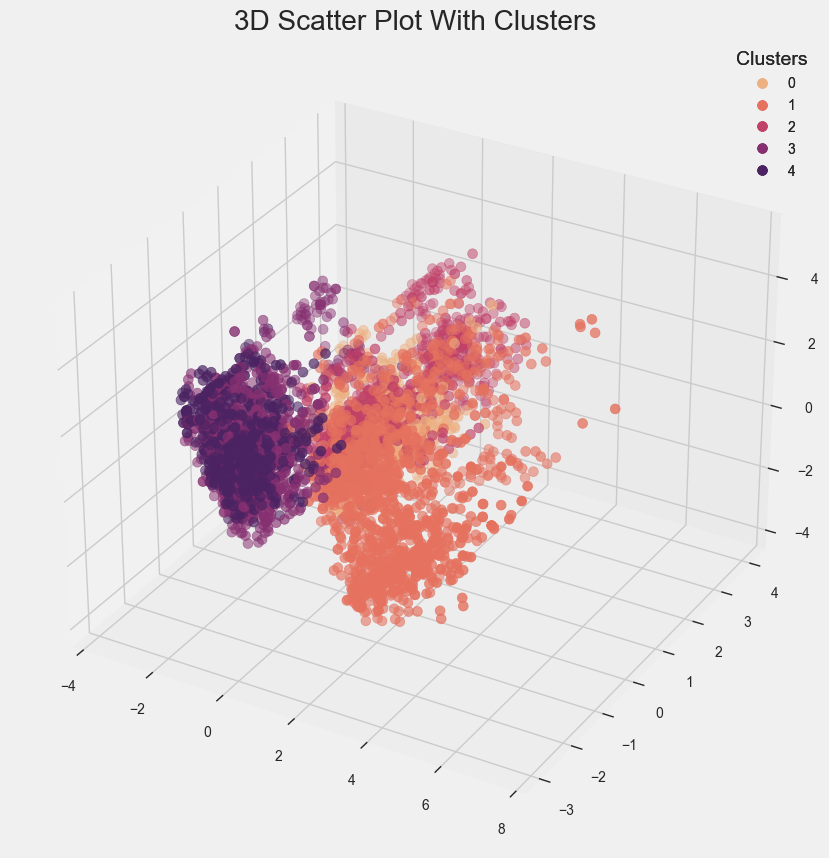

In [131]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

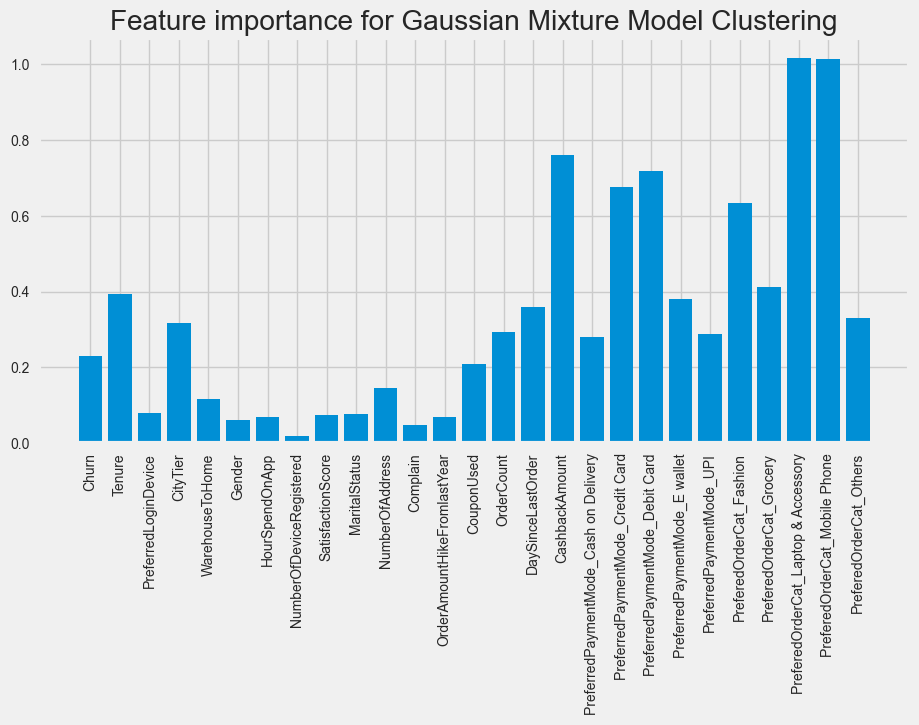

In [132]:
centroids = np.array([df.loc[clusters == label].mean(axis=0) for label in np.unique(clusters)])

feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Gaussian Mixture Model Clustering')
plt.show()

In [133]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'CityTier', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others'],
      dtype='object')


In [134]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(5)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(5), index=important_columns)

In [135]:
cluster_data

,0,1,2,3,4
Tenure,-0.020398,0.660397,-0.108896,-0.364312,-0.465230
CityTier,0.124889,0.036073,0.482332,-0.257505,-0.432527
DaySinceLastOrder,0.174870,0.461531,0.074553,-0.496859,-0.391802
CashbackAmount,-0.187618,1.322858,-0.207227,-0.767745,-0.734005
PreferredPaymentMode_Credit Card,-0.679190,0.005460,0.470049,-0.679190,1.071387
PreferredPaymentMode_Debit Card,0.886740,-0.011888,-0.829230,0.656855,-0.829230
PreferredPaymentMode_E wallet,-0.354363,0.066204,0.675272,-0.132079,-0.354363
PreferedOrderCat_Fashion,-0.420372,1.164556,-0.420372,-0.420372,-0.420372
PreferedOrderCat_Grocery,-0.273213,0.756883,-0.273213,-0.273213,-0.273213
PreferedOrderCat_Laptop & Accessory,1.319655,-0.757774,1.319655,-0.757774,-0.757774


Klaster 0 - obuhvata korisnike sa srednjim ukupnim iskustvom sa kompanijom, manjim brojem porudžbina, kraćim periodom od poslednje porudžbine i srednjim povraćajem novca. Uglavnom plaćaju debitnom karticom. Takođe, ovi korisnici imaju srednji period od poslednje porudžbine. Osim toga, preferiraju kategorije Laptop. <br>
Klaster 1 - karakterišu korisnici sa dugim ukupnim iskustvom sa kompanijom, većim brojem porudžbina i značajno većim povraćajem novca. Takođe, ovi korisnici imaju duži period od poslednje porudžbine i često preferiraju kategorije Grocery i Others. <br>
Klaster 2 - uključuje korisnike sa kraćim ukupnim iskustvom sa kompanijom, manjim brojem porudžbina i srednjim periodom od poslednje porudžbine. Ovi korisnici generalno dobijaju manji povraćaj novca i često plaćaju kreditnom karticom i E-novčanikom. Takođe, preferiraju kategoriju Laptop. <br>
Klaster 3 - uključuje korisnike sa kraćim ukupnim iskustvom sa kompanijom, manjim brojem porudžbina i srednjim periodom od poslednje porudžbine. Ovi korisnici generalno dobijaju manji povraćaj novca i često plaćaju debitnom karticom. Takođe, preferiraju kategoriju Mobile Phone. <br>
Klaster 4 - karakterišu korisnici sa kraćim ukupnim iskustvom sa kompanijom, manjim brojem porudžbina i manjim povraćajem novca. Uglavnom plaćaju kreditnom karticom. Takođe, ovi korisnici imaju kraći period od poslednje porudžbine i često preferiraju kategorije Mobile Phone. <br>

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

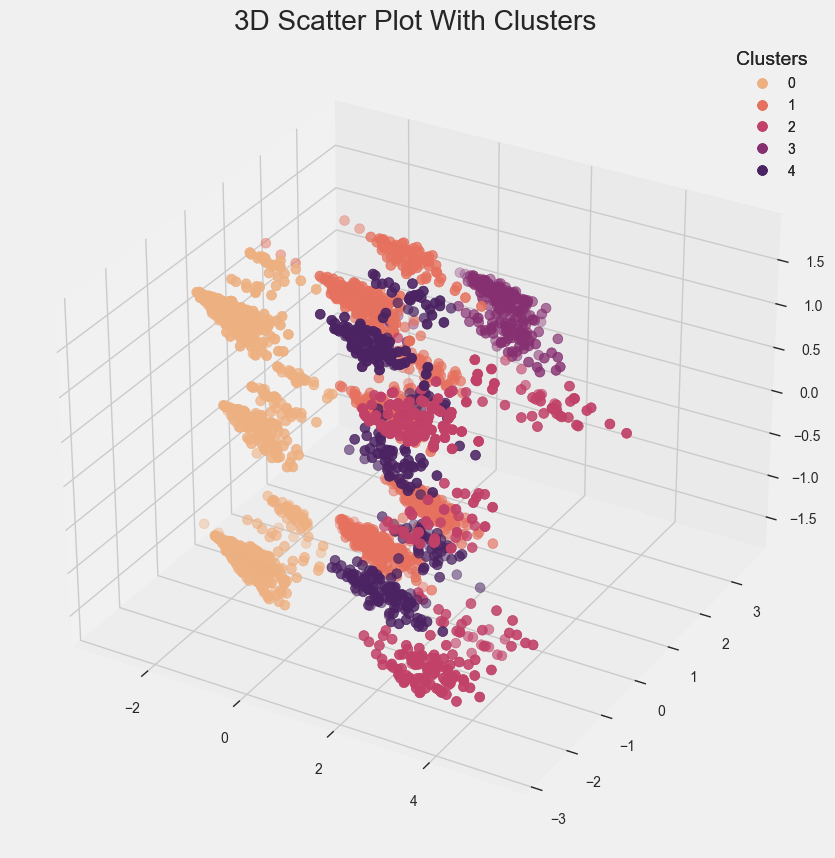

In [136]:
selected_columns = ['Tenure', 'CityTier', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=5)
X_pca_selected = pca.fit_transform(df_selected)

gmm = GaussianMixture(n_components=5)
clusters = gmm.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='flare', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

### Birch

#### Procena i izbor optimalnog broja klastera za Birch

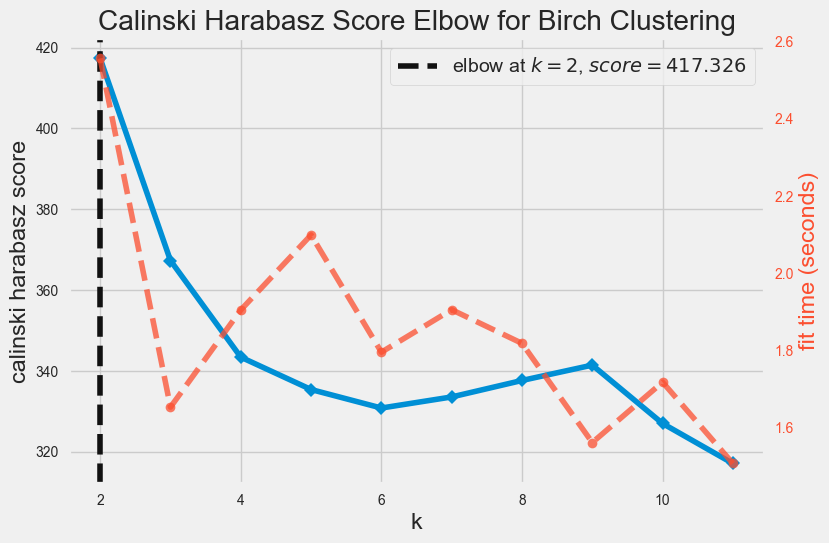

<AxesSubplot: title={'center': 'Calinski Harabasz Score Elbow for Birch Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [137]:
from sklearn.cluster import Birch

elbow = KElbowVisualizer(Birch(), k=(2,12), metric='calinski_harabasz')
elbow.fit(df)
elbow.show()

Jasno se vidi da je po Calinski Harabasz metrici optimalan broj klastera 2.

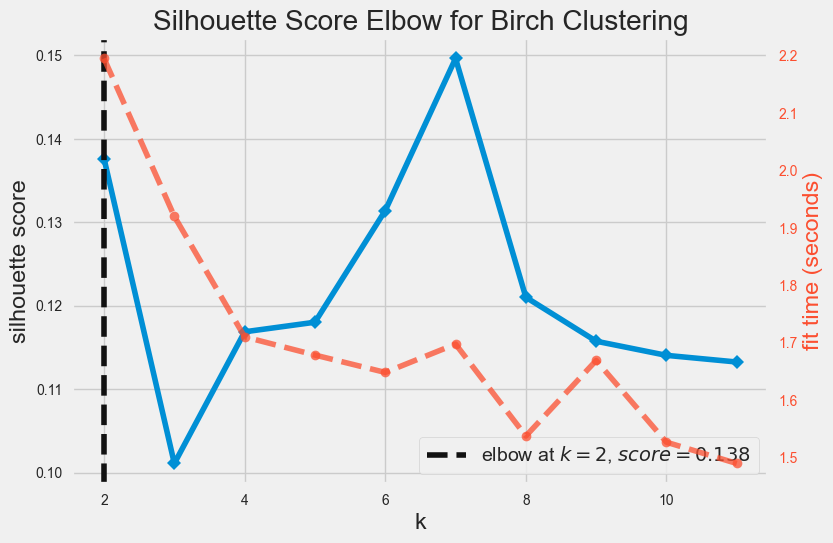

<AxesSubplot: title={'center': 'Silhouette Score Elbow for Birch Clustering'}, xlabel='k', ylabel='silhouette score'>

In [138]:
elbow = KElbowVisualizer(Birch(), k=(2,12), metric='silhouette')
elbow.fit(df)
elbow.show()

Silhouette koeficijent ima najveću vrednost za 2 klastera, te zaključujemo da je po ovoj metodi to optimalan broj.

#### Birch - 2 klastera

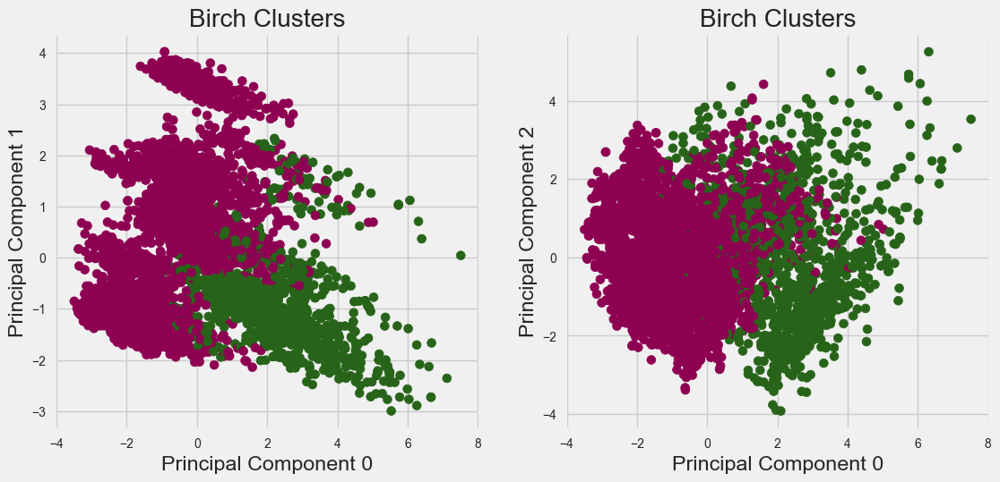

In [139]:
from sklearn.cluster import Birch
import matplotlib.pyplot as plt


birch = Birch(n_clusters=2)
clusters = birch.fit_predict(X_pca)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='PiYG', s=50)
    plt.title('Birch Clusters')
    plt.xlabel(f'Principal Component 0')
    plt.ylabel(f'Principal Component {y}')

plt.show()


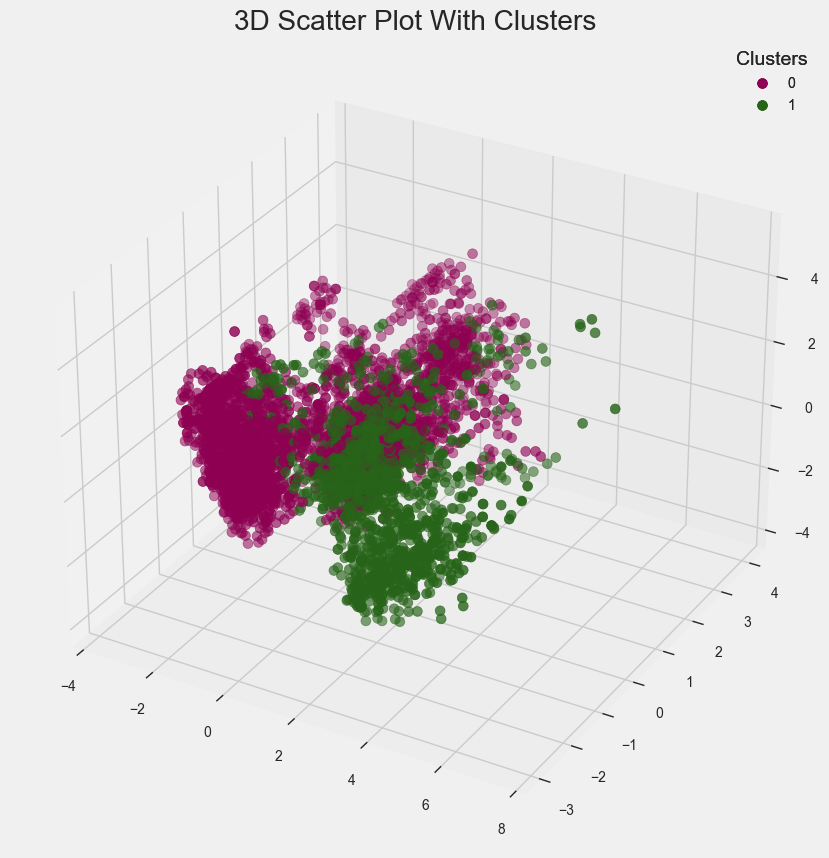

In [140]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='PiYG', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

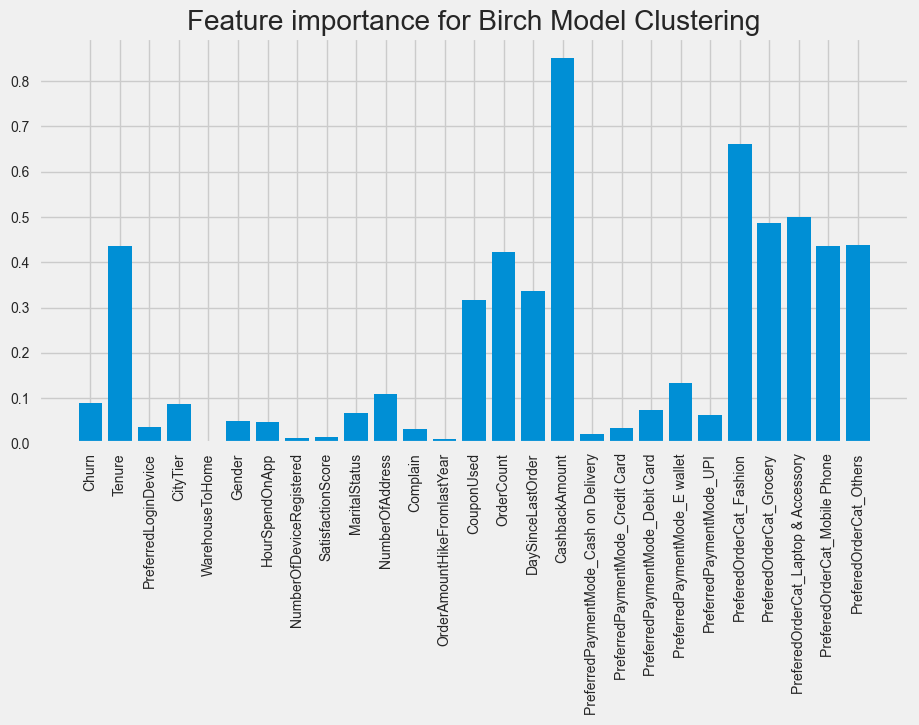

In [141]:
centroids = np.array([df.loc[clusters == label].mean(axis=0) for label in np.unique(clusters)])

feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Birch Model Clustering')
plt.show()

In [142]:
important_columns = df.columns[feature_importance > 0.2]
print(important_columns)

Index(['Tenure', 'CouponUsed', 'OrderCount', 'DaySinceLastOrder',
       'CashbackAmount', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others'],
      dtype='object')


In [143]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(2)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(2), index=important_columns)

In [144]:
cluster_data

,0,1
Tenure,-0.218211,0.655651
CouponUsed,-0.157873,0.474356
OrderCount,-0.210962,0.633869
DaySinceLastOrder,-0.168008,0.504806
CashbackAmount,-0.425632,1.278881
PreferedOrderCat_Fashion,-0.330611,0.993375
PreferedOrderCat_Grocery,-0.242699,0.729227
PreferedOrderCat_Laptop & Accessory,0.250050,-0.751317
PreferedOrderCat_Mobile Phone,0.217565,-0.653708
PreferedOrderCat_Others,-0.218573,0.656736


Klaster 0 - kraće iskustvo sa kompanijom, češće porudžbine, manje povraćaja novca, kupci koji pripadaju ovom klasteru značajno više preferiraju kategoriju Mobile Phone i Laptop <br>
Klaster 1 - duže iskustvo sa kompanijom, redje porudžbine, generalno veći povraćaj novca, osobe koje preferiraju kupovinu proizvoda iz kategorije Fashion, Grocery i Others <br>

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

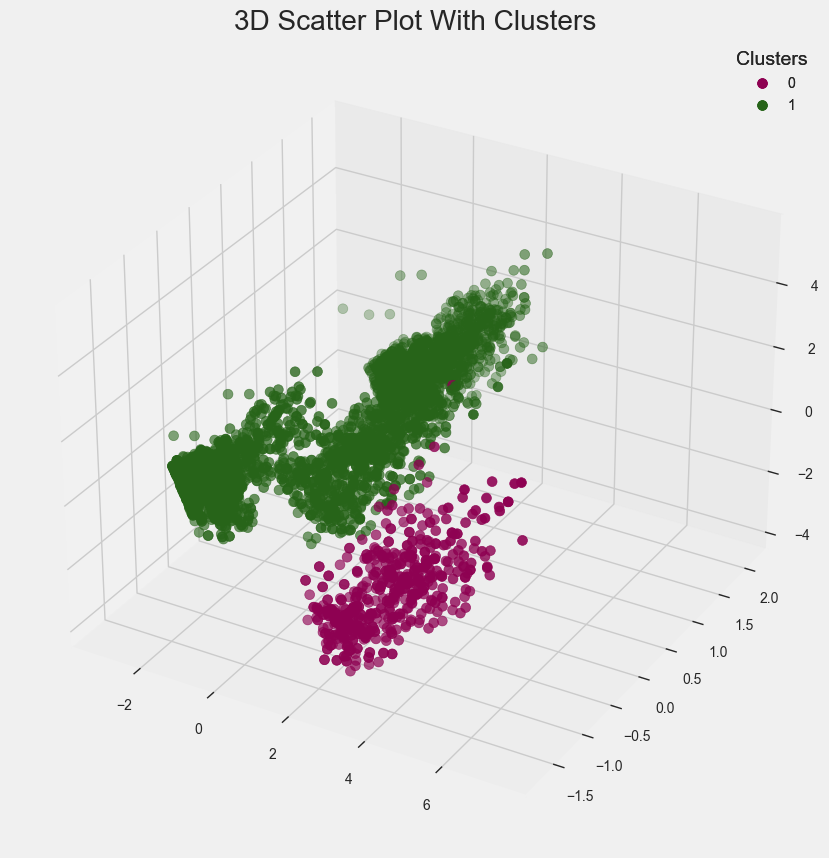

In [145]:
selected_columns = ['Tenure', 'CouponUsed', 'OrderCount', 'DaySinceLastOrder',
       'CashbackAmount', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=7)
X_pca_selected = pca.fit_transform(df_selected)

birch = Birch(n_clusters=2)
clusters = birch.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='PiYG', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

### Fuzzy KMeans

#### Fuzzy KMeans sa 2 klastera

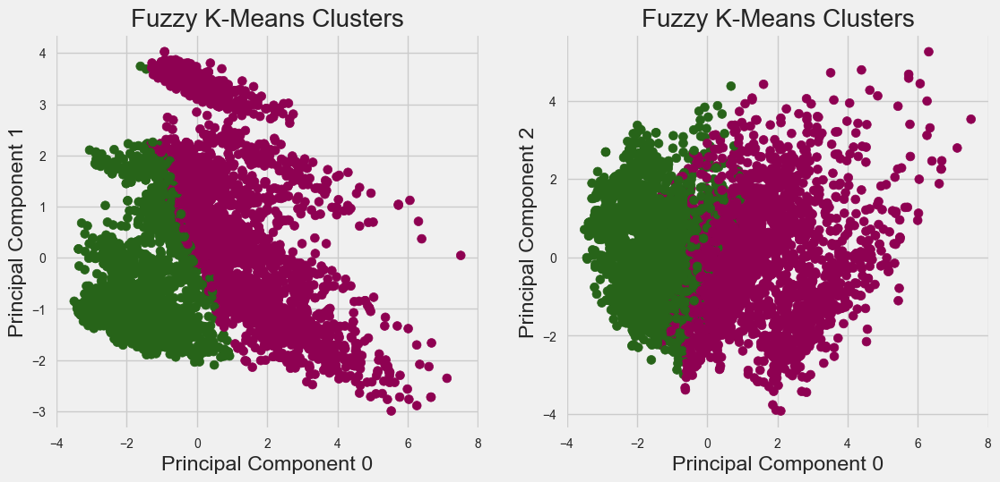

In [146]:
import numpy as np
import skfuzzy as fuzz
import matplotlib.pyplot as plt


cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    X_pca.T, c=2, m=2, error=0.005, maxiter=1000, init=None
)

clusters = np.argmax(u, axis=0)

plt.figure(figsize=(12, 12))
for i, y in enumerate((1, 2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='PiYG', s=50)
    plt.title('Fuzzy K-Means Clusters')
    plt.xlabel('Principal Component 0')
    plt.ylabel(f'Principal Component {y}')

plt.show()

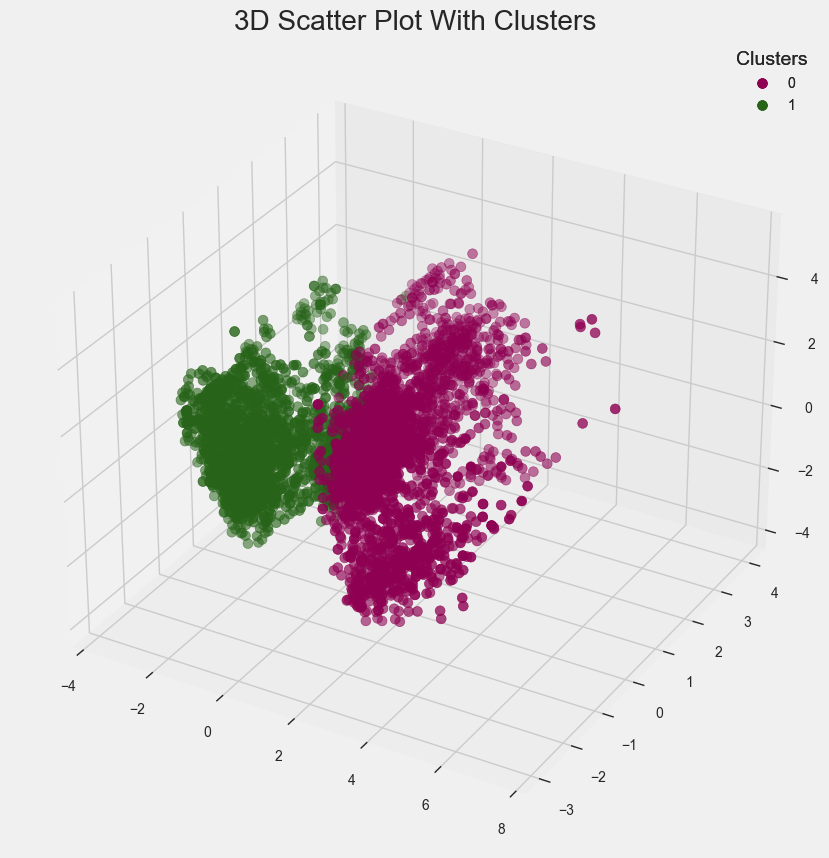

In [147]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='PiYG', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

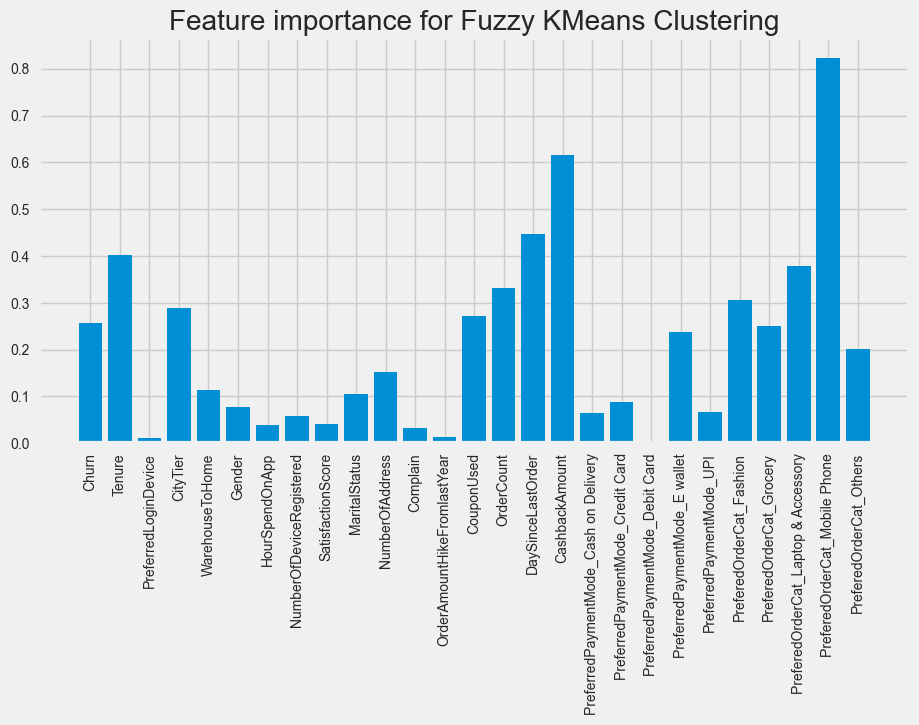

In [148]:
centroids = np.array([df.loc[clusters == label].mean(axis=0) for label in np.unique(clusters)])

feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Fuzzy KMeans Clustering')
plt.show()

In [149]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone'],
      dtype='object')


In [150]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(2)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(2), index=important_columns)

In [151]:
cluster_data

,0,1
Tenure,0.366856,-0.439101
OrderCount,0.301911,-0.361367
DaySinceLastOrder,0.407143,-0.487323
CashbackAmount,0.561381,-0.671935
PreferedOrderCat_Fashion,0.279433,-0.334462
PreferedOrderCat_Laptop & Accessory,0.345305,-0.413307
PreferedOrderCat_Mobile Phone,-0.750135,0.897860


Klaster 0 - duže iskustvo sa kompanijom, redje porudžbine, generalno veći povraćaj novca, osobe koje preferiraju kupovinu proizvoda iz kategorije Fashion and Accessories <br>
Klaster 1 - kraće iskustvo sa kompanijom, češće porudžbine, manje povraćaja novca, kupci koji pripadaju ovom klasteru značajno više preferiraju kategoriju Mobile Phone <br>

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

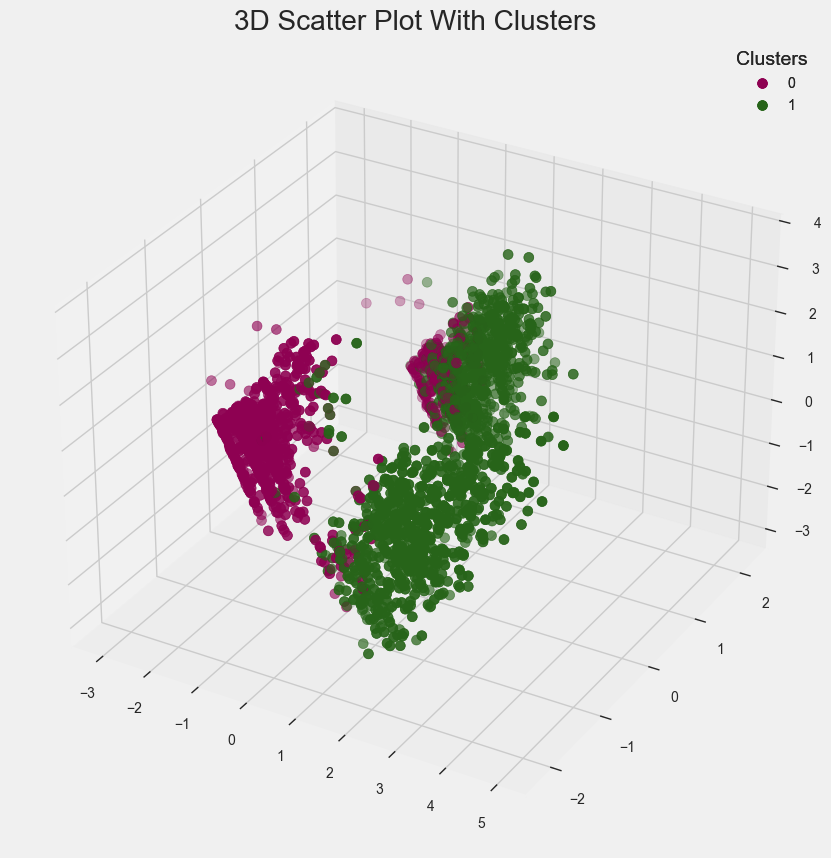

In [153]:
selected_columns = ['Tenure', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=7)
X_pca_selected = pca.fit_transform(df_selected)

cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    X_pca.T, c=2, m=2, error=0.005, maxiter=1000, init=None
)

clusters = np.argmax(u, axis=0)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='PiYG', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

### Bisecting KMeans

#### Procena i izbor optimalnog broja klastera za Bisecting KMeans

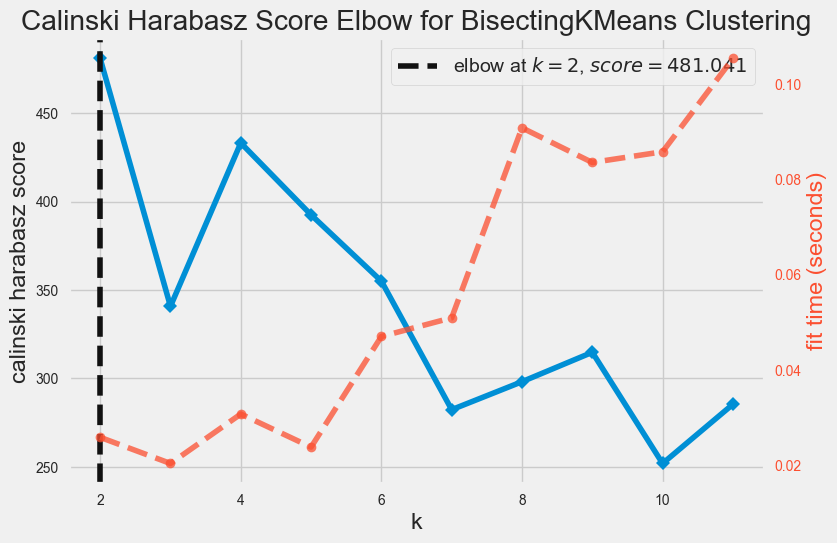

<AxesSubplot: title={'center': 'Calinski Harabasz Score Elbow for BisectingKMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [154]:
from sklearn.cluster import BisectingKMeans

elbow = KElbowVisualizer(BisectingKMeans(), k=(2,12), metric='calinski_harabasz')
elbow.fit(df)
elbow.show()

Jasno se vidi da je po Calinski Harabasz metrici optimalan broj klastera 2.

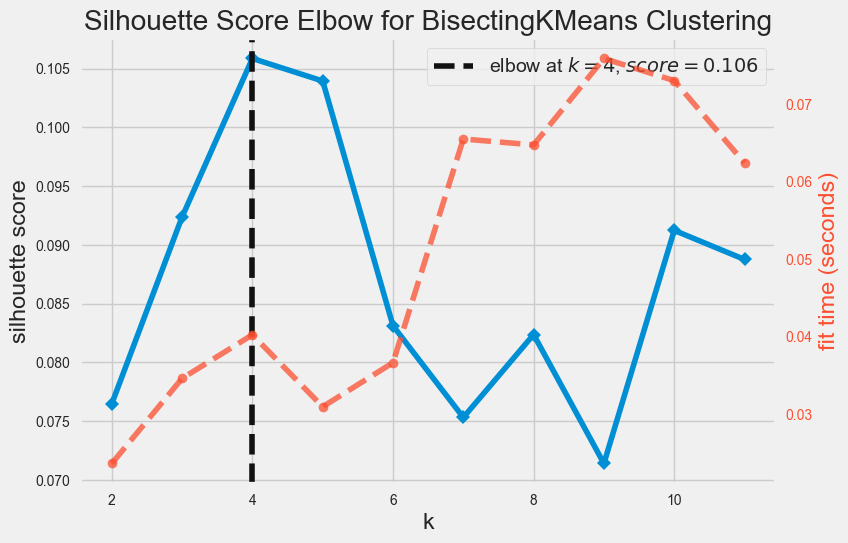

<AxesSubplot: title={'center': 'Silhouette Score Elbow for BisectingKMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [155]:
elbow = KElbowVisualizer(BisectingKMeans(), k=(2,12), metric='silhouette')
elbow.fit(df)
elbow.show()

Silhouette koeficijent ima najveću vrednost za 2 klastera, te zaključujemo da je po ovoj metodi to optimalan broj.

#### Bisecting KMeans sa 2 klastera

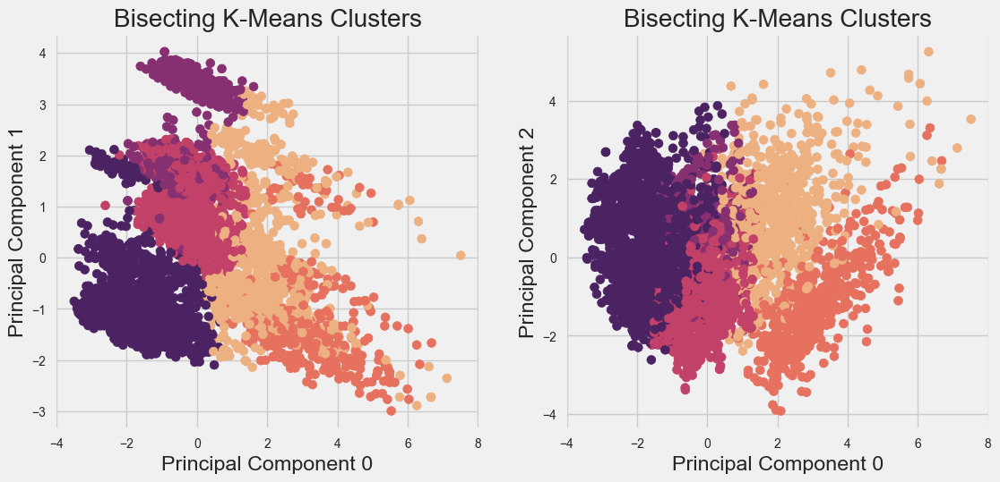

In [156]:
from sklearn.cluster import BisectingKMeans
import matplotlib.pyplot as plt

bkm = BisectingKMeans(n_clusters=5)
clusters = bkm.fit_predict(X_pca)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1, 2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title('Bisecting K-Means Clusters')
    plt.xlabel('Principal Component 0')
    plt.ylabel(f'Principal Component {y}')

plt.show()


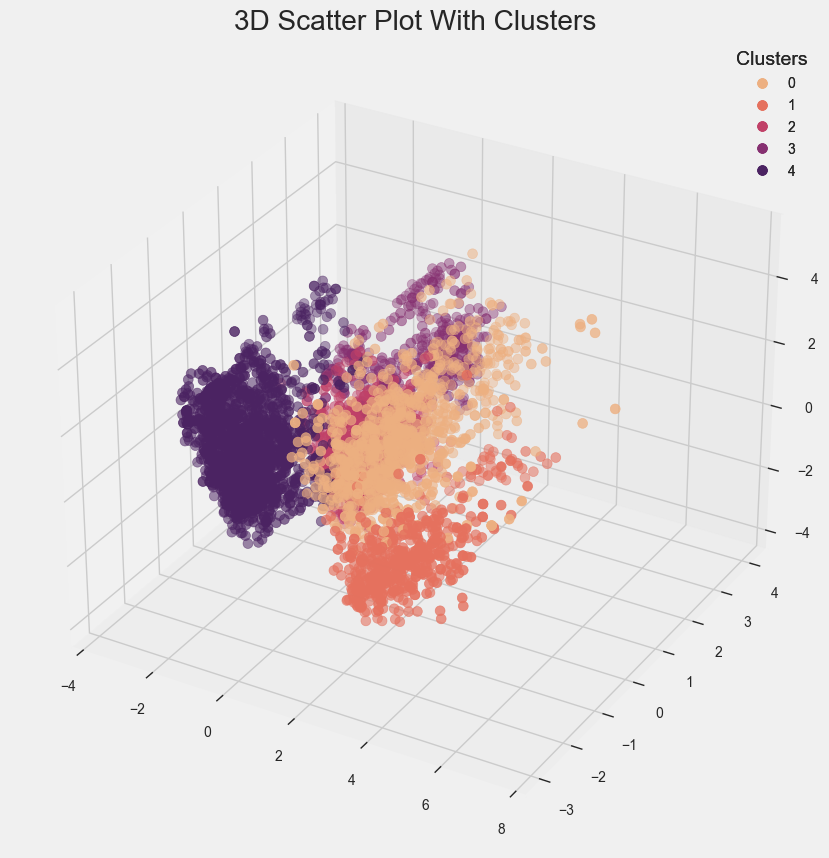

In [157]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

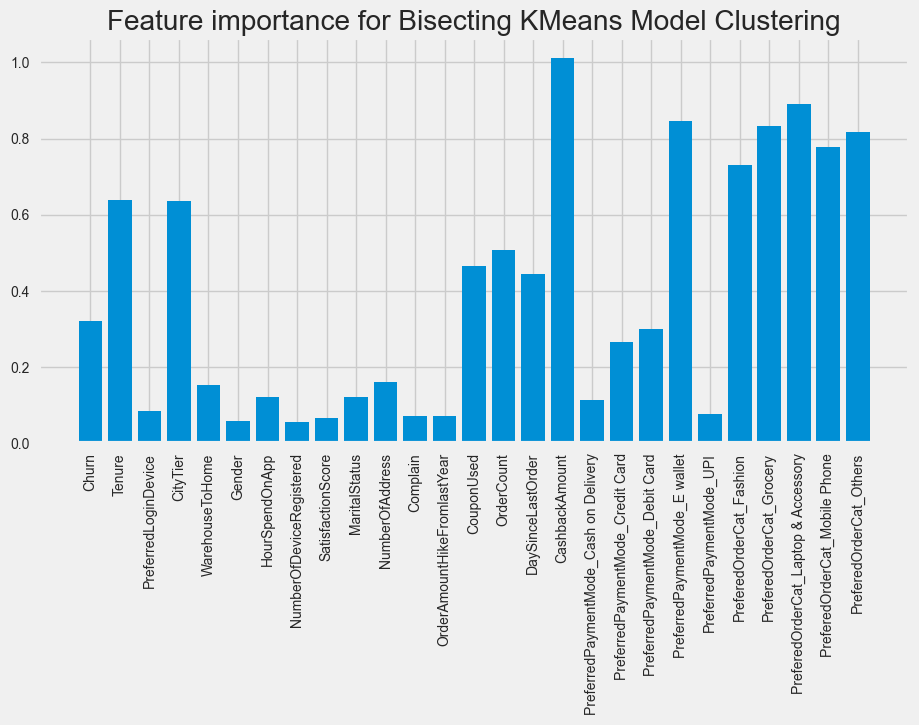

In [158]:
centroids = np.array([df.loc[clusters == label].mean(axis=0) for label in np.unique(clusters)])

feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Bisecting KMeans Model Clustering')
plt.show()

In [159]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Churn', 'Tenure', 'CityTier', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder', 'CashbackAmount',
       'PreferredPaymentMode_Debit Card', 'PreferredPaymentMode_E wallet',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others'],
      dtype='object')


In [160]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(5)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(5), index=important_columns)

In [161]:
cluster_data

,0,1,2,3,4
Churn,-0.134864,-0.379788,-0.352511,0.354442,0.326138
Tenure,0.371073,1.310290,-0.043203,-0.363625,-0.440618
CityTier,0.184786,-0.196124,-0.019563,1.428368,-0.362553
CouponUsed,0.912532,0.195277,-0.248857,-0.301951,-0.267940
OrderCount,0.878007,0.544594,-0.269676,-0.288673,-0.339505
DaySinceLastOrder,0.737481,0.466437,0.054530,-0.232919,-0.478051
CashbackAmount,0.597870,2.168779,-0.226095,-0.188015,-0.716366
PreferredPaymentMode_Debit Card,-0.064969,0.009438,0.216884,-0.664457,0.042530
PreferredPaymentMode_E wallet,0.175025,-0.104213,-0.354363,1.925364,-0.278224
PreferedOrderCat_Fashion,1.498924,-0.338343,-0.398571,-0.230490,-0.322640


Klaster 0 - drastično duže iskustvo sa kompanijom, značajno veći povraćaj novca, veći broj porudžbina, korisnici koji značajno više preferiraju kategoriju Fashion, uglavnom plaćaju E-novčanikom <br>
Klaster 1 - duže iskustvo sa kompanijom,  veći povraćaj novca, veći broj porudžbina, korisnici koji značajno više preferiraju kategoriju Grocery i Others, uglavnom plaćaju debitnom karticom <br>
Klaster 2 - (otprilike) srednje iskustvo sa kompanijom, izuzetno veći povraćaj novca, srednji broj porudžbina, korisnici koji preferiraju kategoriju Laptop & Accessory, uglavnom plaćaju debitnom karticom <br>
Klaster 3 - kraće iskustvo sa kompanijom, manji povraćaj novca, manji broj porudžbina, korisnici koji preferiraju kategoriju Laptop & Accessory, uglavnom plaćaju E-novčanikom <br>
Klaster 4 - kraće iskustvo sa kompanijom, manji povraćaj novca, manji broj porudžbina, korisnici koji preferiraju kategoriju Mobile Phone, uglavnom plaćaju debitnom karticom <br>

##### Izbacivanje fičera koji nemaju značajniji uticaj na klasterizaciju

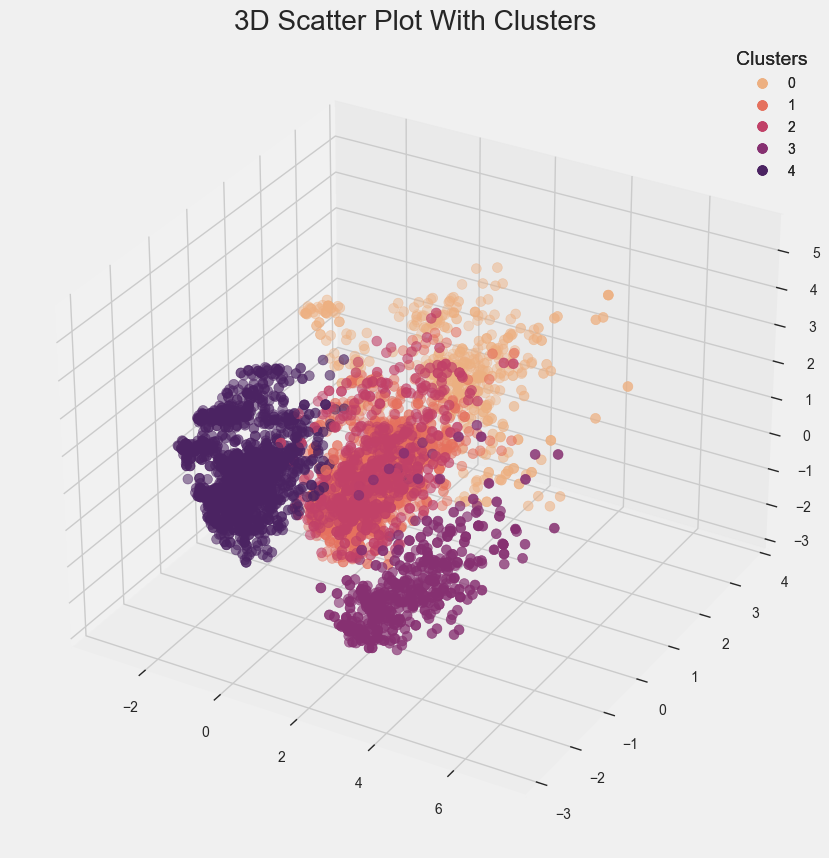

In [162]:
selected_columns = ['Churn', 'Tenure', 'CityTier', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder', 'CashbackAmount',
       'PreferredPaymentMode_Debit Card', 'PreferredPaymentMode_E wallet',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others']

df_selected = df[selected_columns].copy()

pca = PCA(n_components=7)
X_pca_selected = pca.fit_transform(df_selected)

bkm = BisectingKMeans(n_clusters=5)
clusters = bkm.fit_predict(df_selected)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca_selected[:, 0], X_pca_selected[:, 1], X_pca_selected[:, 2], c=clusters, cmap='flare', s=50)

ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)

plt.show()

### Mean Shift

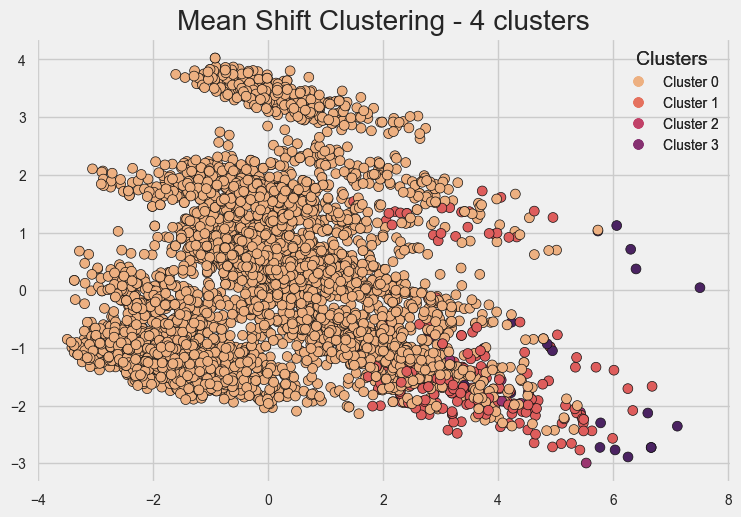

In [163]:
from sklearn.cluster import MeanShift, estimate_bandwidth

bandwidth = estimate_bandwidth(df, quantile=0.2, n_samples=50)

ms = MeanShift(bandwidth=bandwidth)
ms.fit(df)

cluster_centers = ms.cluster_centers_
labels = ms.labels_

n_clusters = len(np.unique(labels))

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='flare', s=50, edgecolors='k', marker='o')
#plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', marker='x', s=200, linewidths=3, label='Cluster Centers')

legend_labels = [f'Cluster {i}' for i in range(n_clusters)]
scatter_legend = plt.legend(handles=scatter.legend_elements()[0], title='Clusters', labels=legend_labels)

plt.gca().add_artist(scatter_legend)

plt.title(f'Mean Shift Clustering - {n_clusters} clusters')
plt.show()

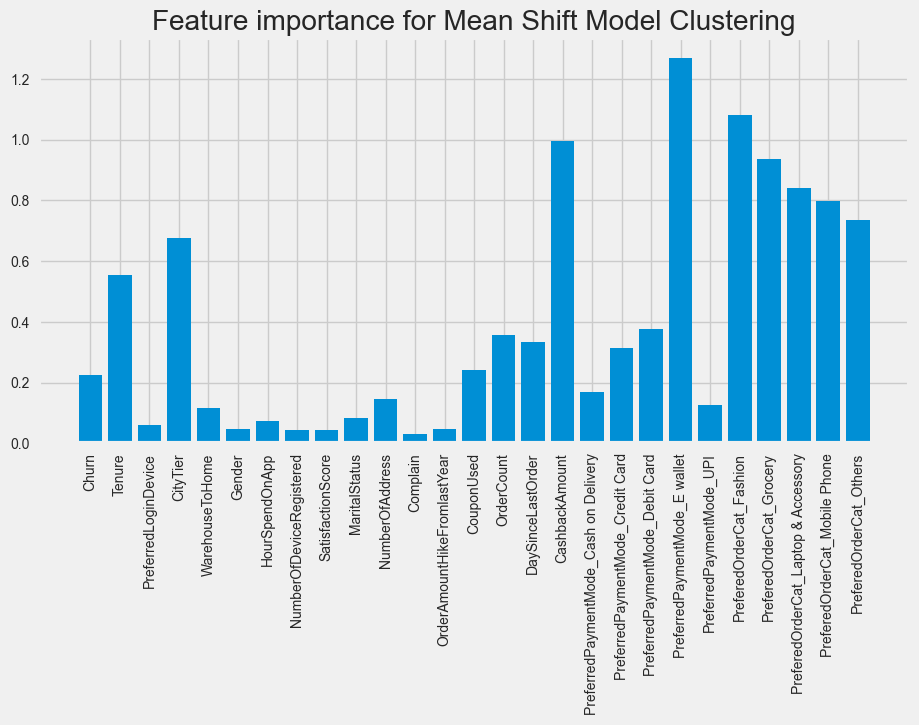

In [164]:
centroids = np.array([df.loc[clusters == label].mean(axis=0) for label in np.unique(clusters)])

feature_importance = centroids.std(axis=0)

plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for Mean Shift Model Clustering')
plt.show()

In [165]:
important_columns = df.columns[feature_importance > 0.3]
print(important_columns)

Index(['Tenure', 'CityTier', 'OrderCount', 'DaySinceLastOrder',
       'CashbackAmount', 'PreferredPaymentMode_Credit Card',
       'PreferredPaymentMode_Debit Card', 'PreferredPaymentMode_E wallet',
       'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery',
       'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone',
       'PreferedOrderCat_Others'],
      dtype='object')


In [166]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(5)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(5), index=important_columns)

In [167]:
cluster_data

,0,1,2,3,4
Tenure,0.009180,-0.038719,0.241116,1.230625,-0.411125
CityTier,1.461779,0.081451,-0.086199,-0.295901,-0.408364
OrderCount,0.015806,-0.053520,0.359694,0.726083,-0.296769
DaySinceLastOrder,0.073289,0.166112,0.401053,0.510009,-0.451573
CashbackAmount,0.148265,-0.203138,0.706399,2.168025,-0.751415
PreferredPaymentMode_Credit Card,-0.679190,0.039375,0.061123,0.172543,0.107216
PreferredPaymentMode_Debit Card,-0.829230,0.160142,0.093004,0.132988,0.052602
PreferredPaymentMode_E wallet,2.821964,-0.354363,-0.354363,-0.354363,-0.354363
PreferedOrderCat_Fashion,0.168681,-0.420372,2.374547,-0.420372,-0.415818
PreferedOrderCat_Grocery,-0.040632,-0.273213,-0.273213,2.117795,-0.273213


Klaster 0 - (otprilike) srednje iskustvo sa kompanijom, izuzetno veći povraćaj novca, korisnici koji preferiraju kategoriju Laptop & Accessory, uglavnom plaćaju E-novčanikom <br>
Klaster 1 - kraće iskustvo sa kompanijom, manji povraćaj novca, korisnici koji preferiraju kategoriju Laptop & Accessory, uglavnom plaćaju karticom <br>
Klaster 2 - (otprilike) srednje iskustvo sa kompanijom, izuzetno veći povraćaj novca, korisnici koji preferiraju kategoriju Fashion, uglavnom plaćaju karticom <br>
Klaster 3 - duže iskustvo sa kompanijom, značajno veći povraćaj novca, korisnici koji značajno više preferiraju kategoriju Grocery i Others, uglavnom plaćaju karticom <br>
Klaster 4 - kraće iskustvo sa kompanijom, manji povraćaj novca, korisnici koji preferiraju kategoriju Mobile Phone, uglavnom plaćaju karticom <br>

### OPTICS

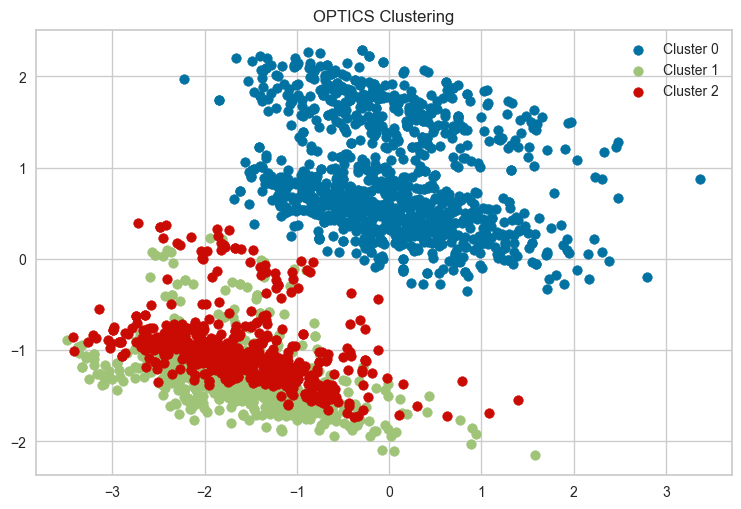

In [232]:
from sklearn.cluster import OPTICS

optics = OPTICS(min_samples=10, xi=0.005, min_cluster_size=0.1)
optics.fit(df)

labels = optics.labels_

unique_labels = set(labels) - {-1}  
n_clusters = len(unique_labels)

for cluster_label in unique_labels:
    cluster_mask = (labels == cluster_label)
    plt.scatter(X_pca[cluster_mask, 0], X_pca[cluster_mask, 1], label=f'Cluster {cluster_label}')

plt.title(f'OPTICS Clustering')
plt.legend()
plt.show()

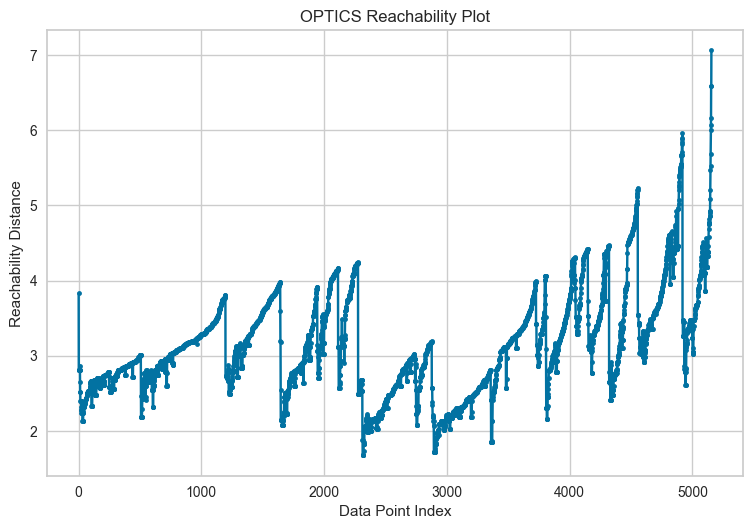

In [233]:
reachability = optics.reachability_[optics.ordering_]
plt.plot(range(len(reachability)), reachability, marker='.')
plt.title('OPTICS Reachability Plot')
plt.xlabel('Data Point Index')
plt.ylabel('Reachability Distance')
plt.show()

In [234]:
df['cluster'] = labels
df_filtered = df[df['cluster'] != -1]
cluster_means = df_filtered.groupby('cluster').mean()

In [235]:
pd.set_option("display.max_columns", None)
pd.set_option("display.width", None)

In [236]:
cluster_means

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,Gender,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,PreferedOrderCat_Fashion,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,Cluster
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-0.389053,-0.002379,-0.069292,0.046027,0.047401,-0.025402,-0.021346,-0.062804,-0.034586,-0.002603,0.040646,-0.148097,-0.130256,-0.146000,-0.203295,0.097861,-0.197628,-0.318214,0.137459,0.433763,-0.354325,-0.2817,-0.420324,-0.273185,1.319857,-0.766563,-0.21855,1.0
1,0.087292,-0.457225,0.020080,-0.548485,-0.104106,0.092728,0.109569,-0.008185,0.053871,0.101655,-0.158746,-0.056981,-0.028211,-0.306980,-0.359111,-0.422339,-0.735082,-0.318214,1.472552,-0.829095,-0.354325,-0.2817,-0.420324,-0.273185,-0.757658,1.304524,-0.21855,4.0
2,-0.208830,-0.321266,0.155794,-0.510588,-0.334556,0.152476,0.101172,0.018868,-0.167576,0.076602,-0.354741,-0.295915,0.011873,-0.312384,-0.376144,-0.553475,-0.780431,-0.318214,-0.679093,1.206135,-0.354325,-0.2817,-0.420324,-0.273185,-0.757658,1.304524,-0.21855,4.0


### Analiza i Biznis plan

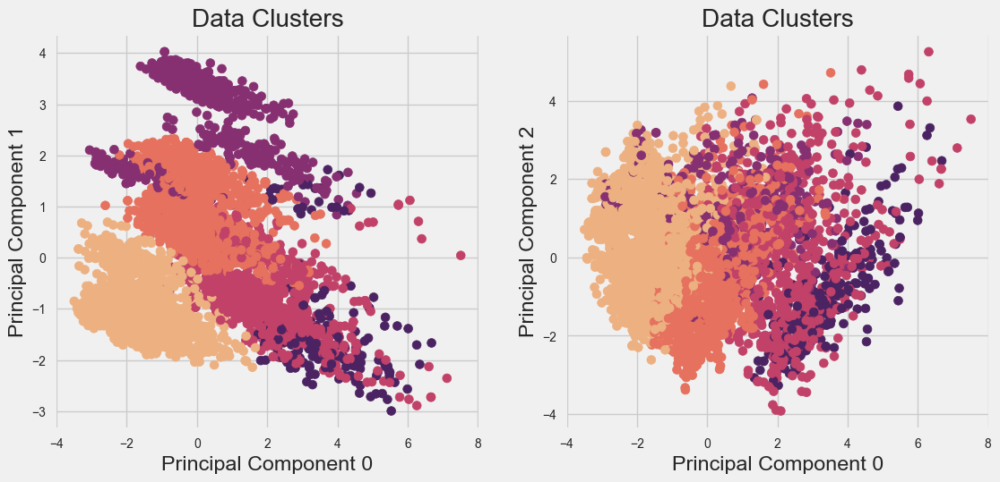

In [168]:
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(df)

plt.figure(figsize=(12, 12))

for i, y in enumerate((1,2), 1):
    plt.subplot(2, 2, i)
    plt.scatter(X_pca[:, 0], X_pca[:, y], c=clusters, cmap='flare', s=50)
    plt.title(f'Data Clusters')
    plt.xlabel(f'Principal Component {0}')
    plt.ylabel(f'Principal Component {y}')

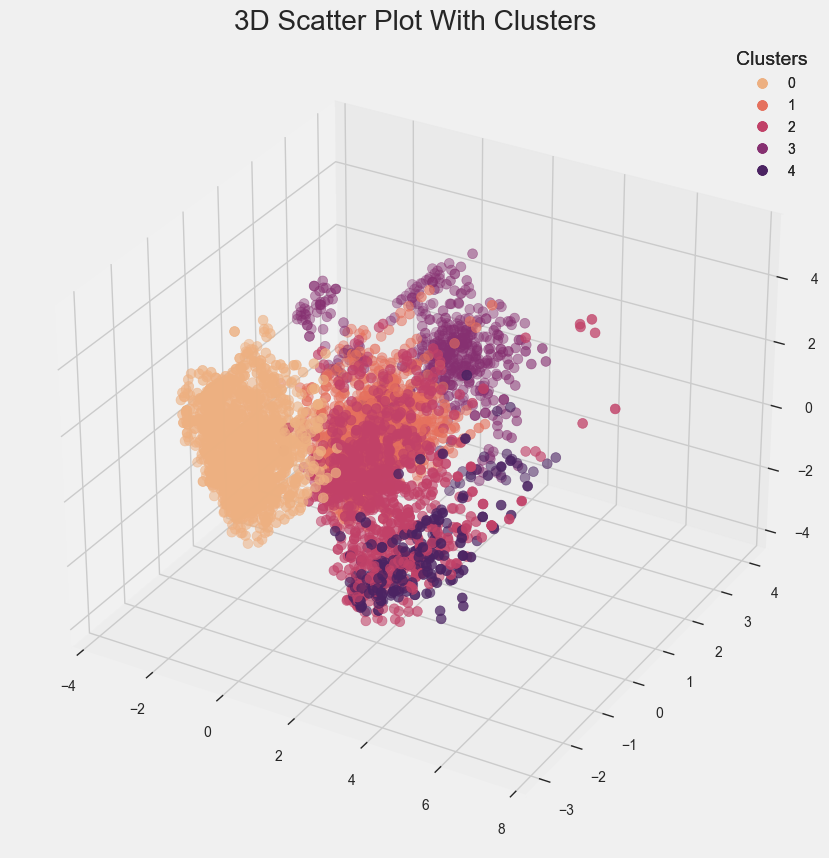

In [169]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=clusters, cmap='flare', s=50)
ax.set_title('3D Scatter Plot With Clusters')

legend = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend)
plt.show()

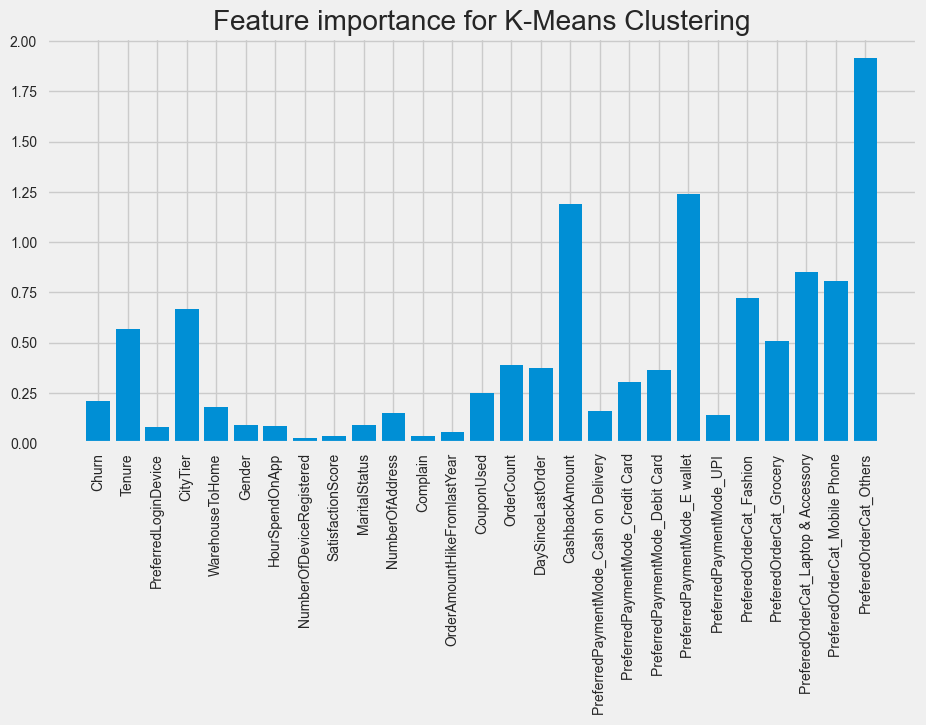

In [170]:
cent = kmeans.cluster_centers_
feature_importance = cent.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(df.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance for K-Means Clustering')
plt.show()

In [171]:
important_columns = df.columns[feature_importance > 0.2]
print(important_columns)

Index(['Churn', 'Tenure', 'CityTier', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder', 'CashbackAmount',
       'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
       'PreferredPaymentMode_E wallet', 'PreferedOrderCat_Fashion',
       'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory',
       'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others'],
      dtype='object')


In [172]:
cluster_data = np.array([df[clusters == i][important_columns].mean(axis=0) for i in range(5)])
cluster_data = pd.DataFrame(cluster_data.T, columns=range(5), index=important_columns)

In [173]:
cluster_data

,0,1,2,3,4
Churn,0.254043,-0.213554,-0.158403,0.162727,-0.266110
Tenure,-0.404295,-0.049268,0.576447,-0.060959,1.192103
CityTier,-0.407176,0.077207,-0.122271,1.461779,-0.181114
CouponUsed,-0.207243,-0.041597,0.392182,-0.063592,0.387366
OrderCount,-0.290306,-0.062020,0.482103,-0.047337,0.754605
DaySinceLastOrder,-0.442483,0.152972,0.412277,0.017435,0.655638
CashbackAmount,-0.748521,-0.211469,1.096310,0.006763,2.609827
PreferredPaymentMode_Credit Card,0.106179,0.042579,0.080815,-0.679190,0.108180
PreferredPaymentMode_Debit Card,0.052676,0.158386,0.116258,-0.829230,-0.049804
PreferredPaymentMode_E wallet,-0.354363,-0.354363,-0.322214,2.821964,-0.002940


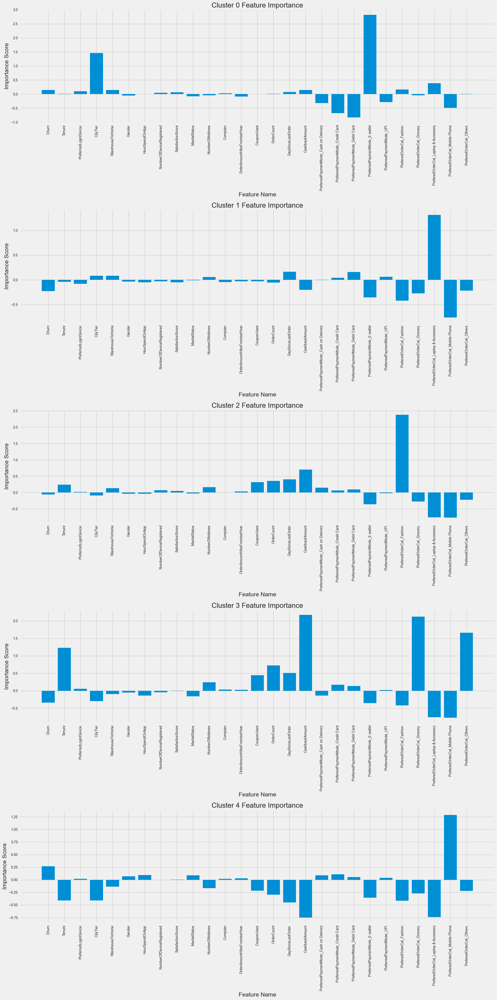

In [176]:
feature_names = feature_names = ['Churn', 'Tenure', 'PreferredLoginDevice', 'CityTier', 'WarehouseToHome', 'Gender', 'HourSpendOnApp', 'NumberOfDeviceRegistered', 
                                 'SatisfactionScore', 'MaritalStatus', 'NumberOfAddress', 'Complain', 'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount', 
                                 'DaySinceLastOrder', 'CashbackAmount', 'PreferredPaymentMode_Cash on Delivery', 'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card', 
                                 'PreferredPaymentMode_E wallet', 'PreferredPaymentMode_UPI', 'PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory', 
                                 'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others']

plt.figure(figsize=(20, 40))  
num_clusters = len(centroids)  

for cluster_label in range(num_clusters):
    plt.subplot(num_clusters, 1, cluster_label + 1)
    plt.bar(range(len(centroids[0])), centroids[cluster_label])
    plt.title(f'Cluster {cluster_label} Feature Importance')
    plt.xlabel('Feature Name')
    plt.ylabel('Importance Score')
    plt.xticks(range(len(feature_names)), feature_names, rotation=90) 

plt.tight_layout()
plt.show()

Klaster 0 - Korisnici sa kratkim iskustvom, srednjim brojem porudžbina, ne koriste kupone, kraći period od poslednje porudžbine, malim povraćajem novca, preferiraju kategoriju Mobile Phone i češće plaćaju karticom.

Klaster 1 - Korisnici sa srednjim iskustvom, srednjim brojem porudžbina, ne koriste kupone, kraći period od poslednje porudžbine, malim povraćajem novca, preferiraju kategoriju Laptop i češće plaćaju karticom.

Klaster 2 - Korisnici sa dužim iskustvom, većim brojem porudžbina, koriste kupone, veći period od poslednje porudžbine, većim povraćajem novca, preferiraju kategoriju Fashion (i Grocery) i češće plaćaju karticom.

Klaster 3 - Korisnici sa srednjim iskustvom, manjim brojem porudžbina, ne koriste kupone, kraći period od poslednje porudžbine, malim povraćajem novca, preferiraju kategoriju Laptop i najčešće plaćaju E-novčanikom.

Klaster 4 - Korisnici sa izuzetno dužim iskustvom, većim brojem porudžbina, koriste kupone, veći period od poslednje porudžbine, značajno većim povraćajem novca, preferiraju kategoriju Others i uglavnom plaćaju karticom.

In [177]:
df['Cluster'] = clusters

#### Analiza značajnijih fičera

In [160]:
# plt.figure(figsize=(20, 5))

# features = ['PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others']

# for i, feature in enumerate(features, 1):
#     plt.subplot(1, len(features), i)
#     cluster_data = df[df['Cluster'] == 3]
#     feature_counts = cluster_data[feature].value_counts()
#     labels = feature_counts.index
#     feature_counts_percentage = (feature_counts / feature_counts.sum()) * 100  
#     plt.pie(feature_counts_percentage, labels=labels, autopct='%1.1f%%', startangle=140)
#     plt.title(f'Cluster 3 - {feature}')
#     plt.axis('equal')

# plt.tight_layout()
# plt.show()


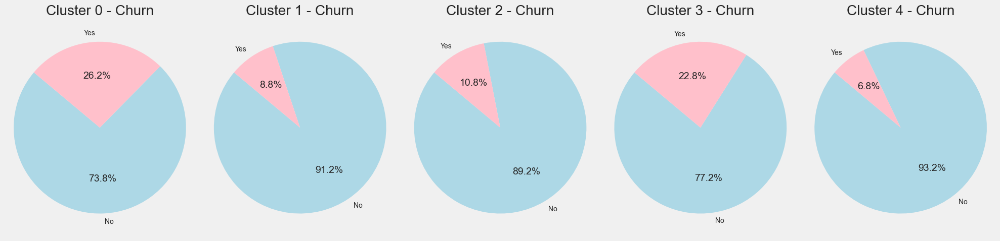

In [181]:
plt.figure(figsize=(20, 5))
colors = ['lightblue', 'pink']
for i, cluster_label in enumerate(np.unique(clusters), 1):
    plt.subplot(1, len(np.unique(clusters)), i)
    for feature in ['Churn']:
        cluster_data = df[df['Cluster'] == cluster_label][feature]
        feature_counts = cluster_data.value_counts()
        sorted_counts = feature_counts.sort_values(ascending=False)
        labels = ['No', 'Yes'] if len(sorted_counts) >= 2 else [str(sorted_counts.index[0]), str(sorted_counts.index[1])]  
        plt.pie(sorted_counts, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors)
        plt.title(f'Cluster {cluster_label} - {feature}')
        plt.axis('equal')
plt.tight_layout()
plt.show()


Zaključak: najveću tendenciju za prestanak koršćenja usluga kompanije imaju korisnici grupisani u Klaster 0 i 3. Dakle, najkritičniji su korisnici koji dosta kraće koriste usluge neke kompanije i kupuju mobilne telefone i laptopove, bez obzira na način plaćanja. Stoga, trebalo bi veću pažnju posvetiti marketingu ovih proizvoda, kao i razmatranju uvodjenja eventualnih benefita, poput: programa lojalosti, personalizacije ponude, posebnih popusta itd.

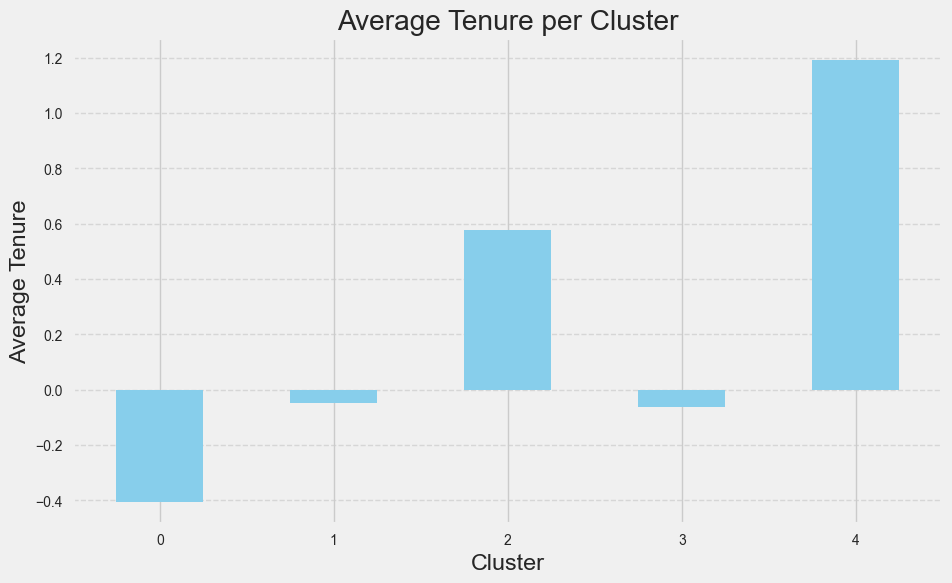

In [182]:
average_tenure_per_cluster = df.groupby('Cluster')['Tenure'].mean()

plt.figure(figsize=(10, 6))
average_tenure_per_cluster.plot(kind='bar', color='skyblue')
plt.title('Average Tenure per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Average Tenure')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


Sa plota se jasno vidi da korisnici iz klastera 0 i 3 evidentno imaju najmanju vrednost atributa "Tenure", što znači da generalno najmanje koriste usluge kompanije.

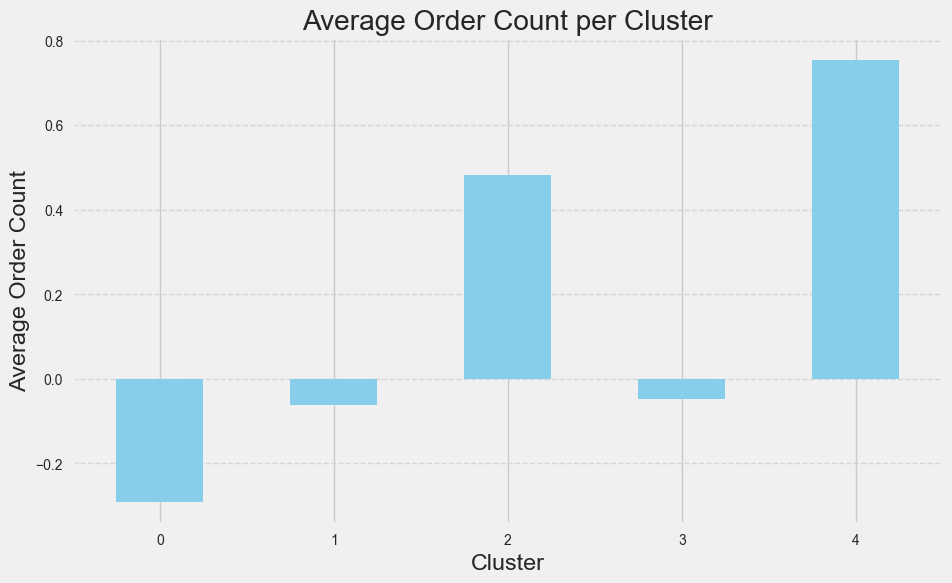

In [183]:
average_tenure_per_cluster = df.groupby('Cluster')['OrderCount'].mean()

plt.figure(figsize=(10, 6))
average_tenure_per_cluster.plot(kind='bar', color='skyblue')
plt.title('Average Order Count per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Average Order Count')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Slično se može zaključiti i za fičer "Order Count", odnosno broj porudžbina.

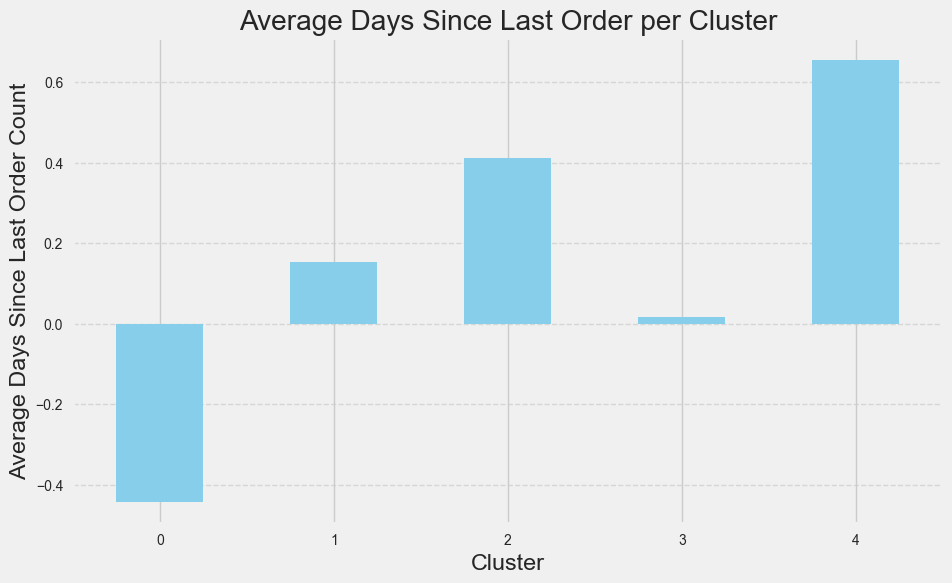

In [184]:
average_tenure_per_cluster = df.groupby('Cluster')['DaySinceLastOrder'].mean()

plt.figure(figsize=(10, 6))
average_tenure_per_cluster.plot(kind='bar', color='skyblue')
plt.title('Average Days Since Last Order per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Average Days Since Last Order Count')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Isto važi i za ovaj atribut "DaySinceLastOrder" - generalno ovim klasterima pripadaju "noviji" korisnici koji u početku imanu tendenciju da češće naručuju, te je vreme proteklo od poslednje narudžbine kraće.

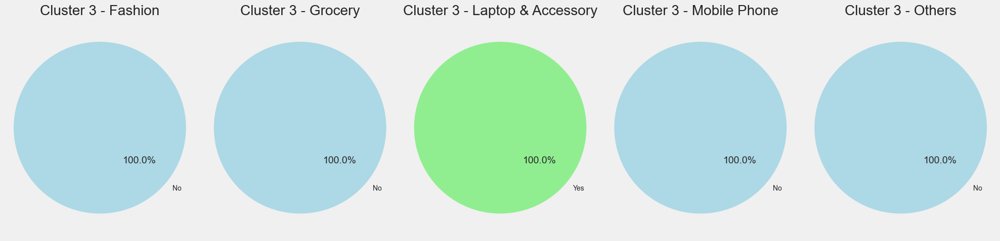

In [188]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 5))

features = ['PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others']

for i, feature in enumerate(features, 1):
    plt.subplot(1, len(features), i)
    cluster_data = df[df['Cluster'] == 1]
    feature_counts = cluster_data[feature].value_counts()
    labels = feature_counts.index.tolist()  
    
    labels = ['Yes' if label > 0 else 'No' for label in labels]
    
    colors = ['lightgreen' if label == 'Yes' else 'lightblue' for label in labels]
    
    feature_counts_percentage = (feature_counts / feature_counts.sum()) * 100  
    plt.pie(feature_counts_percentage, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors)
    plt.title(f'Cluster 3 - {feature.split("_")[1]}')
    plt.axis('equal')

plt.tight_layout()
plt.show()

Korisnici grupisani u klaster 3 isključivo naručuju kategoriju Laptop

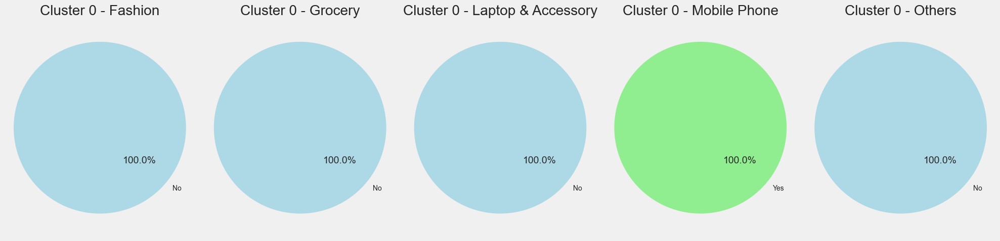

In [190]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 5))

features = ['PreferedOrderCat_Fashion', 'PreferedOrderCat_Grocery', 'PreferedOrderCat_Laptop & Accessory', 'PreferedOrderCat_Mobile Phone', 'PreferedOrderCat_Others']

for i, feature in enumerate(features, 1):
    plt.subplot(1, len(features), i)
    cluster_data = df[df['Cluster'] == 0]
    feature_counts = cluster_data[feature].value_counts()
    labels = feature_counts.index.tolist()  
    
    labels = ['Yes' if label > 0 else 'No' for label in labels]
    
    colors = ['lightgreen' if label == 'Yes' else 'lightblue' for label in labels]
    
    feature_counts_percentage = (feature_counts / feature_counts.sum()) * 100  
    plt.pie(feature_counts_percentage, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors)
    plt.title(f'Cluster 0 - {feature.split("_")[1]}')
    plt.axis('equal')

plt.tight_layout()
plt.show()


Korisnici grupisani u klaster 0 isključivo naručuju kategoriju Mobilni telefoni.

#### Analiza ostalih (potencijalno interesantnih) fičera

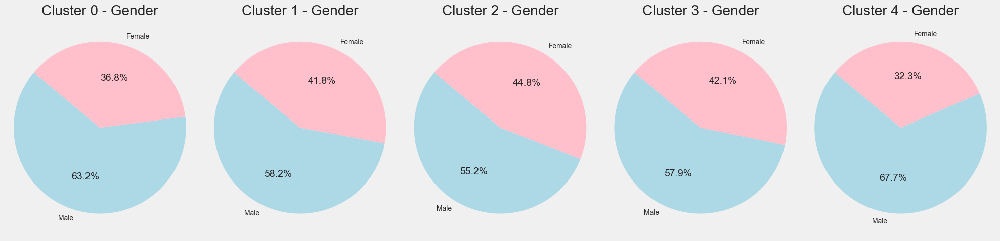

In [192]:
plt.figure(figsize=(20, 5))
colors = ['lightblue', 'pink']
for i, cluster_label in enumerate(np.unique(clusters), 1):
    plt.subplot(1, len(np.unique(clusters)), i)
    for feature in ['Gender']:
        cluster_data = df[df['Cluster'] == cluster_label][feature]
        feature_counts = cluster_data.value_counts()
        sorted_counts = feature_counts.sort_values(ascending=False)
        labels = ['Male', 'Female'] if len(sorted_counts) >= 2 else [str(sorted_counts.index[0]), str(sorted_counts.index[1])]  
        plt.pie(sorted_counts, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors)
        plt.title(f'Cluster {cluster_label} - {feature}')
        plt.axis('equal')
plt.tight_layout()
plt.show()


Korisnike u klasterima sa visokim odustankom (Churn) pretežno čine muškarci, žene su manje zastupljene u odnosu na ostale klastere.

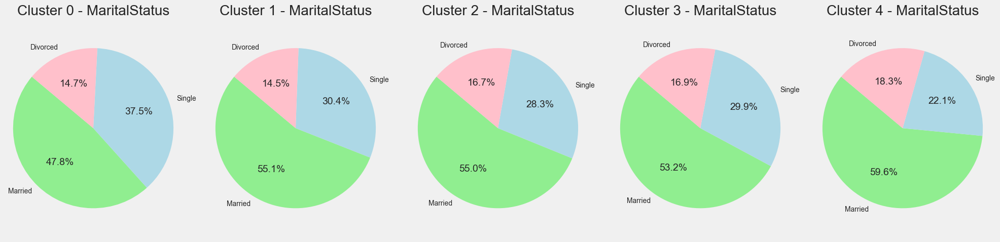

In [193]:
plt.figure(figsize=(20, 5))
colors = ['lightgreen', 'lightblue', 'pink']
for i, cluster_label in enumerate(np.unique(clusters), 1):
    plt.subplot(1, len(np.unique(clusters)), i)
    for feature in ['MaritalStatus']:
        cluster_data = df[df['Cluster'] == cluster_label][feature]
        feature_counts = cluster_data.value_counts()
        sorted_counts = feature_counts.sort_values(ascending=False)
        labels = ['Married', 'Single', 'Divorced'] if len(sorted_counts) >= 2 else [str(sorted_counts.index[0]), str(sorted_counts.index[1])]  
        plt.pie(sorted_counts, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors)
        plt.title(f'Cluster {cluster_label} - {feature}')
        plt.axis('equal')
plt.tight_layout()
plt.show()


Korisnici u klasterima sa visokim odustajanjem od kupovine i korišćenja usluga kompanije češće pripadaju kategoriji "Single" u odnosu na ostale korisnike. Drastično manje korisnika u braku ("Married") u odnosu na ostale klastere.

#### Još neki interesantni zaključci

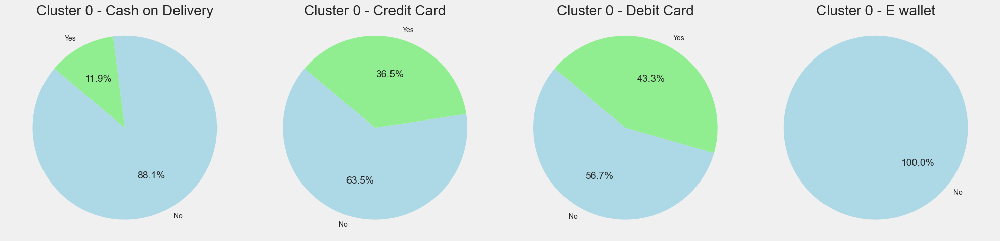

In [197]:
plt.figure(figsize=(20, 5))

features = ['PreferredPaymentMode_Cash on Delivery', 'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card', 'PreferredPaymentMode_E wallet']
colors = ['lightblue', 'lightgreen']

for i, feature in enumerate(features, 1):
    plt.subplot(1, len(features), i)
    cluster_data = df[df['Cluster'] == 0]
    feature_counts = cluster_data[feature].value_counts()
    if len(feature_counts) >= 2:
        labels = ['No', 'Yes']
    else:
        labels = ['No'] 
    feature_counts_percentage = (feature_counts / feature_counts.sum()) * 100  
    plt.pie(feature_counts_percentage, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors)
    plt.title(f'Cluster 0 - {feature.split("_")[1]}')
    plt.axis('equal')

plt.tight_layout()
plt.show()

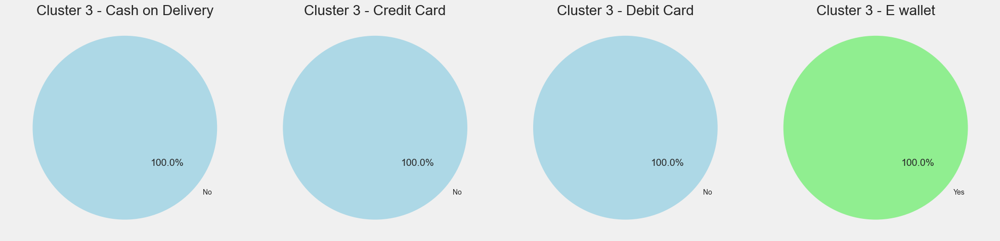

In [198]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 5))

features = ['PreferredPaymentMode_Cash on Delivery', 'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card', 'PreferredPaymentMode_E wallet']

for i, feature in enumerate(features, 1):
    plt.subplot(1, len(features), i)
    cluster_data = df[df['Cluster'] == 3]
    feature_counts = cluster_data[feature].value_counts()
    labels = feature_counts.index.tolist()  
    
    labels = ['Yes' if label > 0 else 'No' for label in labels]
    
    colors = ['lightgreen' if label == 'Yes' else 'lightblue' for label in labels]
    
    feature_counts_percentage = (feature_counts / feature_counts.sum()) * 100  
    plt.pie(feature_counts_percentage, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors)
    plt.title(f'Cluster 3 - {feature.split("_")[1]}')
    plt.axis('equal')

plt.tight_layout()
plt.show()


Zanimljivo je da, bez obzira na to što i klaster 0 i klaster 3 sadrže korisnike sa visokom stopom odustanka od korišćenja usluga neke kompanije, korisnici klastera 3 isključivo plaćaju E-novčanikom, dok korisnici klastera 2 plaćaju svime osim E-nočanikom (kartice, keš). Stoga, zaključujemo da način plaćanja nema neki značajniji uticaj na odustanak od kupovine.